#Hybrid Arima - LSTM code - Google Trends

The hybrid ARIMA-LSTM model is open to a variety of experimentation. For ideal performance, a balance must be reached between the levels of volatility that work best for the ARIMA and LSTM models. Using shorter MA periods that result in a non-mesokurtic distribution may achieve a better volatility balance between models.

## Import Libraries

In [1]:
import pandas as pd
pd.set_option('display.max_rows', 500)
import timeit


In [2]:
!pip install -q -U keras-tuner

     |████████████████████████████████| 98 kB 3.9 MB/s 


In [3]:
import keras_tuner as kt

In [4]:
!pip install pmdarima

     |████████████████████████████████| 1.4 MB 7.2 MB/s 
     |████████████████████████████████| 9.8 MB 54.3 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [5]:
import pmdarima

In [6]:
url = 'https://launchpad.net/~mario-mariomedina/+archive/ubuntu/talib/+files'
!wget $url/libta-lib0_0.4.0-oneiric1_amd64.deb -qO libta.deb
!wget $url/ta-lib0-dev_0.4.0-oneiric1_amd64.deb -qO ta.deb
!dpkg -i libta.deb ta.deb
!pip install ta-lib
import talib

Selecting previously unselected package libta-lib0.
(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack libta.deb ...
Unpacking libta-lib0 (0.4.0-oneiric1) ...
Selecting previously unselected package ta-lib0-dev.
Preparing to unpack ta.deb ...
Unpacking ta-lib0-dev (0.4.0-oneiric1) ...
Setting up libta-lib0 (0.4.0-oneiric1) ...
Setting up ta-lib0-dev (0.4.0-oneiric1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Processing triggers for libc-bin (2.27-3ubuntu1.3) ...
/sbin/ldconfig.real: /usr/local/lib/python3.7/dist-packages/ideep4py/lib/libmkldnn.so.0 is not a symbolic link

     |████████████████████████████████| 268 kB 8.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for ta-lib: filename=TA_Lib-0.4.22-cp37-cp37m-linux_x86_64.whl size=1465648 sha256=6864bc894fca760ea7a1568a10d29f53fda00cad2672992e2a9901b7a32c8f74
  Stored in direc

In [7]:
import tensorflow
import statsmodels.tsa.api
import keras
import sklearn

In [8]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Bidirectional,BatchNormalization, Embedding, TimeDistributed, LeakyReLU, GRU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [9]:
from keras.models import Sequential, load_model
from keras.layers import Dense, LSTM, Activation, Dropout
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.regularizers import l1_l2

In [10]:
import math

In [11]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX,VARMAXResults

In [12]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


In [13]:
from matplotlib import pyplot


In [14]:
import json
import datetime
import pandas as pd
import numpy as np
import os
from scipy.stats import kurtosis
import pmdarima as pm
from pmdarima import auto_arima
from talib import abstract
import json
import matplotlib.pyplot as plt
# plt.rcParams.update({'font.size': 16})
from matplotlib.pyplot import figure
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

In [15]:
from keras.utils.generic_utils import get_custom_objects
from tensorflow.keras.utils import plot_model

In [16]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

Reference 1: https://towardsdatascience.com/time-series-forecasting-predicting-stock-prices-using-an-arima-model-2e3b3080bd70

## Load Data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
cd drive/MyDrive/Stock price prediction/Generated datasets

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Generated datasets


In [19]:
df = pd.read_csv("FULL_Data_google_COVID_bull_bear.csv",parse_dates=[0])
df.tail(10)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
1592,1592,1781,1781,1781,150.199997,151.429993,150.059998,150.809998,150.809998,56787900.0,150.565717,148.423811,-1.137777,2.817933,154.059677,142.787944,150.767809,5.009368,93.428749,-0.061228,100.779503,-0.039111,103.599003,-0.022436,2021-11-09,19,112313,1258,0.119141,0.111328,NaN,NaN,NaN,NaN
1593,1593,1782,1782,1782,150.020004,150.130005,147.850006,147.919998,147.919998,65187100.0,150.417145,148.729049,-1.236913,2.144358,153.017766,144.440332,148.869268,4.989888,92.922909,-0.061683,99.694365,-0.039762,101.872301,-0.022657,2021-11-10,19,80301,1470,0.154297,0.109375,NaN,NaN,NaN,NaN
1594,1594,1783,1783,1783,148.960007,149.429993,147.679993,147.869995,147.869995,41000000.0,150.110001,149.060477,-1.165047,1.767475,152.595428,145.525526,148.203086,4.989548,92.416471,-0.062129,98.604584,-0.040391,100.137594,-0.022839,2021-11-11,19,94975,1662,0.102845,0.126915,NaN,NaN,NaN,NaN
1595,1595,1784,1784,1784,148.429993,150.399994,147.479996,149.990005,149.990005,63632600.0,149.895715,149.357144,-0.869308,1.420732,152.198608,146.515681,149.394365,5.003879,91.909483,-0.062566,97.510555,-0.040998,98.396260,-0.022980,2021-11-12,19,55499,797,0.157277,0.080595,NaN,NaN,NaN,NaN
1596,1596,1785,1785,1785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-13,19,146529,2505,0.139459,0.083243,NaN,NaN,NaN,NaN
1597,1597,1786,1786,1786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-11-14,19,40964,479,0.151261,0.100840,NaN,NaN,NaN,NaN
1598,1598,1787,1787,1787,150.369995,151.880005,149.429993,150.000000,150.000000,59222800.0,149.758571,149.602859,-0.907641,1.229694,152.062246,147.143471,149.798122,5.003946,91.401994,-0.062993,96.412672,-0.041581,96.649685,-0.023077,2021-11-15,22,30290,148,0.136737,0.109389,NaN,NaN,NaN,NaN
1599,1599,1788,1788,1788,149.940002,151.490005,149.339996,151.000000,151.000000,59256200.0,149.718571,149.814763,-0.791320,1.236243,152.287250,147.342277,150.599374,5.010635,90.894052,-0.063410,95.311334,-0.042140,94.899260,-0.023130,2021-11-16,22,138962,1294,0.135531,0.115385,NaN,NaN,NaN,NaN
1600,1600,1789,1789,1789,151.000000,155.000000,150.990005,153.490005,153.490005,88807000.0,150.154286,150.040002,-0.657719,1.467121,152.974245,147.105759,152.526461,5.027099,90.385704,-0.063817,94.206941,-0.042673,93.146378,-0.023135,2021-11-17,22,87626,1290,0.100870,0.126957,NaN,NaN,NaN,NaN
1601,1601,1790,1790,1790,153.710007,158.669998,153.050003,157.869995,157.869995,137659100.0,151.162857,150.450002,-0.609656,2.267825,154.985653,145.914351,156.088817,5.055417,89.877000,-0.064214,93.099895,-0.043179,91.392433,-0.023090,2021-11-18,22,111404,1637,0.145098,0.121569,NaN,NaN,NaN,NaN


In [ ]:
cd ..

In [24]:
cd Archana - LSTM Hybrid/Outputs/Gtrends

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/Gtrends


In [25]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name().head(5)

0    Saturday
1      Sunday
3     Tuesday
7    Saturday
8      Sunday
Name: Date, dtype: object

In [26]:
len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

497

In [27]:
len(df)

1602

In [28]:
len(df) - len(pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name())

1105

In [29]:
df.dropna(inplace=True)
len(df)

1080

In [30]:
pd.to_datetime(df[np.isnan(df.Close)==True]['Date']).dt.day_name()

Series([], Name: Date, dtype: object)

In [31]:
df.head(5)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,2,191,191,191,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,4,193,193,193,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,5,194,194,194,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,6,195,195,195,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,9,198,198,198,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


In [32]:
stock_col= list(df.columns)
stock_col = stock_col[4:len(stock_col)]

In [33]:
dataset_final = df[stock_col]

In [34]:
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search,COVID positiveIncrease,COVID deathIncrease,bull score,bear score,fourier bull 10,fourier bull 30,fourier bear 10,fourier bear 30
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15,0,0,0.666667,0.000000,0.142778,0.146810,0.100537,0.099251
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15,0,0,0.400000,0.000000,0.144487,0.145833,0.100630,0.096361
5,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15,0,0,0.142857,0.142857,0.145346,0.145164,0.100672,0.094761
6,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15,0,0,0.333333,0.000000,0.146208,0.144377,0.100711,0.093072
9,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14,0,0,0.000000,0.000000,0.148802,0.141354,0.100808,0.087587


### Data Load for Experiment set 1 with Technical Indicators & google trends

In [35]:
stock_col= list(df.columns)
stock_col = stock_col[4:len(stock_col)-8]
dataset_final = df[stock_col]
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,Date,search
2,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,2017-07-03,15
4,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,2017-07-05,15
5,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,2017-07-06,15
6,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,2017-07-07,15
9,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,2017-07-10,14


In [36]:
# Set the date to datetime data
datetime_series = pd.to_datetime(dataset_final['Date'])
datetime_index = pd.DatetimeIndex(datetime_series.values)
dataset_final = dataset_final.set_index(datetime_index)
dataset_final = dataset_final.sort_values(by='Date')
dataset_final = dataset_final.drop(columns='Date')
dataset_final.head(5)

,Open,High,Low,Close,Adj Close,Volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
2017-07-03,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15
2017-07-05,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,15
2017-07-06,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,15
2017-07-07,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,15
2017-07-10,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,14


### Train & test Dataset for Multistep Process

In [37]:
# Get features and target
X_value = pd.DataFrame(dataset_final.iloc[:, :])
y_value = pd.DataFrame(dataset_final.iloc[:, 3])

In [38]:
y_value.head(5)

,Close
2017-07-03,35.875000
2017-07-05,36.022499
2017-07-06,35.682499
2017-07-07,36.044998
2017-07-10,36.264999


In [39]:
# Normalized the data
X_scaler = MinMaxScaler(feature_range=(-1, 1))
y_scaler = MinMaxScaler(feature_range=(-1, 1))
X_scaler.fit(X_value)
y_scaler.fit(y_value)

MinMaxScaler(feature_range=(-1, 1))

In [40]:
X_scale_dataset = X_scaler.fit_transform(X_value)
y_scale_dataset = y_scaler.fit_transform(y_value)

In [41]:
X_scale_dataset.shape, y_scale_dataset.shape, 

((1080, 21), (1080, 1))

In [42]:
 X_value.shape[1]

21

### N Steps Definition

In [43]:
n_steps_in = 3
n_features = X_value.shape[1] #19 features
n_steps_out = 1


In [44]:
# Reshape the data
'''Set the data input steps and output steps, 
    we use 30 days data to predict 1 day price here, 
    reshape it to (None, input_step, number of features) used for LSTM input'''
# Get X/y dataset
def get_X_y(X_data, y_data):
    X = list()
    y = list()
    yc = list()

    length = len(X_data)
    for i in range(0, length, 1):
        # pdb.set_trace()
        X_value = X_data[i: i + n_steps_in][:, :]
        # print('[',i,': ',i,' + ',n_steps_in,'][:, :]')
        y_value = y_data[i + n_steps_in: i + (n_steps_in + n_steps_out)][:, 0]
        # print('[',i,' + ',n_steps_in,': ',i,' + (',n_steps_in,' + ',n_steps_out,')][:, 0]')
        yc_value = y_data[i: i + n_steps_in][:, :]
        if len(X_value) == 3 and len(y_value) == 1:
            X.append(X_value)
            y.append(y_value)
            yc.append(yc_value)

    return np.array(X), np.array(y), np.array(yc)

In [45]:
# get the train test predict index
def predict_index(dataset, X_train, n_steps_in, n_steps_out):

    # get the predict data (remove the in_steps days)
    train_predict_index = dataset.iloc[n_steps_in : X_train.shape[0] + n_steps_in + n_steps_out - 1, :].index
    test_predict_index = dataset.iloc[X_train.shape[0] + n_steps_in:, :].index

    return train_predict_index, test_predict_index


In [46]:
def mean_absolute_percentage_error(actual, prediction):
    actual = pd.Series(actual)
    prediction = pd.Series(prediction)
    return 100 * np.mean(np.abs((actual - prediction))/actual)

In [47]:
# Split train/test dataset
def split_train_test(data):
    train_size = round(len(X) * 0.75)
    data_train = data[0:train_size]
    data_test = data[train_size:]
    return data_train, data_test

In [48]:
# Get data and check shape
X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
# pdb.set_trace()
X_train, X_test, = split_train_test(X)
y_train, y_test, = split_train_test(y)
yc_train, yc_test, = split_train_test(yc)
index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

In [49]:
# %% --------------------------------------- Save dataset -----------------------------------------------------------------
print('X shape: ', X.shape)
print('y shape: ', y.shape)
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('y_c_train shape: ', yc_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)
print('y_c_test shape: ', yc_test.shape)
print('index_train shape:', index_train.shape)
print('index_test shape:', index_test.shape)


X shape:  (1077, 3, 21)
y shape:  (1077, 1)
X_train shape:  (808, 3, 21)
y_train shape:  (808, 1)
y_c_train shape:  (808, 3, 1)
X_test shape:  (269, 3, 21)
y_test shape:  (269, 1)
y_c_test shape:  (269, 3, 1)
index_train shape: (808,)
index_test shape: (269,)


In [50]:
output_dim = y_train.shape[1]
output_dim

1

In [51]:
df = dataset_final.copy()

In [52]:
df.rename(columns={'Date':'date','Open':'open','Low':'low','Close':'close','Volume':'volume','High':'high'}, inplace = True)
df.reset_index(drop=True,inplace=True)

In [53]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
0,36.220001,36.325001,35.775002,35.875,34.054882,57111200.0,36.173571,36.751904,0.303356,0.96052,38.672945,34.830864,35.924548,3.55177,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15


In [54]:
# df.drop(['volume', 'MACD','20SD','logmomentum','absolute of 3 comp','angle of 3 comp','absolute of 6 comp','angle of 6 comp','absolute of 9 comp','angle of 9 comp'], axis='columns', inplace=True) # only keep columns that can help as residuals in Arima Hybrid

In [55]:
df.head(1)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
0,36.220001,36.325001,35.775002,35.875,34.054882,57111200.0,36.173571,36.751904,0.303356,0.96052,38.672945,34.830864,35.924548,3.55177,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15


### Train & Test Length

In [56]:
test_len = len(X_test)

In [57]:
train_len = len(X_train )

In [58]:
test_len, train_len

(269, 808)

## Kurtosis Review

In [59]:
   # Initialize moving averages from Ta-Lib, store functions in dictionary
# talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'MIDPRICE', 'T3', 'TEMA', 'TRIMA'] remove midprice due to outputbeing univariate
talib_moving_averages = ['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT',  'T3', 'TEMA', 'TRIMA'] 
functions = {}
for ma in talib_moving_averages:
      functions[ma] = abstract.Function(ma)

    # Determine kurtosis "K" values for MA period 4-30
kurtosis_results = {'period': []}
for i in range(4, 100): # 100
  kurtosis_results['period'].append(i)
  for ma in talib_moving_averages:
              # Run moving average, remove last N days (used later for test data set), trim MA result to last 30 days
              ma_output = functions[ma](df[:-test_len], i).tail(14)
              # Determine kurtosis "K" value
              k = kurtosis(ma_output, fisher=False)
              # add to dictionary
              if ma not in kurtosis_results.keys():
                  kurtosis_results[ma] = []
              kurtosis_results[ma].append(k)

kurtosis_results = pd.DataFrame(kurtosis_results)
kurtosis_results.to_csv('kurtosis_results.csv')

In [60]:
kurtosis_results.head(5)

,period,SMA,EMA,WMA,DEMA,KAMA,MIDPOINT,T3,TEMA,TRIMA
0,4,2.272452,2.652772,2.896972,3.800351,2.299585,2.171369,1.978458,4.609342,2.411225
1,5,1.839451,2.355815,2.481058,3.327525,1.841282,1.826597,1.640277,4.262302,1.994382
2,6,1.583886,2.159532,2.194320,2.945924,1.536136,1.605787,1.510972,3.878845,1.679710
3,7,1.461290,2.026758,1.990629,2.651927,1.506197,1.558096,1.514015,3.510432,1.486348
4,8,1.447516,1.935302,1.853935,2.429648,1.509566,1.621595,1.601580,3.184123,1.373337


## Optimized periods

In [63]:
# Determine period with K closest to 3 +/-5%
optimized_period = {}
# https://pypi.org/project/TA-Lib/ determines the type of moving average to use
# https://pandas.pydata.org/pandas-docs/version/0.17.0/generated/pandas.DataFrame.at.html#pandas.DataFrame.at
for ma in talib_moving_averages:
        difference = np.abs(kurtosis_results[ma] - 3)
        df_arimahyb = pd.DataFrame({'difference': difference, 'period': kurtosis_results['period']})
        df_arimahyb = df_arimahyb.sort_values(by=['difference'], ascending=True).reset_index(drop=True)
        if df_arimahyb.at[0, 'difference'] < 3 * 0.05:
            optimized_period[ma] = df_arimahyb.at[0, 'period']
        else:
            print(ma + ' is not viable, best K greater or less than 3 +/-5%')

print('\nOptimized periods:', optimized_period)

TRIMA is not viable, best K greater or less than 3 +/-5%

Optimized periods: {'SMA': 17, 'EMA': 51, 'WMA': 49, 'DEMA': 89, 'KAMA': 18, 'MIDPOINT': 14, 'T3': 19, 'TEMA': 9}


In [64]:
optimized_period

{'DEMA': 89,
 'EMA': 51,
 'KAMA': 18,
 'MIDPOINT': 14,
 'SMA': 17,
 'T3': 19,
 'TEMA': 9,
 'WMA': 49}

## Simulation Keys

In [ ]:
simulation = {}
for ma in optimized_period:
        print(ma)
        print(functions[ma])
        print ( int( optimized_period[ma]))
        # if ma in ['EMA','WMA','DEMA','KAMA','MIDPOINT']:
        #   print(ma)
        low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
        low_vol = low_vol.fillna(0)
        high_vol = pd.DataFrame()
        df2 = df.copy()
        for i in df2.columns:
          if i in low_vol.columns:
            high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Pa

In [ ]:
low_vol.tail(20)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
1060,140.200839,141.942909,138.524500,140.171495,139.966842,8.852448e+07,142.165478,146.699207,1.815578,4.572948,155.845103,137.553312,140.365562,4.935800,105.739092,-0.047411,125.318767,-0.018291,140.471430,-0.008749,19.573385
1061,139.425914,141.705469,138.035200,140.698014,140.492650,8.620711e+07,141.528981,145.978836,2.115887,4.189393,154.357621,137.600050,140.587196,4.939545,105.263514,-0.048037,124.464999,-0.019222,139.335869,-0.009472,19.632022
1062,140.773058,142.636405,139.932338,141.733666,141.526843,7.421445e+07,141.294887,145.298477,2.211018,3.647690,152.593858,138.003097,141.351509,4.946870,104.786174,-0.048658,123.598217,-0.020150,138.164839,-0.010188,19.698090
1063,142.179695,143.266994,141.127848,142.249061,142.041527,6.519616e+07,141.224295,144.665584,2.093072,3.241276,151.148137,138.183031,141.949877,4.950518,104.307114,-0.049275,122.718682,-0.021074,136.959041,-0.010898,19.763505
1064,142.253947,144.008334,141.546689,142.555532,142.347589,6.254214e+07,141.336839,144.184381,1.988881,2.884864,149.954110,138.414652,142.353647,4.952685,103.826381,-0.049886,121.826667,-0.021994,135.719217,-0.011600,20.311676
1065,142.782738,143.732491,141.438660,142.125353,141.918068,6.542511e+07,141.385297,143.758659,1.774804,2.626682,149.012024,138.505294,142.201451,4.949632,103.344020,-0.050491,120.922446,-0.022909,134.446150,-0.012293,20.671514
1066,142.153085,142.656915,140.466684,141.564232,141.357788,7.040262e+07,141.585336,143.387397,1.634667,2.376817,148.141030,138.633764,141.776638,4.945637,102.860075,-0.051092,120.006305,-0.023818,133.140665,-0.012977,20.900131
1067,142.177201,143.194327,140.977156,142.610382,142.402435,6.948112e+07,141.933749,143.094536,1.573317,2.074153,147.242842,138.946230,142.332468,4.953023,102.374593,-0.051687,119.078535,-0.024722,131.803627,-0.013650,21.038585
1068,143.009006,144.052615,142.286776,143.812497,143.602819,6.805244e+07,142.378675,142.879716,1.473333,1.874158,146.628032,139.131400,143.319154,4.961467,101.887619,-0.052275,118.139433,-0.025618,130.435938,-0.014311,21.116168
1069,143.380322,145.547752,142.940349,145.397429,145.185452,7.592729e+07,142.902069,142.813890,1.447641,1.844159,146.502207,139.125573,144.704671,4.972505,101.399198,-0.052858,117.189304,-0.026508,129.038540,-0.014959,21.153587


In [ ]:
high_vol.head(10)

,open,high,low,close,Adj Close,volume,MA7,MA21,MACD,20SD,upper_band,lower_band,EMA,logmomentum,absolute of 3 comp,angle of 3 comp,absolute of 6 comp,angle of 6 comp,absolute of 9 comp,angle of 9 comp,search
0,36.220001,36.325001,35.775002,35.875000,34.054882,57111200.0,36.173571,36.751904,0.303356,0.960520,38.672945,34.830864,35.924548,3.551770,38.458011,0.046984,29.704545,0.102857,43.304973,-0.053955,15.0
1,35.922501,36.197498,35.680000,36.022499,34.194897,86278400.0,36.095357,36.634762,0.328795,0.852735,38.340231,34.929292,35.989849,3.555991,38.240991,0.049445,29.954520,0.099254,43.438321,-0.053936,15.0
2,35.755001,35.875000,35.602501,35.682499,33.872143,96515200.0,35.984999,36.495238,0.346702,0.677629,37.850495,35.139980,35.784949,3.546235,38.027974,0.051918,30.209839,0.095602,43.557403,-0.053820,15.0
3,35.724998,36.187500,35.724998,36.044998,34.216255,76806800.0,36.001071,36.362023,0.387422,0.387634,37.137291,35.586756,35.958315,3.556633,37.818962,0.054401,30.470232,0.091907,43.662260,-0.053608,15.0
4,36.027500,36.487499,35.842499,36.264999,34.425095,84362400.0,35.973571,36.243809,0.388315,0.308042,36.859893,35.627725,36.162771,3.562891,37.613953,0.056893,30.735430,0.088177,43.752965,-0.053302,14.0
5,36.182499,36.462502,36.095001,36.382500,34.536625,79127200.0,36.039642,36.202738,0.372153,0.308860,36.820458,35.585018,36.309257,3.566217,37.412947,0.059392,31.005161,0.084416,43.829622,-0.052901,14.0
6,36.467499,36.544998,36.205002,36.435001,34.586472,99538000.0,36.101071,36.206547,0.317572,0.295861,36.798268,35.614826,36.393086,3.567700,37.215939,0.061899,31.279154,0.080632,43.892360,-0.052406,14.0
7,36.375000,37.122501,36.360001,36.942501,35.068211,100797600.0,36.253571,36.220595,0.322643,0.340687,36.901969,35.539221,36.759363,3.581920,37.022928,0.064410,31.557136,0.076830,43.941338,-0.051818,14.0
8,36.992500,37.332500,36.832500,37.259998,35.369610,80528400.0,36.430357,36.266785,0.257925,0.410484,37.087753,35.445818,37.093120,3.590715,36.833908,0.066926,31.838833,0.073014,43.976744,-0.051137,14.0
9,37.205002,37.724998,37.142502,37.389999,35.493000,95174000.0,36.674285,36.329523,0.184267,0.445597,37.220717,35.438330,37.291039,3.594294,36.648875,0.069445,32.123972,0.069192,43.998789,-0.050365,16.0


## Common Functions

In [65]:
def get_arima(dataframe,original_data, train_len, test_len):
    # prepare train and test data
    X_value = pd.DataFrame(dataframe.iloc[:, :])
    y_value = pd.DataFrame(dataframe.iloc[:, 3])
    X_train, X_test = split_train_test(X_value)
    y_train, y_test = split_train_test(y_value)
    yc_train,yc_test = split_train_test(original_data)
    # y_train_ = y_train['close'].to_list()
    # y_test_ = y_test['close'].to_list()
    yc = yc_test.values.tolist()
    y_train_list = y_train['close'].values.tolist() 
    y_test_list = y_test['close'].values.tolist()                                           
      
    # Initialize model
    model = auto_arima(y_train_list,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
                  suppress_warnings=True,stepwise=True,seasonal=True)
    print(model.summary())
        # Determine model parameters
    model.fit(y_train_list,disp= 0)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

        # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
            model = pmdarima.ARIMA(order=order)
            model.fit(y_train_list,disp= 0)
            # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')
            prediction.append(model.predict()[0])
            y_train_list.append(y_test_list[i])

    # Generate error data
    mse = mean_squared_error(yc_test, prediction)
    rmse = mse ** 0.5
    # mape = mean_absolute_percentage_error(pd.Series(yc_test).values.tolist(), pd.Series(predictionte).values.tolist() )
    mae = mean_absolute_error(pd.Series(yc_test).values.tolist() , pd.Series(prediction).values.tolist() )
    return yc, prediction, mse, rmse, mae

In [66]:
def plot_train(simulation,SIM):
  train_predict_index = np.load("index_train_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final_tr']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final_tr']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final_tr']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Train Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Train RMSE for {SIM} -----", RMSE)
  print(f"----- Train_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Train MAE LSTM for {SIM} -----", MAE)

In [67]:
def plot_test(simulation, SIM):
  test_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

      # rescaled_real_y = y_scaler.inverse_transform(y_train)#Real closing price data
      # rescaled_predicted_y = y_scaler.inverse_transform(train_yhat)#Predicted closing price data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['final']['prediction'][i], columns=["predicted_price"],
                                  index=test_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)#This is a dataframe with each column containing the predicted daily closing price
      #
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['final']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['final']['original'][i], columns=["real_price"],
                                index=test_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)#This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Testing for Hybrid Arima LSTM with MA - {SIM} : {fileimg}",fontsize=20)
  sf = fileimg+'_'+SIM+'Test Hybrid Arima LSTM Pred Out.png'
  plt.savefig(sf,dpi='figure')
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Test RMSE for {SIM}-----", RMSE)
  print(f"----- Test_MSE_LSTM for {SIM}-----", MSE)
  print(f"----- Test_MAE_LSTM for {SIM}-----", MAE)

In [68]:
def plot_train_high(simulation, SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['high_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['high_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['high_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"----- Individual LSTM RMSE for {SIM} -----", RMSE)
  print(f"----- Individual LSTM_MSE_LSTM for {SIM} -----", MSE)
  print(f"----- Individual LSTM MAE LSTM for {SIM} -----", MAE)

In [69]:
def plot_train_low(simulation , SIM):
  train_predict_index = np.load("index_test_appl.npy", allow_pickle=True)#Dates for train data

  predict_result = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['prediction'])):
          y_predict = pd.DataFrame(simulation[SIM]['low_vol']['prediction'][i], columns=["predicted_price"],
                                  index=train_predict_index[i:i + output_dim])
          predict_result = pd.concat([predict_result, y_predict], axis=1, sort=False)
          
          #This is a dataframe with each column containing the predicted daily closing price
  real_price = pd.DataFrame()
  for i in range(len(simulation[SIM]['low_vol']['original'])):
          y_train = pd.DataFrame(simulation[SIM]['low_vol']['original'][i], columns=["real_price"],
                                index=train_predict_index[i:i + output_dim])
          real_price = pd.concat([real_price, y_train], axis=1, sort=False)  #This is a dataframe with each column containing the real daily closing price

  predict_result['predicted_mean'] = predict_result.mean(axis=1)#Adding a column with the daily predicted closing price value
  real_price['real_mean'] = real_price.mean(axis=1)#Adding a column with the daily real closing price value
      #
      # Plot the predicted result
  plt.figure(figsize=(16, 8))
  plt.plot(real_price["real_mean"])
  plt.plot(predict_result["predicted_mean"], color='r')
  plt.xlabel("Date")
  plt.ylabel("Stock price")
  plt.legend(("Real price", "Predicted price"), loc="upper left", fontsize=16)
  plt.title(f"The result of Training for {SIM}", fontsize=20)
  plt.show()

      # Calculate RMSE
  predicted = predict_result["predicted_mean"]
  real = real_price["real_mean"]
  RMSE = np.sqrt(mean_squared_error(predicted, real))
  MSE = mean_squared_error(predicted, real)
  MAE = mean_absolute_error(predicted, real)
  print(f"-----Arima RMSE for {SIM} -----", RMSE)
  print(f"----- Arima MSE for {SIM} -----", MSE)
  print(f"----- Arima MAE for {SIM} -----", MAE)

In [70]:
import os
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid/Outputs/Gtrends'

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 1

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # cts().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.76 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.13 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.99 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=1.06 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.28 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 3.706 seconds
                               SARIMAX Results                                
Dep.

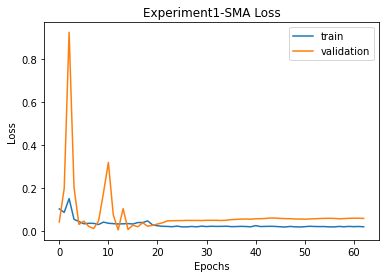


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 216.26215770312788 
RMSE:	 14.705854538350632 
MAPE:	 11.92367463073216
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.15 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.14 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.89 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0

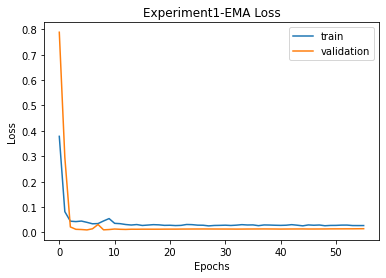


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 216.26215770312788 
RMSE:	 14.705854538350632 
MAPE:	 11.92367463073216

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.96033735804009 
RMSE:	 11.08874823224155 
MAPE:	 9.251696034357076
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0

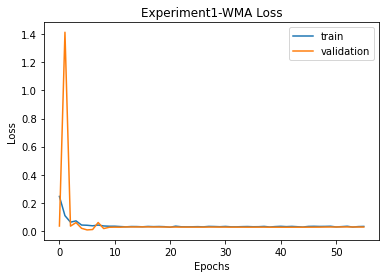


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 216.26215770312788 
RMSE:	 14.705854538350632 
MAPE:	 11.92367463073216

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.96033735804009 
RMSE:	 11.08874823224155 
MAPE:	 9.251696034357076

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 56.80196950717294 
RMSE:	 7.5367081346681415 
MAPE:	 5.956122993340066
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.55 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AI

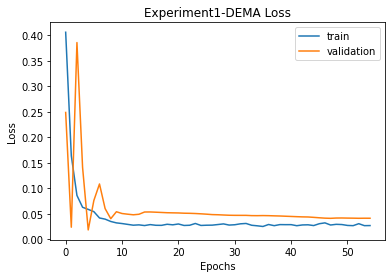


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 216.26215770312788 
RMSE:	 14.705854538350632 
MAPE:	 11.92367463073216

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.96033735804009 
RMSE:	 11.08874823224155 
MAPE:	 9.251696034357076

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 56.80196950717294 
RMSE:	 7.5367081346681415 
MAPE:	 5.956122993340066

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	42.16% Accuracy
MSE:	 120.51656357671082 
RMSE:	 10.978003624371365 
MAPE:	 9.343426819843298
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.50 sec
 ARIMA(0,3

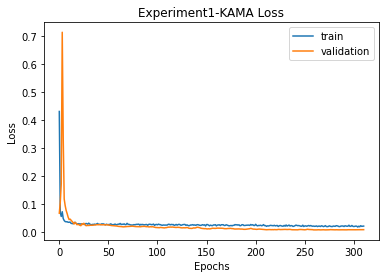


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 216.26215770312788 
RMSE:	 14.705854538350632 
MAPE:	 11.92367463073216

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.96033735804009 
RMSE:	 11.08874823224155 
MAPE:	 9.251696034357076

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 56.80196950717294 
RMSE:	 7.5367081346681415 
MAPE:	 5.956122993340066

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	42.16% Accuracy
MSE:	 120.51656357671082 
RMSE:	 10.978003624371365 
MAPE:	 9.343426819843298

KAMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 80.73205723036311 
RMSE:	 8.985101959931402 
MAPE:	 7.079003376879244
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on

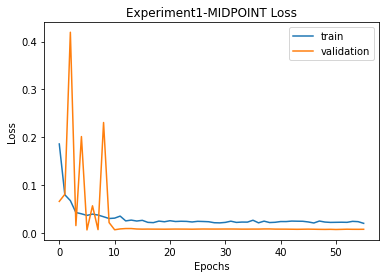


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 216.26215770312788 
RMSE:	 14.705854538350632 
MAPE:	 11.92367463073216

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.96033735804009 
RMSE:	 11.08874823224155 
MAPE:	 9.251696034357076

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 56.80196950717294 
RMSE:	 7.5367081346681415 
MAPE:	 5.956122993340066

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	42.16% Accuracy
MSE:	 120.51656357671082 
RMSE:	 10.978003624371365 
MAPE:	 9.343426819843298

KAMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 80.73205723036311 
RMSE:	 8.985101959931402 
MAPE:	 7.079003376879244

MIDPOINT
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 75.80130571921515 
RMSE:	 8.70639453041356 
MAPE:	 7.130945881105426
T3
T3([input_arrays], [t

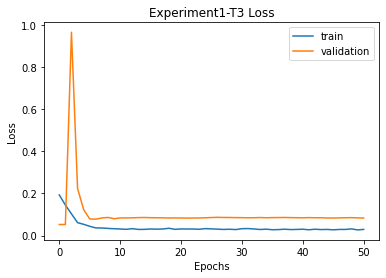


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 216.26215770312788 
RMSE:	 14.705854538350632 
MAPE:	 11.92367463073216

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.96033735804009 
RMSE:	 11.08874823224155 
MAPE:	 9.251696034357076

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 56.80196950717294 
RMSE:	 7.5367081346681415 
MAPE:	 5.956122993340066

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	42.16% Accuracy
MSE:	 120.51656357671082 
RMSE:	 10.978003624371365 
MAPE:	 9.343426819843298

KAMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 80.73205723036311 
RMSE:	 8.985101959931402 
MAPE:	 7.079003376879244

MIDPOINT
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 75.80130571921515 
RMSE:	 8.70639453041356 
MAPE:	 7.130945881105426

T3
Prediction vs Close:

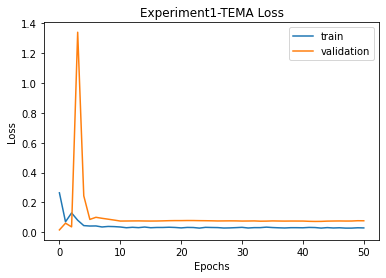


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 216.26215770312788 
RMSE:	 14.705854538350632 
MAPE:	 11.92367463073216

EMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 122.96033735804009 
RMSE:	 11.08874823224155 
MAPE:	 9.251696034357076

WMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 56.80196950717294 
RMSE:	 7.5367081346681415 
MAPE:	 5.956122993340066

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	42.16% Accuracy
MSE:	 120.51656357671082 
RMSE:	 10.978003624371365 
MAPE:	 9.343426819843298

KAMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 80.73205723036311 
RMSE:	 8.985101959931402 
MAPE:	 7.079003376879244

MIDPOINT
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 75.80130571921515 
RMSE:	 8.70639453041356 
MAPE:	 7.130945881105426

T3
Prediction vs Close:

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation1 = {}
    imgfile = 'Experiment1'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation1[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation1_data.json', 'w') as fp:
                  json.dump(simulation1, fp)

              for ma in simulation1.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation1[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation1[ma]['final']['mse'],
                        '\nRMSE:\t', simulation1[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation1[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
            # code you want to evaluate
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment1.png to Experiment1 (2).png


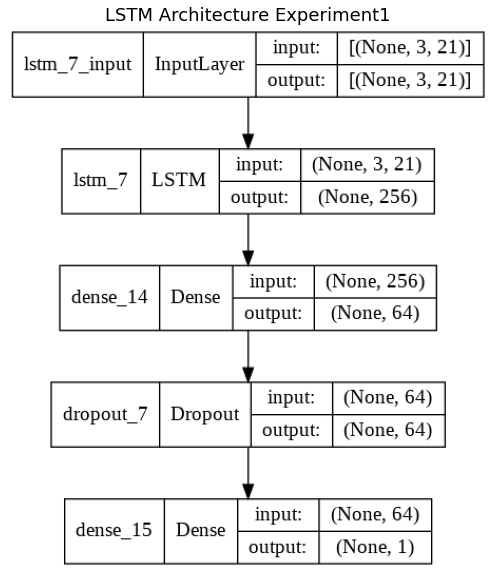

In [ ]:
img = cv2.imread('Experiment1.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

Excess kurtosis is a metric that compares the kurtosis of a distribution against the kurtosis of a normal distribution. The kurtosis of a normal distribution equals 3. Therefore, the excess kurtosis is found using the formula below:

Excess Kurtosis = Kurtosis – 3

### Model Plots

In [ ]:
np.save("X_train_appl.npy", X_train)
np.save("y_train_appl.npy", y_train)
np.save("X_test_appl.npy", X_test)
np.save("y_test_appl.npy", y_test)
np.save("yc_train_appl.npy", yc_train)
np.save("yc_test_appl.npy", yc_test)
np.save('index_train_appl.npy', index_train)
np.save('index_test_appl.npy', index_test)

In [ ]:
list(simulation1.keys())

['SMA', 'EMA', 'WMA', 'DEMA', 'KAMA', 'MIDPOINT', 'T3', 'TEMA']

In [71]:
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)
fileimg = 'Experiment1'

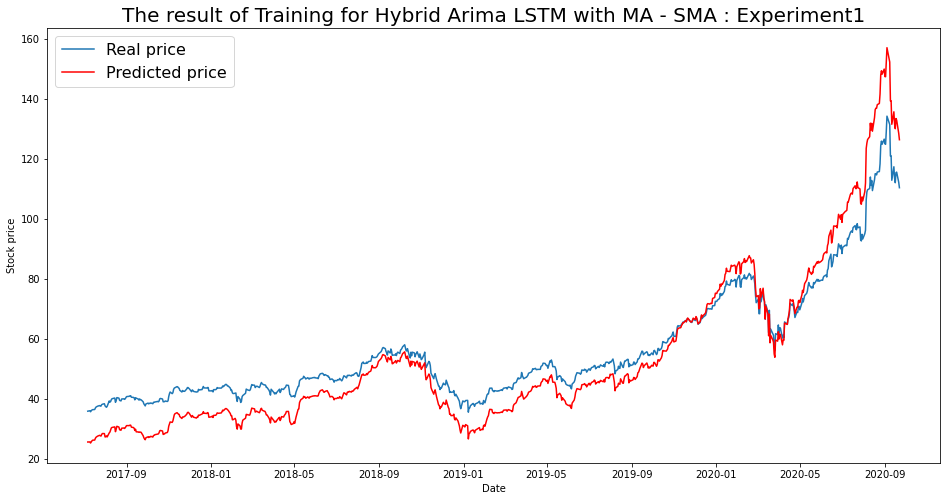

----- Train RMSE for SMA ----- 7.922367251770581
----- Train_MSE_LSTM for SMA ----- 62.763902871926945
----- Train MAE LSTM for SMA ----- 6.766703454283121


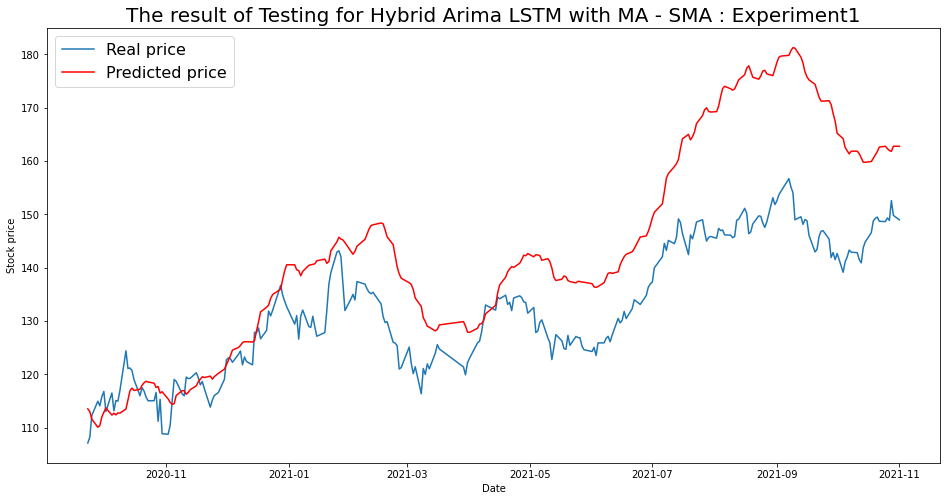

----- Test RMSE for SMA----- 14.705854538350632
----- Test_MSE_LSTM for SMA----- 216.26215770312788
----- Test_MAE_LSTM for SMA----- 11.92367463073216


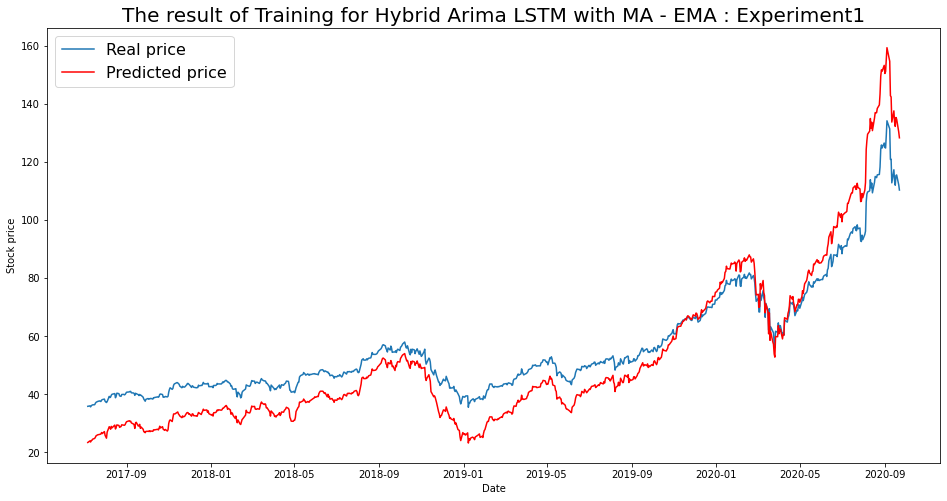

----- Train RMSE for EMA ----- 9.326837823498344
----- Train_MSE_LSTM for EMA ----- 86.98990378583935
----- Train MAE LSTM for EMA ----- 8.227210225627324


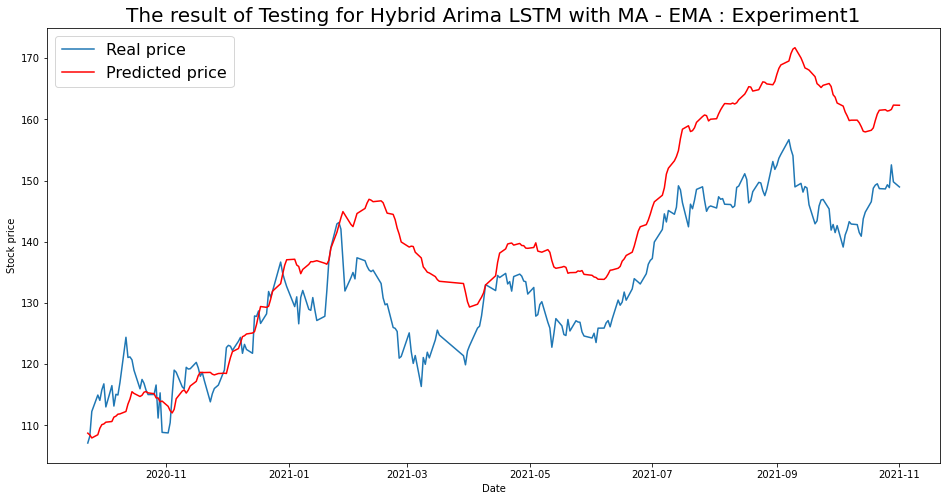

----- Test RMSE for EMA----- 11.08874823224155
----- Test_MSE_LSTM for EMA----- 122.96033735804009
----- Test_MAE_LSTM for EMA----- 9.251696034357076


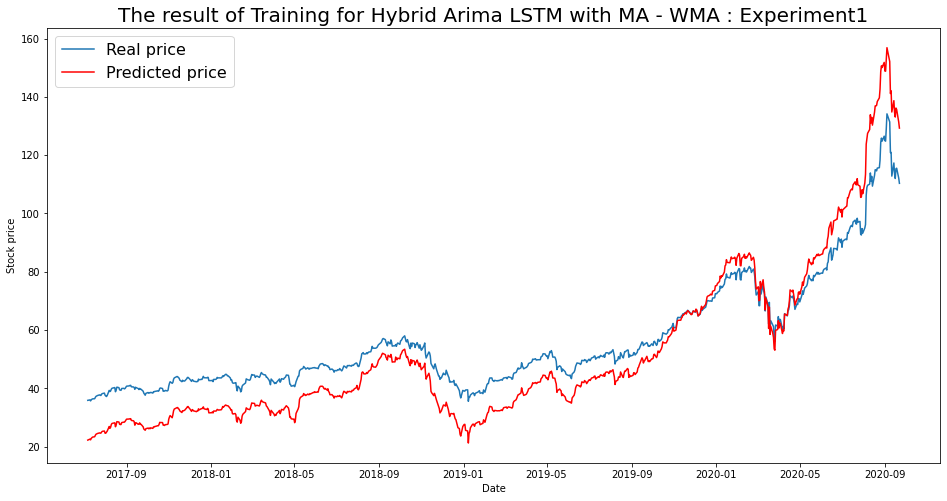

----- Train RMSE for WMA ----- 9.567750607562207
----- Train_MSE_LSTM for WMA ----- 91.54185168850697
----- Train MAE LSTM for WMA ----- 8.483814814644358


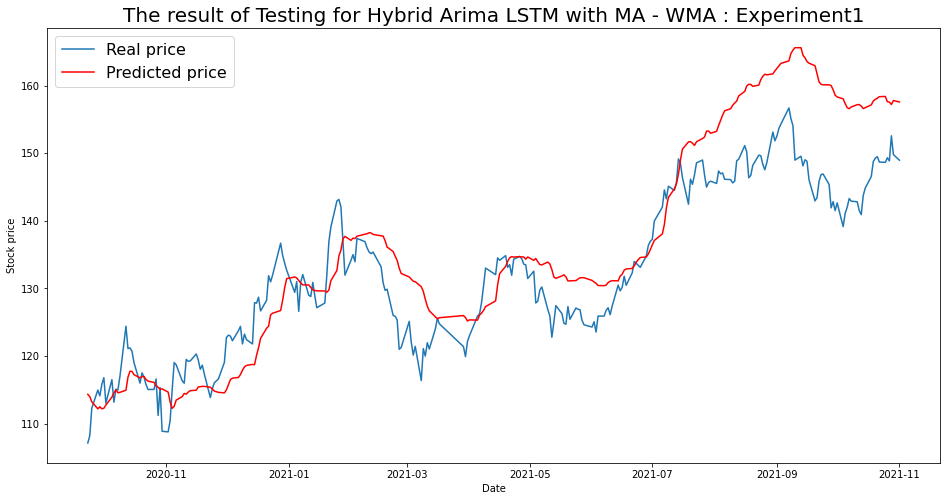

----- Test RMSE for WMA----- 7.5367081346681415
----- Test_MSE_LSTM for WMA----- 56.80196950717294
----- Test_MAE_LSTM for WMA----- 5.956122993340066


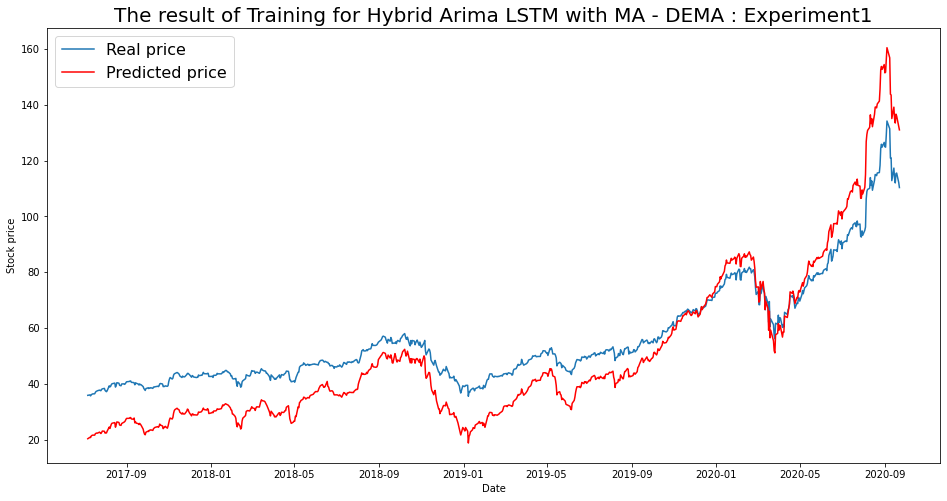

----- Train RMSE for DEMA ----- 11.260564301359528
----- Train_MSE_LSTM for DEMA ----- 126.80030838505259
----- Train MAE LSTM for DEMA ----- 10.029241457055923


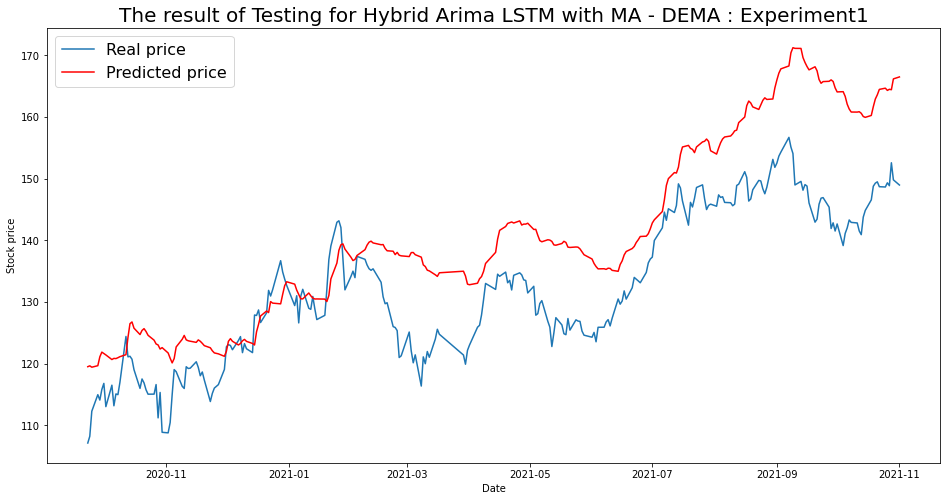

----- Test RMSE for DEMA----- 10.978003624371365
----- Test_MSE_LSTM for DEMA----- 120.51656357671082
----- Test_MAE_LSTM for DEMA----- 9.343426819843298


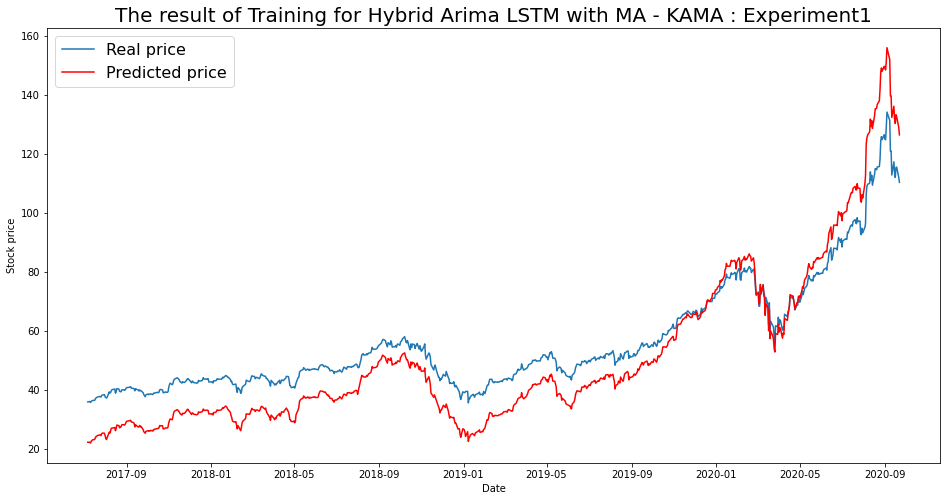

----- Train RMSE for KAMA ----- 9.728924164194906
----- Train_MSE_LSTM for KAMA ----- 94.65196539265554
----- Train MAE LSTM for KAMA ----- 8.726636092269294


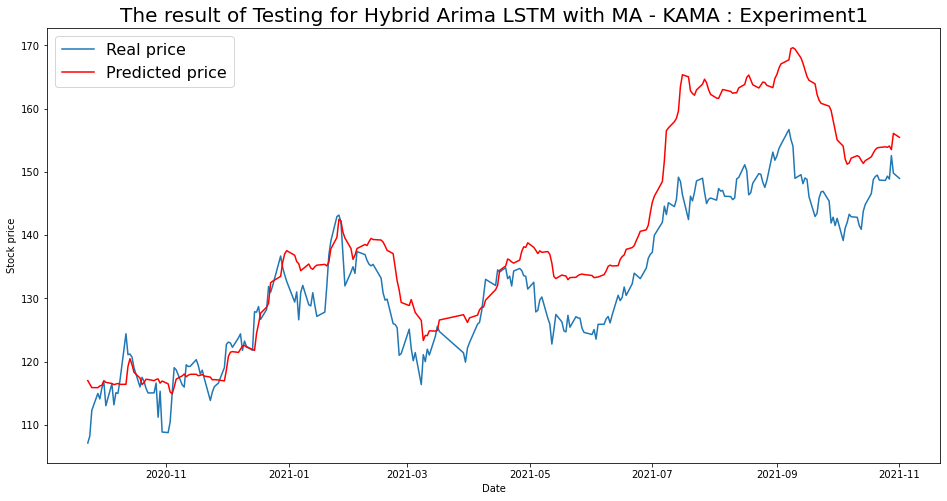

----- Test RMSE for KAMA----- 8.985101959931402
----- Test_MSE_LSTM for KAMA----- 80.73205723036311
----- Test_MAE_LSTM for KAMA----- 7.079003376879244


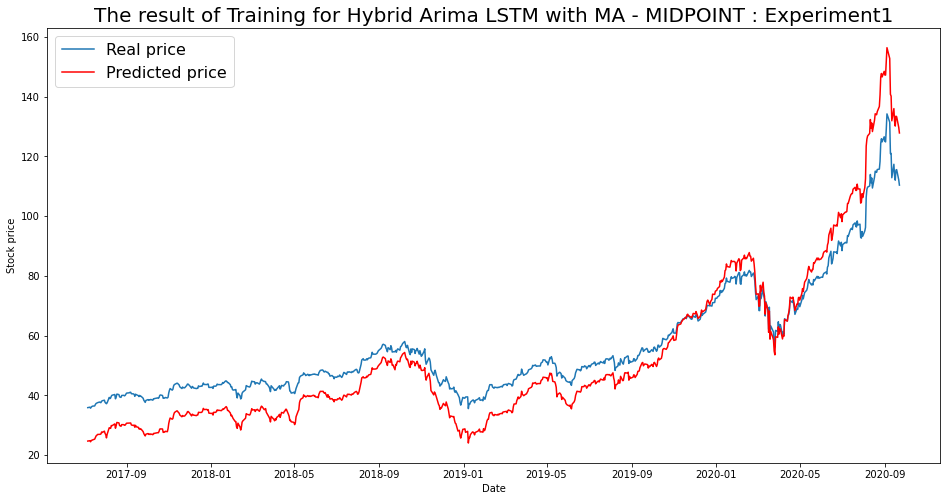

----- Train RMSE for MIDPOINT ----- 8.489283494179926
----- Train_MSE_LSTM for MIDPOINT ----- 72.06793424455573
----- Train MAE LSTM for MIDPOINT ----- 7.510015655912938


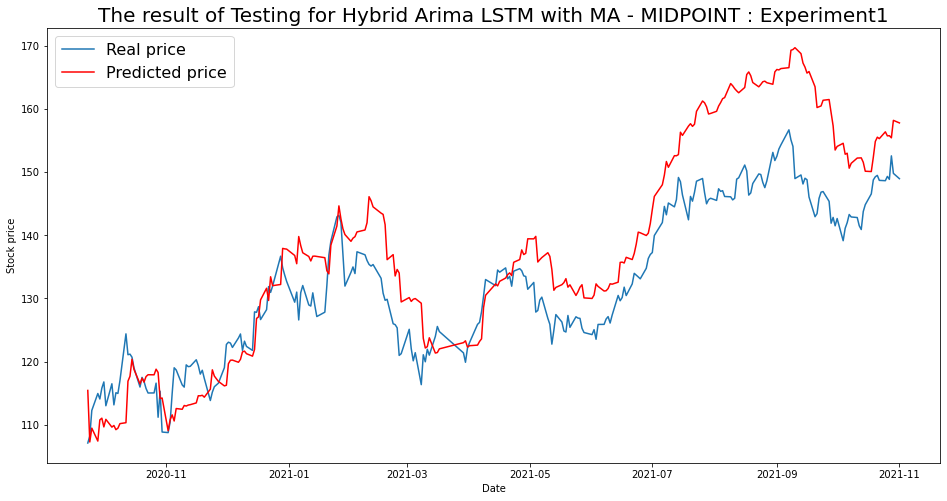

----- Test RMSE for MIDPOINT----- 8.70639453041356
----- Test_MSE_LSTM for MIDPOINT----- 75.80130571921515
----- Test_MAE_LSTM for MIDPOINT----- 7.130945881105426


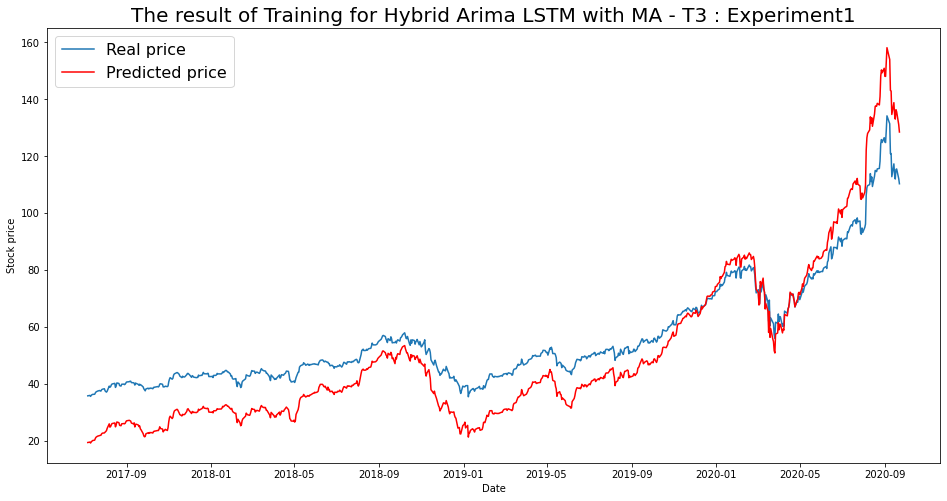

----- Train RMSE for T3 ----- 10.915128509512805
----- Train_MSE_LSTM for T3 ----- 119.14003037917921
----- Train MAE LSTM for T3 ----- 9.760355664290358


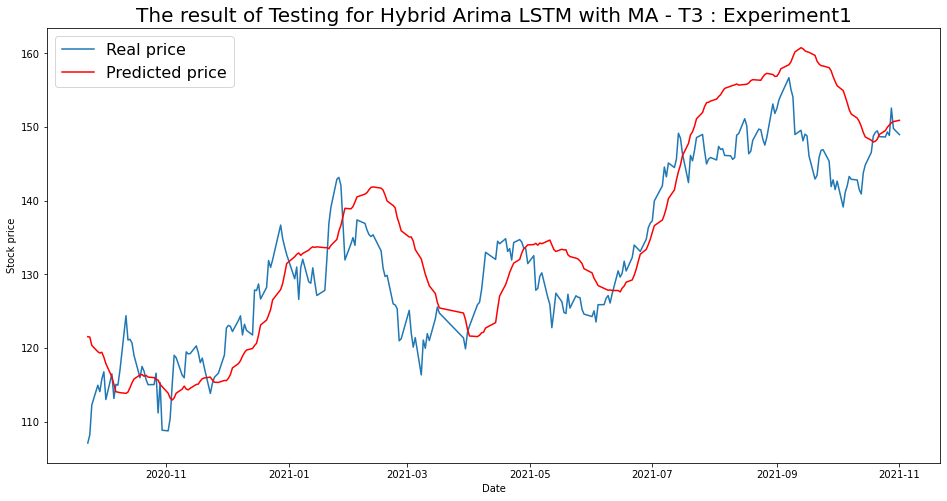

----- Test RMSE for T3----- 6.808926702415001
----- Test_MSE_LSTM for T3----- 46.36148283886003
----- Test_MAE_LSTM for T3----- 5.596706034896943


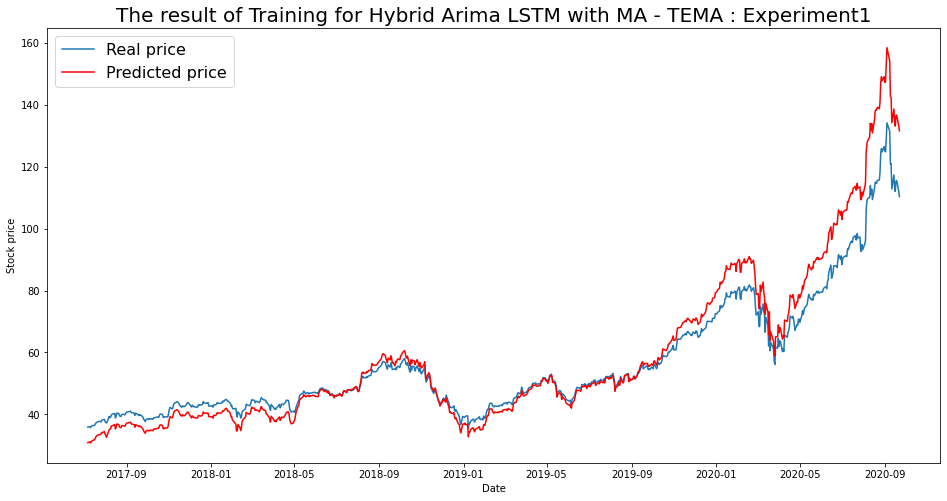

----- Train RMSE for TEMA ----- 6.723556059985799
----- Train_MSE_LSTM for TEMA ----- 45.20620609177176
----- Train MAE LSTM for TEMA ----- 4.40413747354074


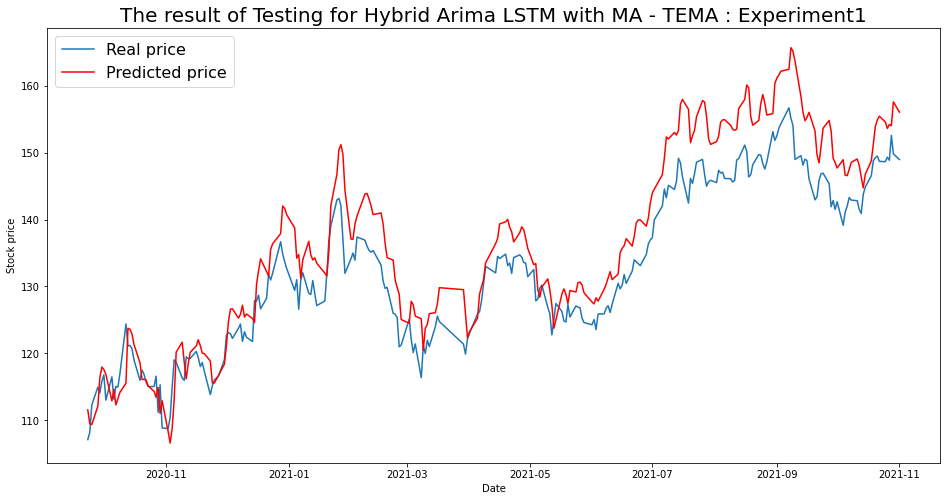

----- Test RMSE for TEMA----- 5.658627776722337
----- Test_MSE_LSTM for TEMA----- 32.02006831549358
----- Test_MAE_LSTM for TEMA----- 4.840005256997922


In [72]:
for i in range(len(list(simulation1.keys()))):
  SIM = list(simulation1.keys())[i]
  plot_train(simulation1,SIM)
  plot_test(simulation1,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 2

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM2.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=10, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()




    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.66 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.07 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.13 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.01 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=1.08 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.26 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 3.637 seconds
                               SARIMAX Results                                
Dep.

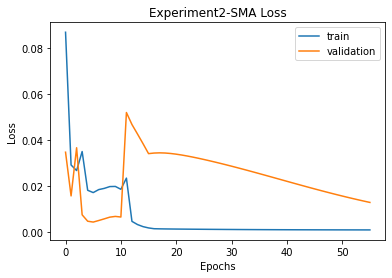


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 136.8787627980392 
RMSE:	 11.699519767838302 
MAPE:	 9.782684450137419
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.13 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.18 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.91 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.

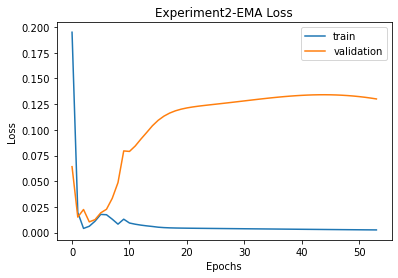


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 136.8787627980392 
RMSE:	 11.699519767838302 
MAPE:	 9.782684450137419

EMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 325.2876788257106 
RMSE:	 18.035733387520192 
MAPE:	 15.58326491461623
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.05 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0

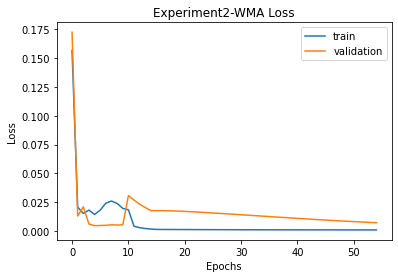


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 136.8787627980392 
RMSE:	 11.699519767838302 
MAPE:	 9.782684450137419

EMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 325.2876788257106 
RMSE:	 18.035733387520192 
MAPE:	 15.58326491461623

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 142.26654445774975 
RMSE:	 11.927554001460221 
MAPE:	 9.787176512242624
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : A

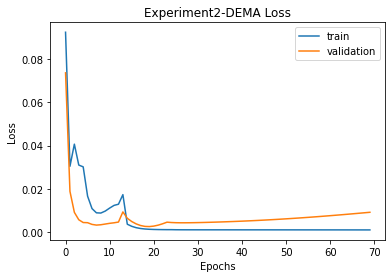


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 136.8787627980392 
RMSE:	 11.699519767838302 
MAPE:	 9.782684450137419

EMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 325.2876788257106 
RMSE:	 18.035733387520192 
MAPE:	 15.58326491461623

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 142.26654445774975 
RMSE:	 11.927554001460221 
MAPE:	 9.787176512242624

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 171.26734938505615 
RMSE:	 13.086915197442679 
MAPE:	 11.821213958102536
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.53 sec
 ARIMA(0

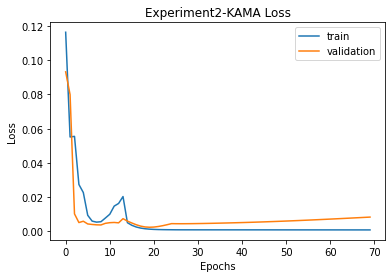


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 136.8787627980392 
RMSE:	 11.699519767838302 
MAPE:	 9.782684450137419

EMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 325.2876788257106 
RMSE:	 18.035733387520192 
MAPE:	 15.58326491461623

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 142.26654445774975 
RMSE:	 11.927554001460221 
MAPE:	 9.787176512242624

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 171.26734938505615 
RMSE:	 13.086915197442679 
MAPE:	 11.821213958102536

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.24625253706662 
RMSE:	 7.228156925321048 
MAPE:	 5.787764162926424
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working 

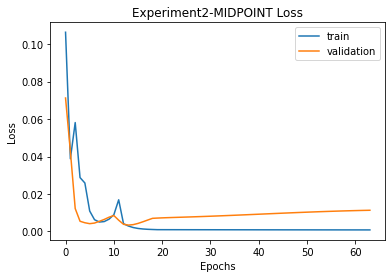


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 136.8787627980392 
RMSE:	 11.699519767838302 
MAPE:	 9.782684450137419

EMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 325.2876788257106 
RMSE:	 18.035733387520192 
MAPE:	 15.58326491461623

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 142.26654445774975 
RMSE:	 11.927554001460221 
MAPE:	 9.787176512242624

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 171.26734938505615 
RMSE:	 13.086915197442679 
MAPE:	 11.821213958102536

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.24625253706662 
RMSE:	 7.228156925321048 
MAPE:	 5.787764162926424

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 51.03620830548878 
RMSE:	 7.143963067197981 
MAPE:	 5.7689786092745114
T3
T3([input_arrays

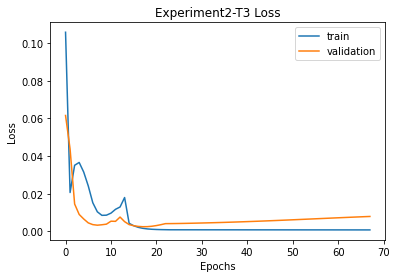


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 136.8787627980392 
RMSE:	 11.699519767838302 
MAPE:	 9.782684450137419

EMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 325.2876788257106 
RMSE:	 18.035733387520192 
MAPE:	 15.58326491461623

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 142.26654445774975 
RMSE:	 11.927554001460221 
MAPE:	 9.787176512242624

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 171.26734938505615 
RMSE:	 13.086915197442679 
MAPE:	 11.821213958102536

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.24625253706662 
RMSE:	 7.228156925321048 
MAPE:	 5.787764162926424

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 51.03620830548878 
RMSE:	 7.143963067197981 
MAPE:	 5.7689786092745114

T3
Prediction vs C

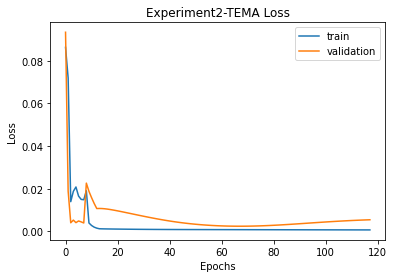


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 136.8787627980392 
RMSE:	 11.699519767838302 
MAPE:	 9.782684450137419

EMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 325.2876788257106 
RMSE:	 18.035733387520192 
MAPE:	 15.58326491461623

WMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.28% Accuracy
MSE:	 142.26654445774975 
RMSE:	 11.927554001460221 
MAPE:	 9.787176512242624

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 171.26734938505615 
RMSE:	 13.086915197442679 
MAPE:	 11.821213958102536

KAMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 52.24625253706662 
RMSE:	 7.228156925321048 
MAPE:	 5.787764162926424

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 51.03620830548878 
RMSE:	 7.143963067197981 
MAPE:	 5.7689786092745114

T3
Prediction vs C

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation2 = {}
    imgfile = 'Experiment2'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation2[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation2_data.json', 'w') as fp:
                  json.dump(simulation2, fp)

              for ma in simulation2.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation2[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation2[ma]['final']['mse'],
                        '\nRMSE:\t', simulation2[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation2[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment2.png to Experiment2 (1).png


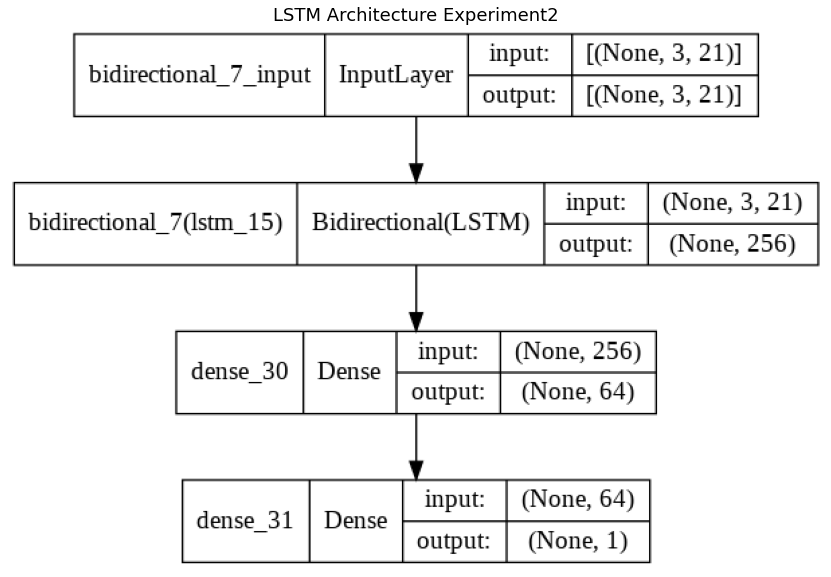

In [ ]:
img = cv2.imread('Experiment2.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [73]:
with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)
fileimg = 'Experiment2'

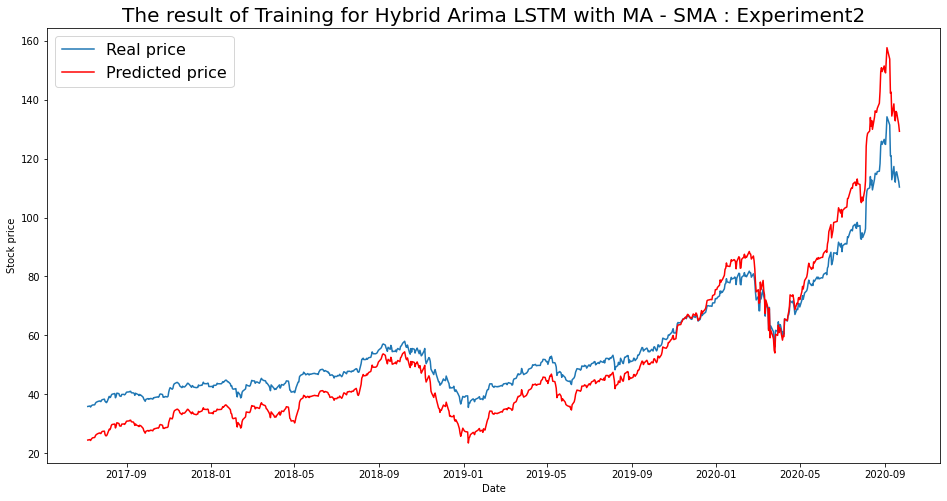

----- Train RMSE for SMA ----- 8.826942967936205
----- Train_MSE_LSTM for SMA ----- 77.91492215919841
----- Train MAE LSTM for SMA ----- 7.736753512883909


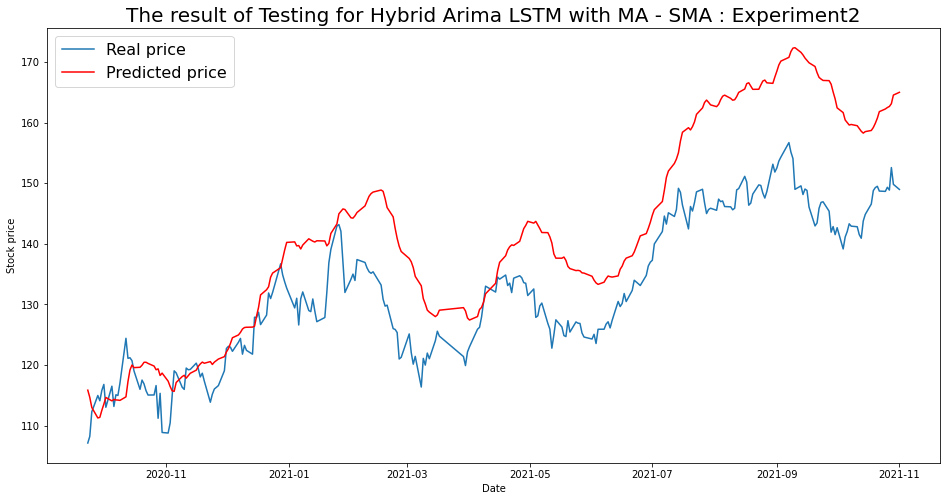

----- Test RMSE for SMA----- 11.699519767838302
----- Test_MSE_LSTM for SMA----- 136.8787627980392
----- Test_MAE_LSTM for SMA----- 9.782684450137419


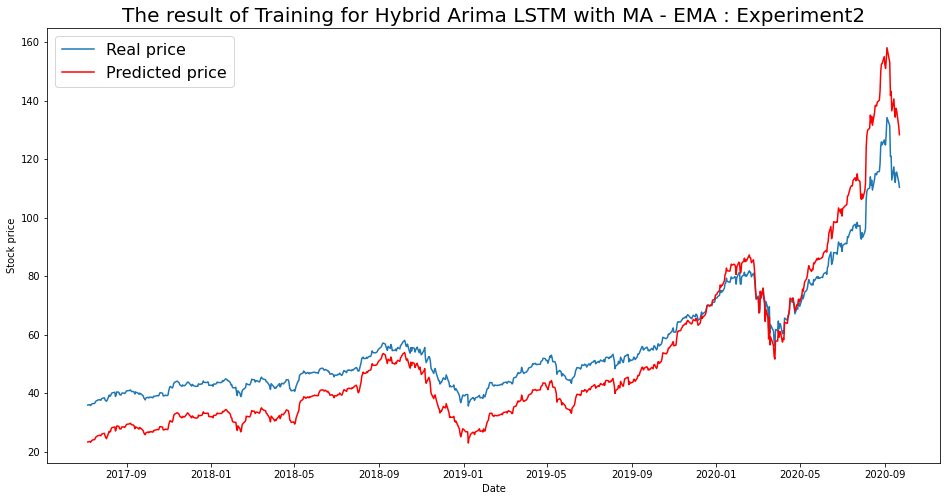

----- Train RMSE for EMA ----- 9.86405135909782
----- Train_MSE_LSTM for EMA ----- 97.29950921491954
----- Train MAE LSTM for EMA ----- 8.73726280728392


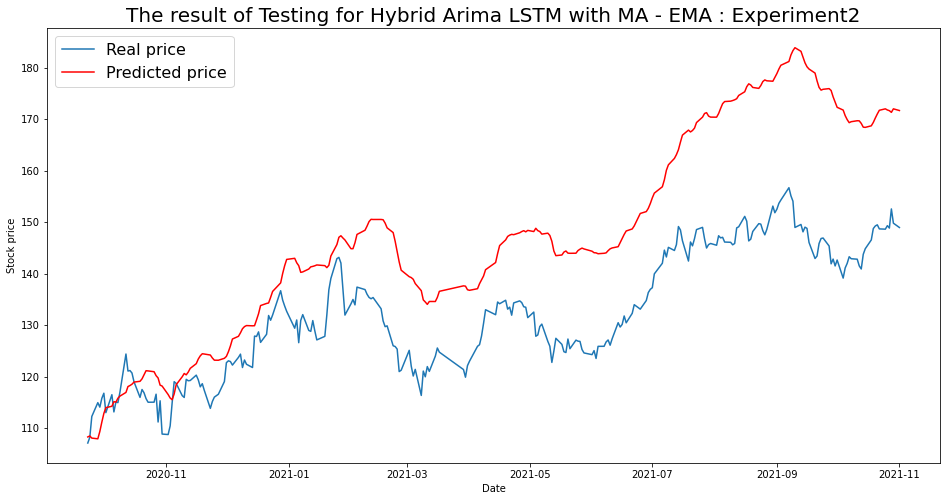

----- Test RMSE for EMA----- 18.035733387520192
----- Test_MSE_LSTM for EMA----- 325.2876788257106
----- Test_MAE_LSTM for EMA----- 15.58326491461623


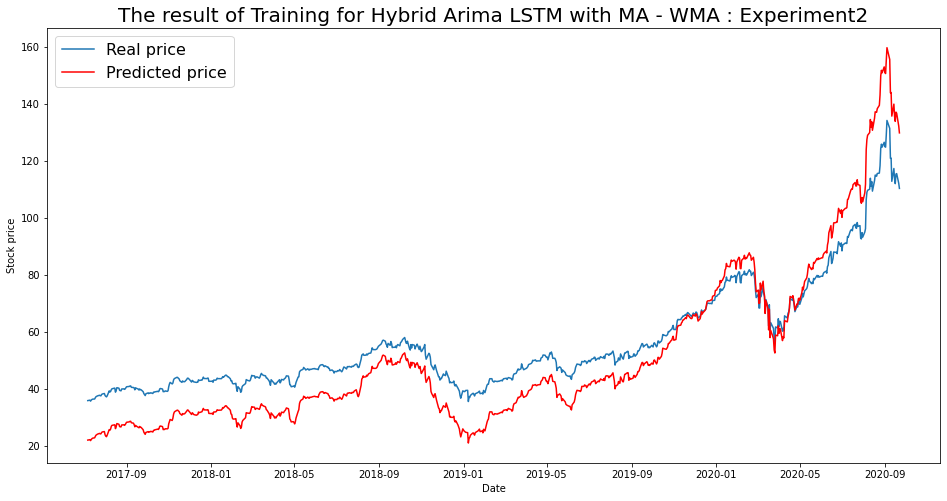

----- Train RMSE for WMA ----- 10.453164264775387
----- Train_MSE_LSTM for WMA ----- 109.26864314637714
----- Train MAE LSTM for WMA ----- 9.361118262029704


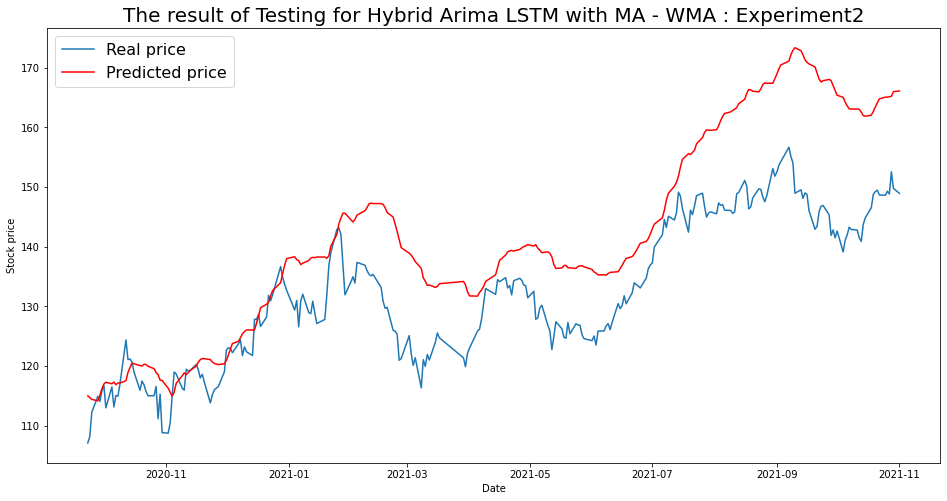

----- Test RMSE for WMA----- 11.927554001460221
----- Test_MSE_LSTM for WMA----- 142.26654445774975
----- Test_MAE_LSTM for WMA----- 9.787176512242624


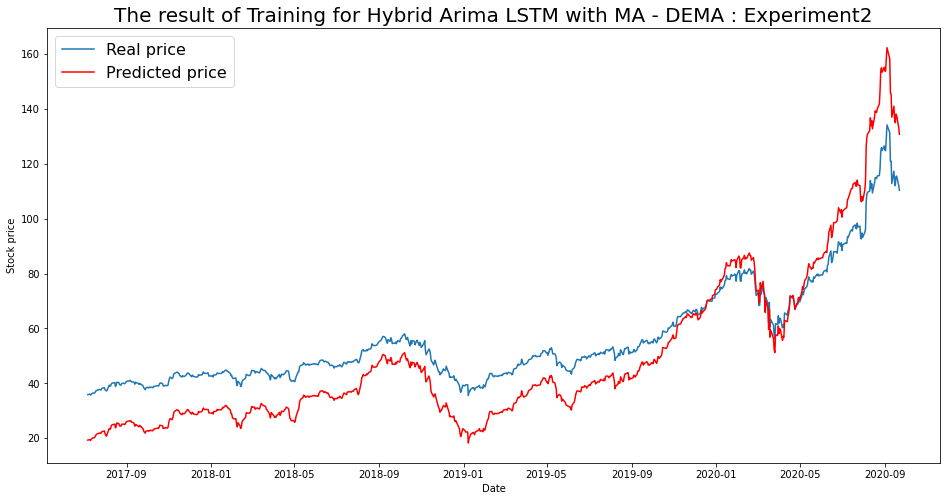

----- Train RMSE for DEMA ----- 12.156210755746763
----- Train_MSE_LSTM for DEMA ----- 147.77345993813327
----- Train MAE LSTM for DEMA ----- 10.956398825846396


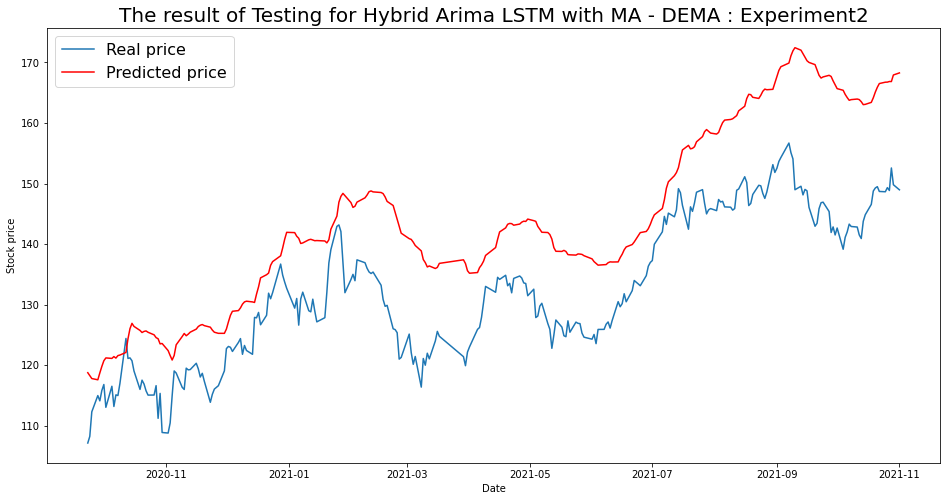

----- Test RMSE for DEMA----- 13.086915197442679
----- Test_MSE_LSTM for DEMA----- 171.26734938505615
----- Test_MAE_LSTM for DEMA----- 11.821213958102536


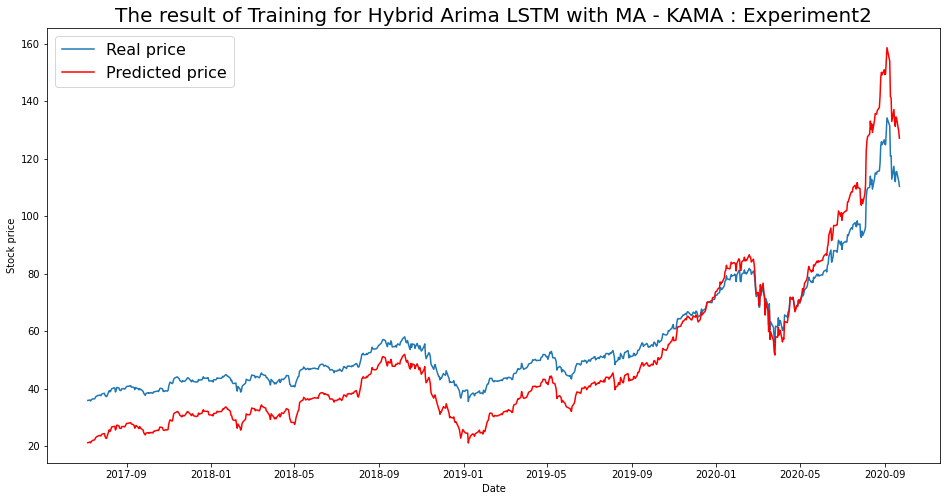

----- Train RMSE for KAMA ----- 10.497854644863434
----- Train_MSE_LSTM for KAMA ----- 110.20495214468077
----- Train MAE LSTM for KAMA ----- 9.473006183673434


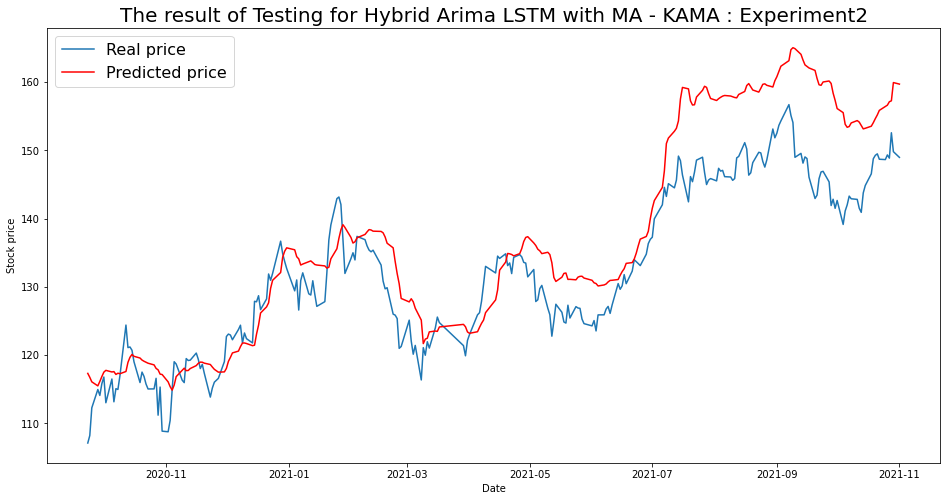

----- Test RMSE for KAMA----- 7.228156925321048
----- Test_MSE_LSTM for KAMA----- 52.24625253706662
----- Test_MAE_LSTM for KAMA----- 5.787764162926424


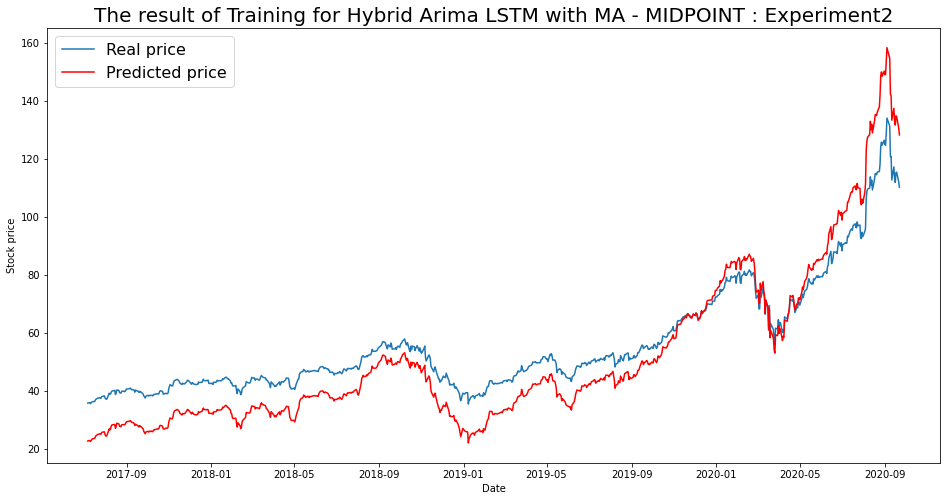

----- Train RMSE for MIDPOINT ----- 9.46823580889301
----- Train_MSE_LSTM for MIDPOINT ----- 89.64748933280386
----- Train MAE LSTM for MIDPOINT ----- 8.431252318872415


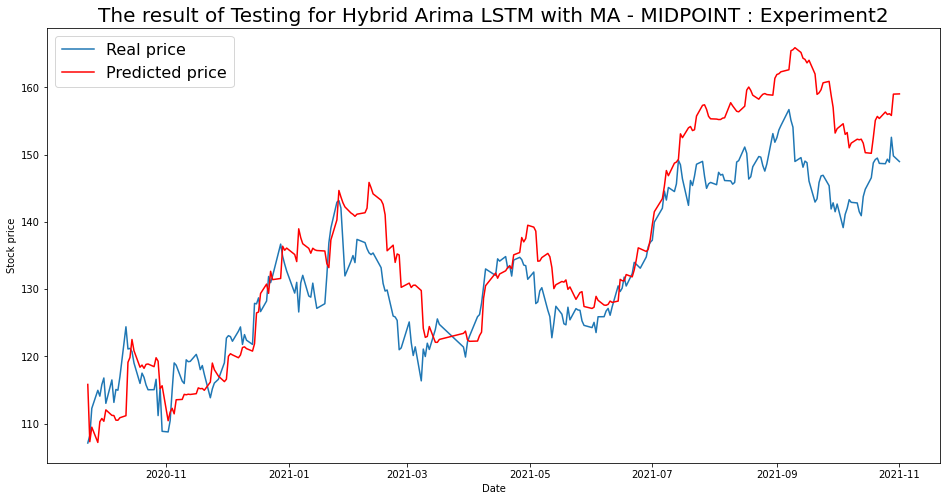

----- Test RMSE for MIDPOINT----- 7.143963067197981
----- Test_MSE_LSTM for MIDPOINT----- 51.03620830548878
----- Test_MAE_LSTM for MIDPOINT----- 5.7689786092745114


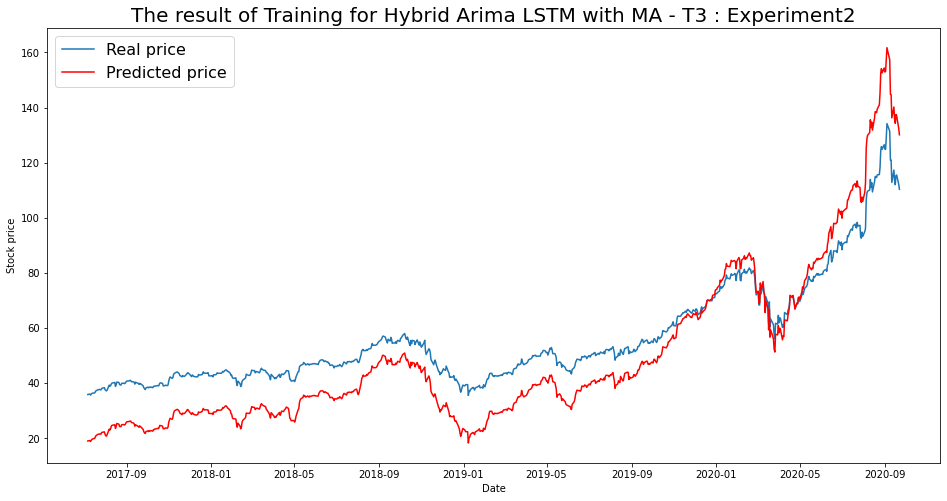

----- Train RMSE for T3 ----- 12.040312964311324
----- Train_MSE_LSTM for T3 ----- 144.96913627856335
----- Train MAE LSTM for T3 ----- 10.855980292569482


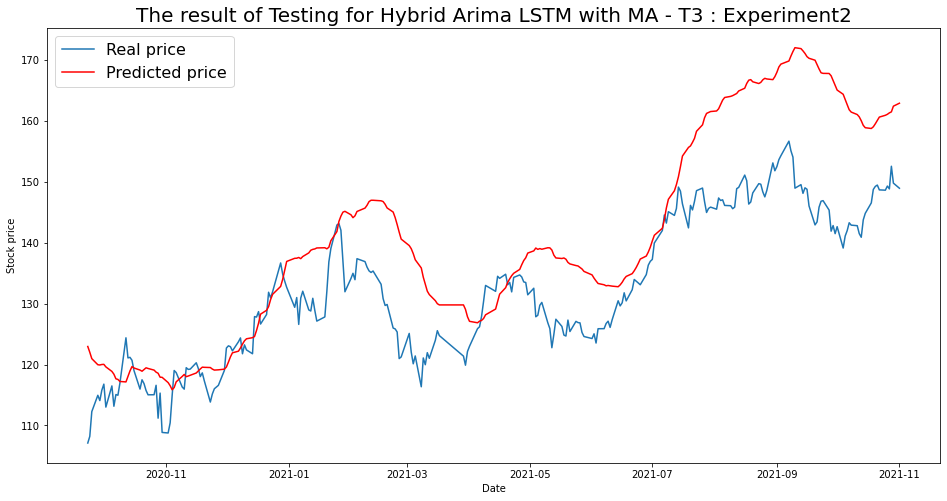

----- Test RMSE for T3----- 11.481590794391028
----- Test_MSE_LSTM for T3----- 131.82692716984482
----- Test_MAE_LSTM for T3----- 9.148826908925223


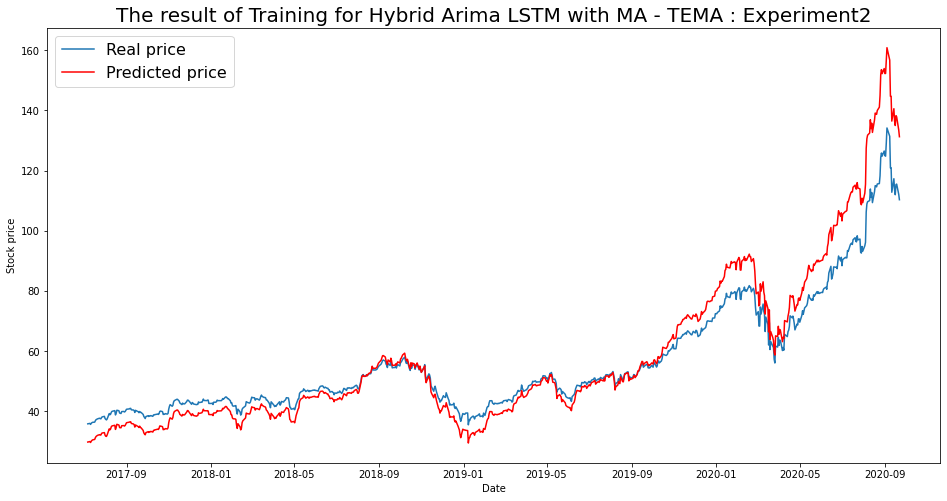

----- Train RMSE for TEMA ----- 7.410384228353796
----- Train_MSE_LSTM for TEMA ----- 54.91379441183469
----- Train MAE LSTM for TEMA ----- 5.102082156767552


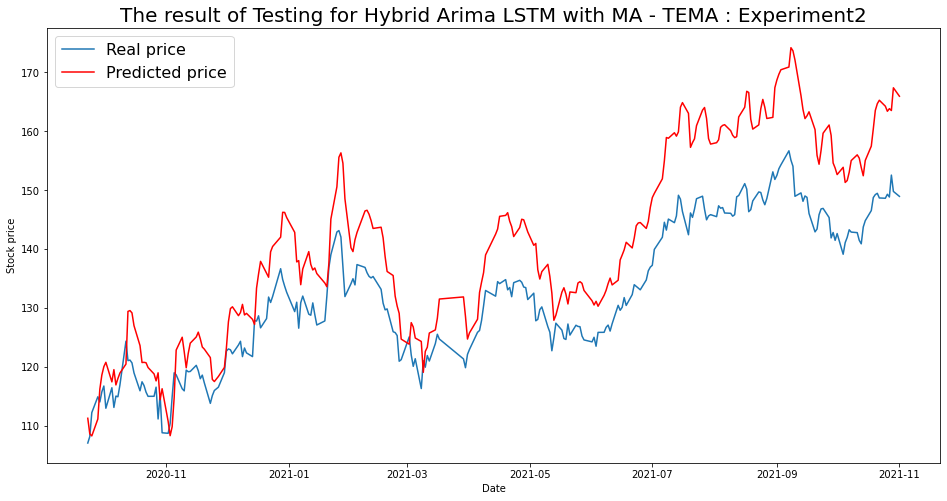

----- Test RMSE for TEMA----- 10.149753049320283
----- Test_MSE_LSTM for TEMA----- 103.01748696218638
----- Test_MAE_LSTM for TEMA----- 9.012271728014667


In [74]:
for i in range(len(list(simulation2.keys()))):
  SIM = list(simulation2.keys())[i]
  plot_train(simulation2,SIM)
  plot_test(simulation2,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 3

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM3.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.68 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.09 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.97 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=1.05 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.27 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 3.581 seconds
                               SARIMAX Results                                
Dep.

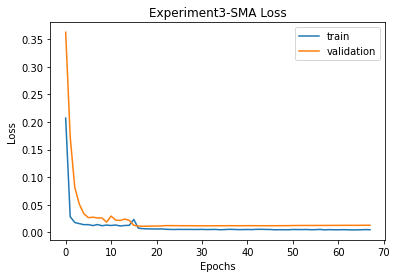


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 60.72793966434877 
RMSE:	 7.792813334370892 
MAPE:	 6.245110563496496
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.59 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.11 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.13 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=1.13 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.87 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.2

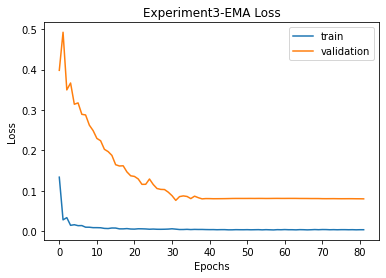


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 60.72793966434877 
RMSE:	 7.792813334370892 
MAPE:	 6.245110563496496

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 24.31424046870049 
RMSE:	 4.930947218202654 
MAPE:	 4.072073008160127
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.59 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.10 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.12 sec
 ARIMA(3,3,1)(0,0,0)[0] 

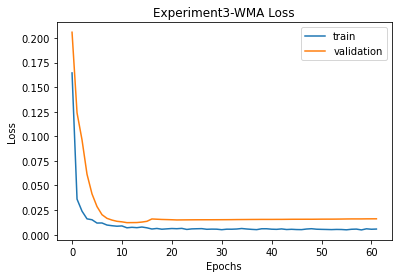


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 60.72793966434877 
RMSE:	 7.792813334370892 
MAPE:	 6.245110563496496

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 24.31424046870049 
RMSE:	 4.930947218202654 
MAPE:	 4.072073008160127

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 68.15170187847146 
RMSE:	 8.255404404296101 
MAPE:	 6.806281257852447
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.04 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.06 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=i

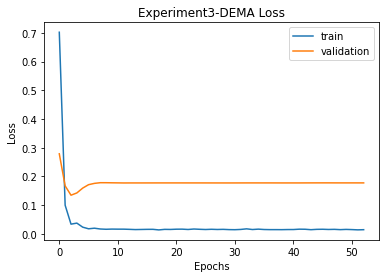


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 60.72793966434877 
RMSE:	 7.792813334370892 
MAPE:	 6.245110563496496

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 24.31424046870049 
RMSE:	 4.930947218202654 
MAPE:	 4.072073008160127

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 68.15170187847146 
RMSE:	 8.255404404296101 
MAPE:	 6.806281257852447

DEMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.922177447330554 
RMSE:	 6.627380888958364 
MAPE:	 5.414540694927783
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.49 sec
 ARIMA(0,3,0)(

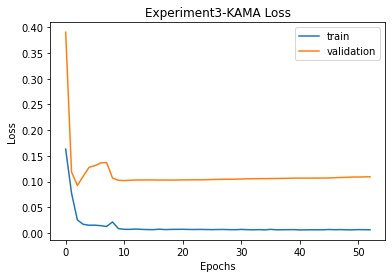


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 60.72793966434877 
RMSE:	 7.792813334370892 
MAPE:	 6.245110563496496

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 24.31424046870049 
RMSE:	 4.930947218202654 
MAPE:	 4.072073008160127

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 68.15170187847146 
RMSE:	 8.255404404296101 
MAPE:	 6.806281257852447

DEMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.922177447330554 
RMSE:	 6.627380888958364 
MAPE:	 5.414540694927783

KAMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 23.99643218488633 
RMSE:	 4.8986153334270215 
MAPE:	 3.8674202618000764
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on M

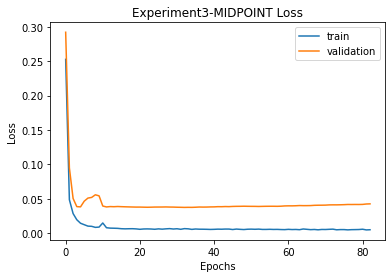


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 60.72793966434877 
RMSE:	 7.792813334370892 
MAPE:	 6.245110563496496

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 24.31424046870049 
RMSE:	 4.930947218202654 
MAPE:	 4.072073008160127

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 68.15170187847146 
RMSE:	 8.255404404296101 
MAPE:	 6.806281257852447

DEMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.922177447330554 
RMSE:	 6.627380888958364 
MAPE:	 5.414540694927783

KAMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 23.99643218488633 
RMSE:	 4.8986153334270215 
MAPE:	 3.8674202618000764

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 28.7191654730941 
RMSE:	 5.359026541555295 
MAPE:	 4.42030651732032
T3
T3([input_arrays], [tim

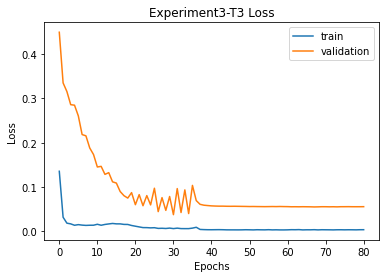


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 60.72793966434877 
RMSE:	 7.792813334370892 
MAPE:	 6.245110563496496

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 24.31424046870049 
RMSE:	 4.930947218202654 
MAPE:	 4.072073008160127

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 68.15170187847146 
RMSE:	 8.255404404296101 
MAPE:	 6.806281257852447

DEMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.922177447330554 
RMSE:	 6.627380888958364 
MAPE:	 5.414540694927783

KAMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 23.99643218488633 
RMSE:	 4.8986153334270215 
MAPE:	 3.8674202618000764

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 28.7191654730941 
RMSE:	 5.359026541555295 
MAPE:	 4.42030651732032

T3
Prediction vs Close:		

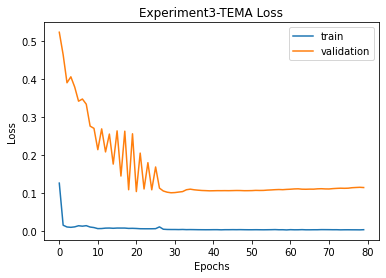


SMA
Prediction vs Close:		52.61% Accuracy
Prediction vs Prediction:	50.75% Accuracy
MSE:	 60.72793966434877 
RMSE:	 7.792813334370892 
MAPE:	 6.245110563496496

EMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 24.31424046870049 
RMSE:	 4.930947218202654 
MAPE:	 4.072073008160127

WMA
Prediction vs Close:		53.36% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 68.15170187847146 
RMSE:	 8.255404404296101 
MAPE:	 6.806281257852447

DEMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.922177447330554 
RMSE:	 6.627380888958364 
MAPE:	 5.414540694927783

KAMA
Prediction vs Close:		56.34% Accuracy
Prediction vs Prediction:	49.25% Accuracy
MSE:	 23.99643218488633 
RMSE:	 4.8986153334270215 
MAPE:	 3.8674202618000764

MIDPOINT
Prediction vs Close:		50.37% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 28.7191654730941 
RMSE:	 5.359026541555295 
MAPE:	 4.42030651732032

T3
Prediction vs Close:		

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation3 = {}
    imgfile = 'Experiment3'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation3[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation3_data.json', 'w') as fp:
                  json.dump(simulation3, fp)

              for ma in simulation3.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation3[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation3[ma]['final']['mse'],
                        '\nRMSE:\t', simulation3[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation3[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment3.png to Experiment3 (1).png


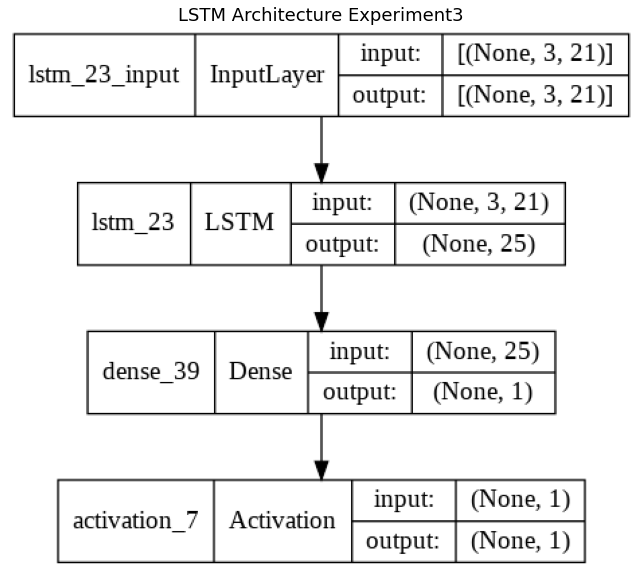

In [ ]:
img = cv2.imread('Experiment3.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [75]:
with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)
fileimg = 'Experiment3'

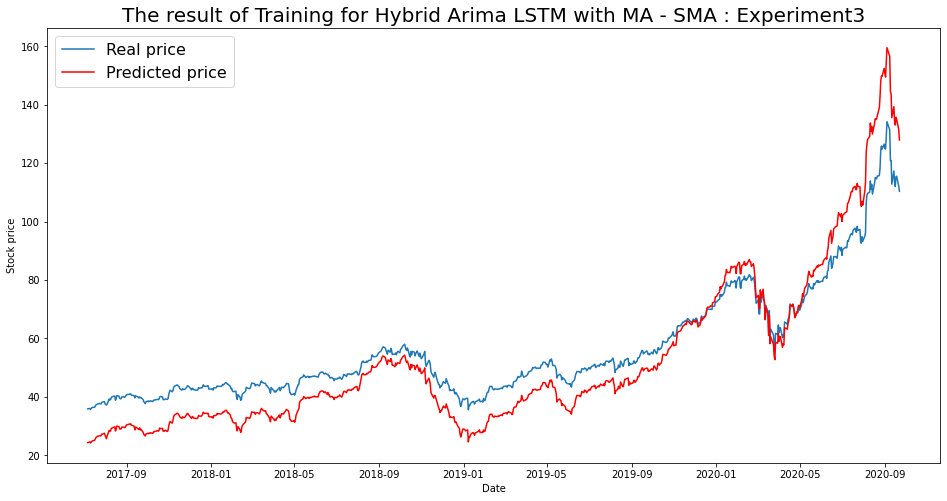

----- Train RMSE for SMA ----- 8.952567216610497
----- Train_MSE_LSTM for SMA ----- 80.14845976792903
----- Train MAE LSTM for SMA ----- 7.821491223024573


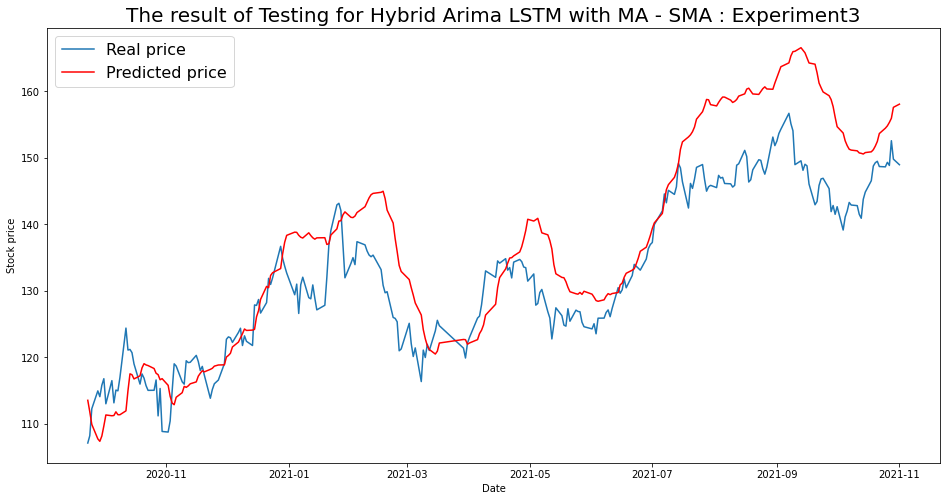

----- Test RMSE for SMA----- 7.792813334370892
----- Test_MSE_LSTM for SMA----- 60.72793966434877
----- Test_MAE_LSTM for SMA----- 6.245110563496496


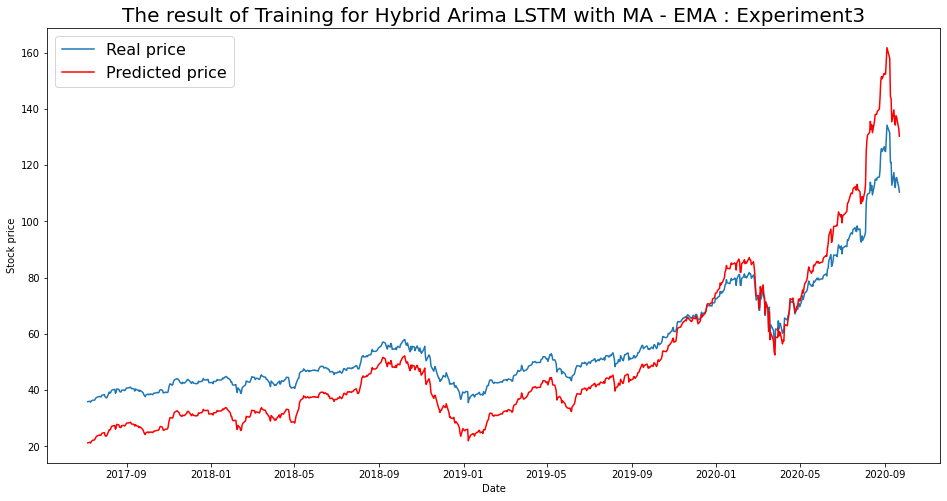

----- Train RMSE for EMA ----- 10.570254973011156
----- Train_MSE_LSTM for EMA ----- 111.73029019446709
----- Train MAE LSTM for EMA ----- 9.451268005811858


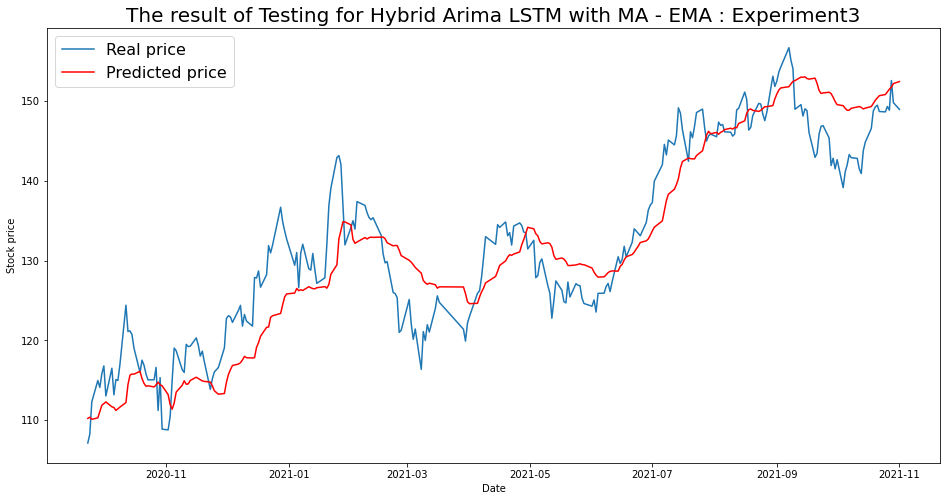

----- Test RMSE for EMA----- 4.930947218202654
----- Test_MSE_LSTM for EMA----- 24.31424046870049
----- Test_MAE_LSTM for EMA----- 4.072073008160127


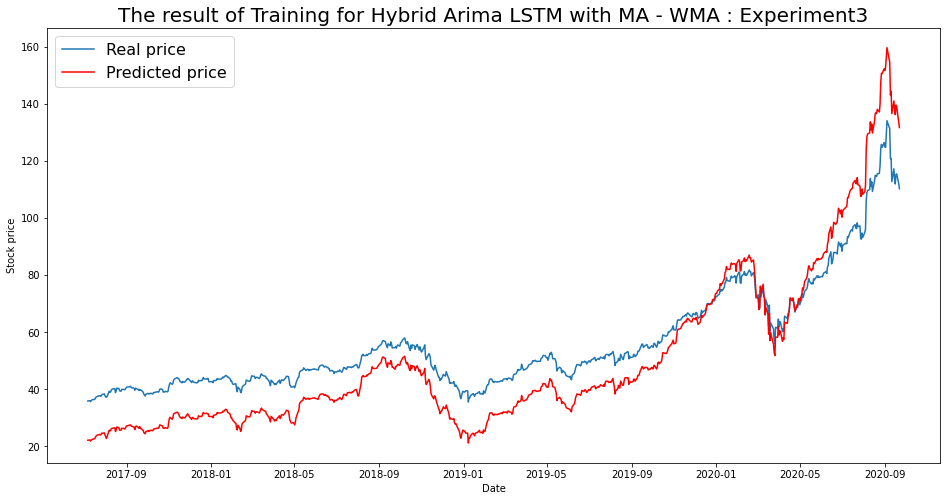

----- Train RMSE for WMA ----- 10.97436711794096
----- Train_MSE_LSTM for WMA ----- 120.43673363934376
----- Train MAE LSTM for WMA ----- 9.925815236695067


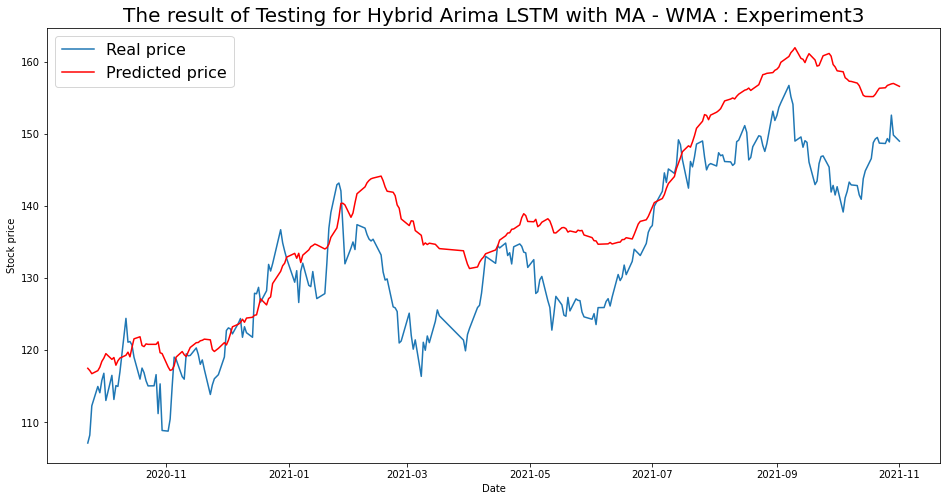

----- Test RMSE for WMA----- 8.255404404296101
----- Test_MSE_LSTM for WMA----- 68.15170187847146
----- Test_MAE_LSTM for WMA----- 6.806281257852447


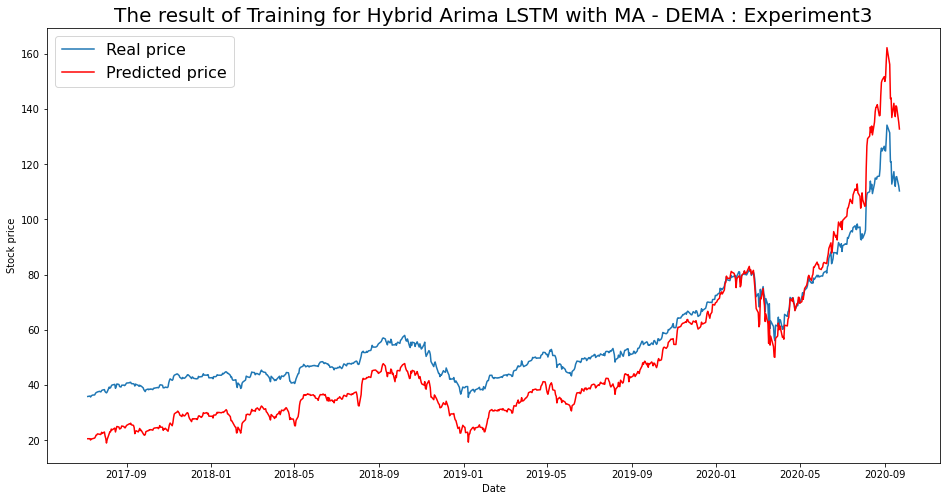

----- Train RMSE for DEMA ----- 12.066299877592092
----- Train_MSE_LSTM for DEMA ----- 145.59559273597895
----- Train MAE LSTM for DEMA ----- 10.907355915123395


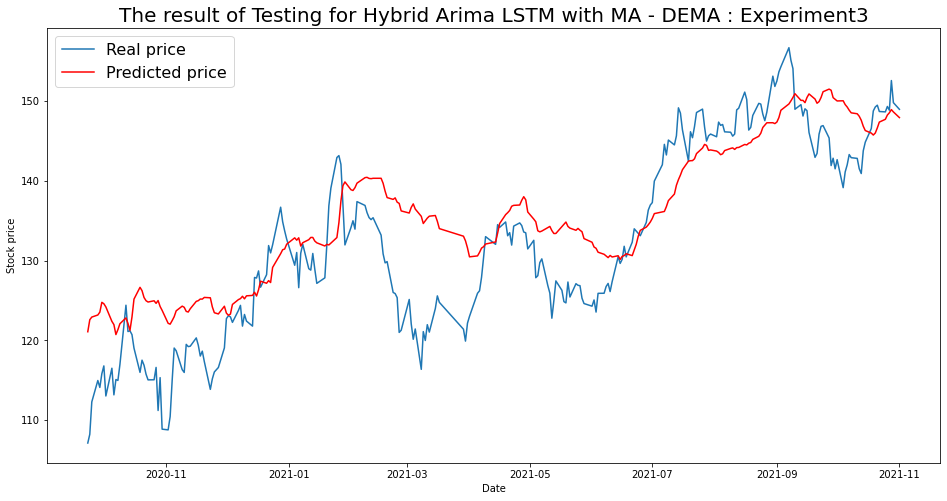

----- Test RMSE for DEMA----- 6.627380888958364
----- Test_MSE_LSTM for DEMA----- 43.922177447330554
----- Test_MAE_LSTM for DEMA----- 5.414540694927783


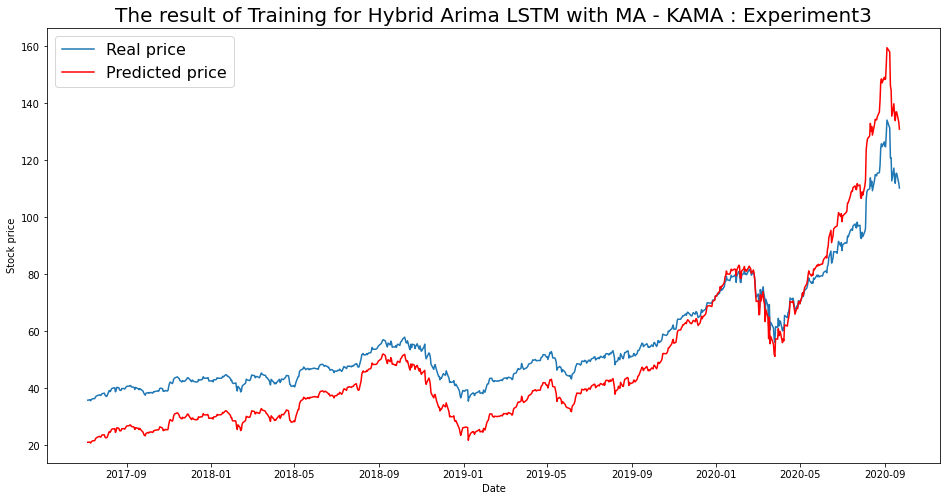

----- Train RMSE for KAMA ----- 10.869146791217638
----- Train_MSE_LSTM for KAMA ----- 118.13835196903668
----- Train MAE LSTM for KAMA ----- 9.759291692937742


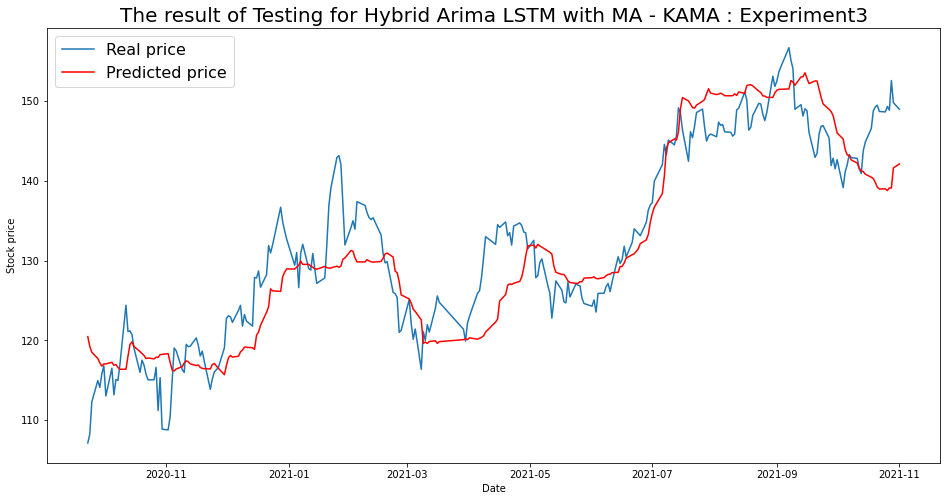

----- Test RMSE for KAMA----- 4.8986153334270215
----- Test_MSE_LSTM for KAMA----- 23.99643218488633
----- Test_MAE_LSTM for KAMA----- 3.8674202618000764


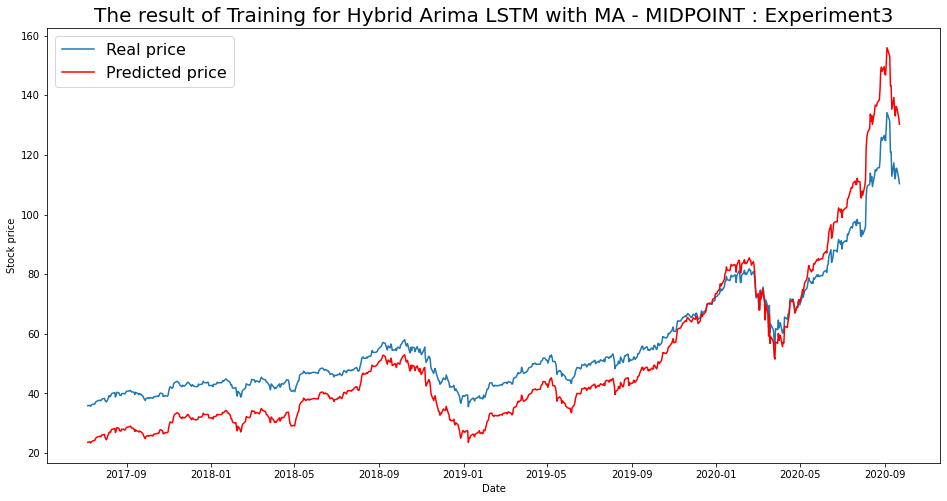

----- Train RMSE for MIDPOINT ----- 9.691011765630286
----- Train_MSE_LSTM for MIDPOINT ----- 93.91570904158462
----- Train MAE LSTM for MIDPOINT ----- 8.650189046672622


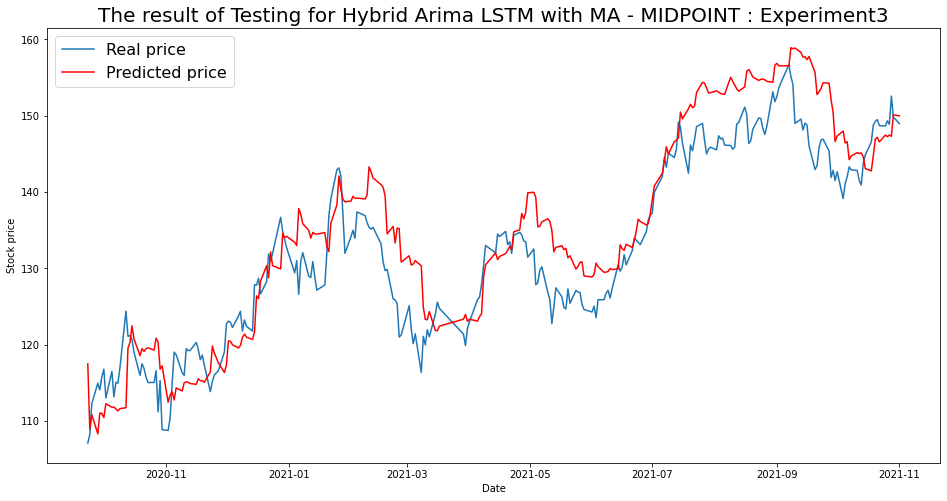

----- Test RMSE for MIDPOINT----- 5.359026541555295
----- Test_MSE_LSTM for MIDPOINT----- 28.7191654730941
----- Test_MAE_LSTM for MIDPOINT----- 4.42030651732032


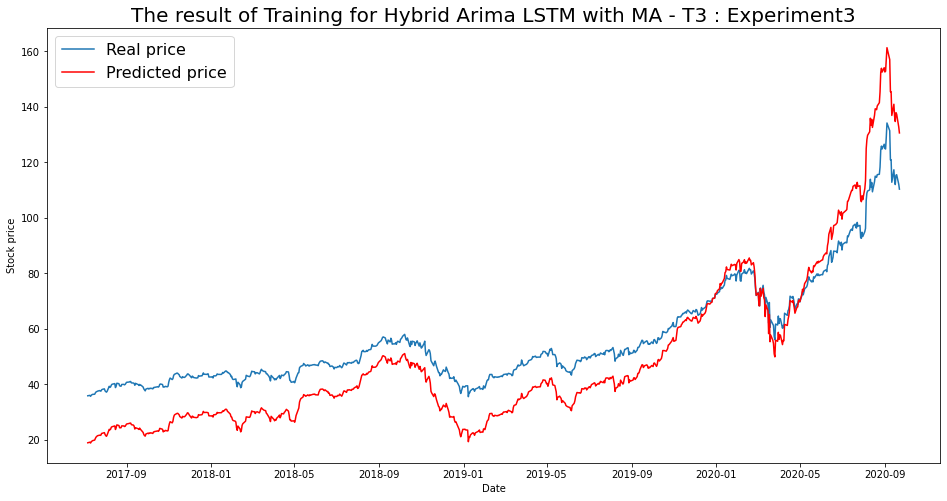

----- Train RMSE for T3 ----- 12.129650565307267
----- Train_MSE_LSTM for T3 ----- 147.12842283645892
----- Train MAE LSTM for T3 ----- 10.936634904781638


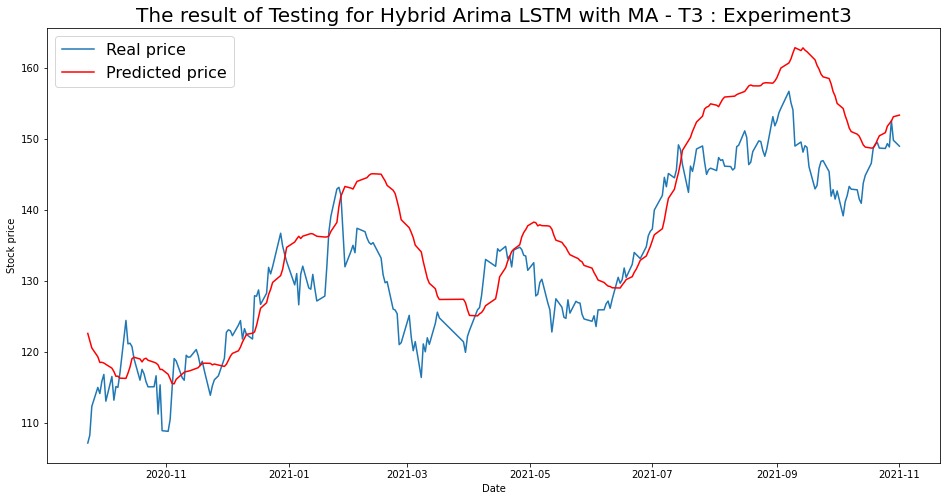

----- Test RMSE for T3----- 7.553602318843705
----- Test_MSE_LSTM for T3----- 57.05690799124099
----- Test_MAE_LSTM for T3----- 6.064989593585796


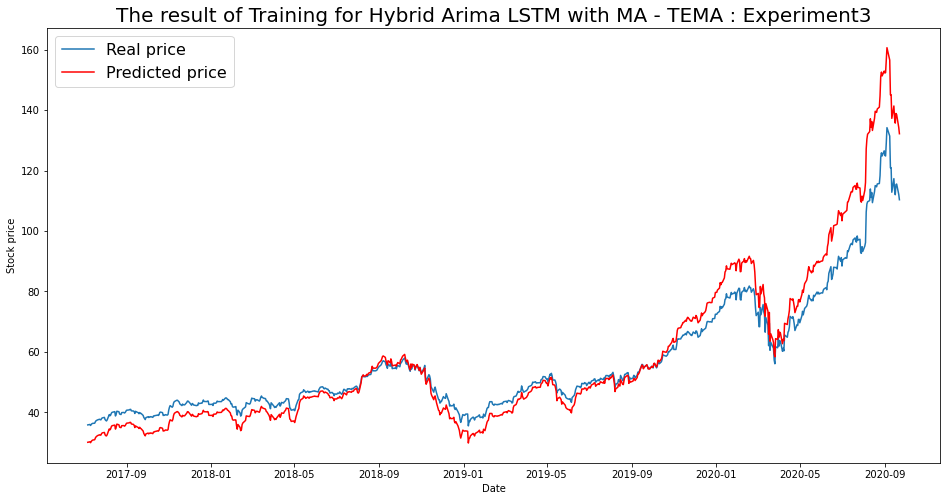

----- Train RMSE for TEMA ----- 7.376932734913034
----- Train_MSE_LSTM for TEMA ----- 54.419136575431494
----- Train MAE LSTM for TEMA ----- 5.050424731629302


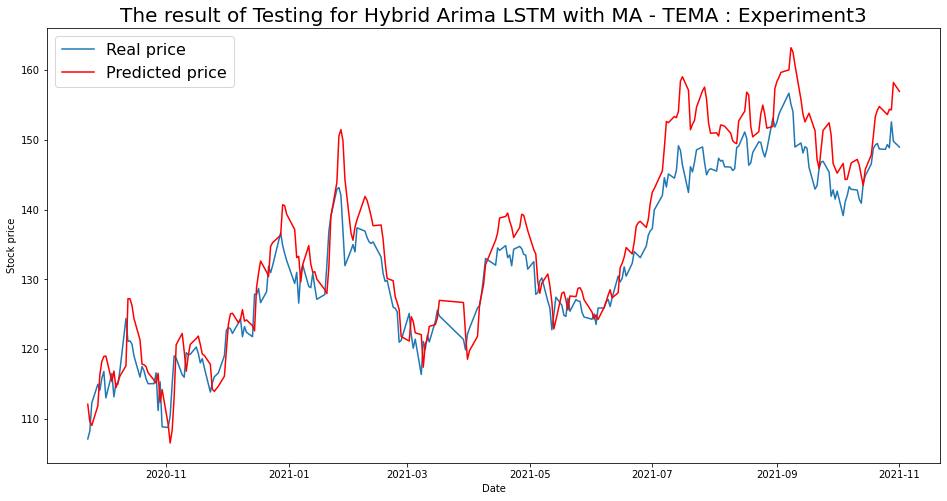

----- Test RMSE for TEMA----- 4.578721256009806
----- Test_MSE_LSTM for TEMA----- 20.964688340236016
----- Test_MAE_LSTM for TEMA----- 3.7212897315589664


In [76]:
for i in range(len(list(simulation3.keys()))):
  SIM = list(simulation3.keys())[i]
  plot_train(simulation3,SIM)
  plot_test(simulation3,SIM)

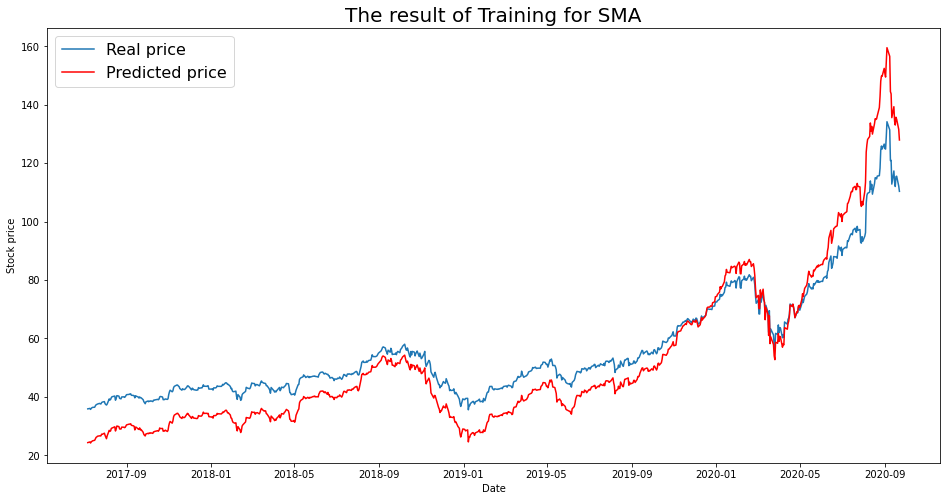

----- Train RMSE for SMA ----- 8.952567216610497
----- Train_MSE_LSTM for SMA ----- 80.14845976792903
----- Train MAE LSTM for SMA ----- 7.821491223024573


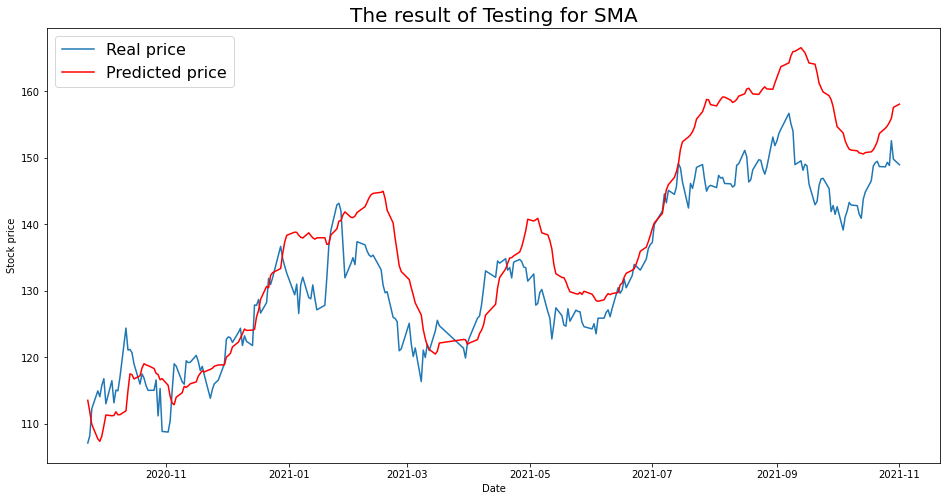

----- Test RMSE for SMA----- 7.792813334370892
----- Test_MSE_LSTM for SMA----- 60.72793966434877
----- Test_MAE_LSTM for SMA----- 6.245110563496496


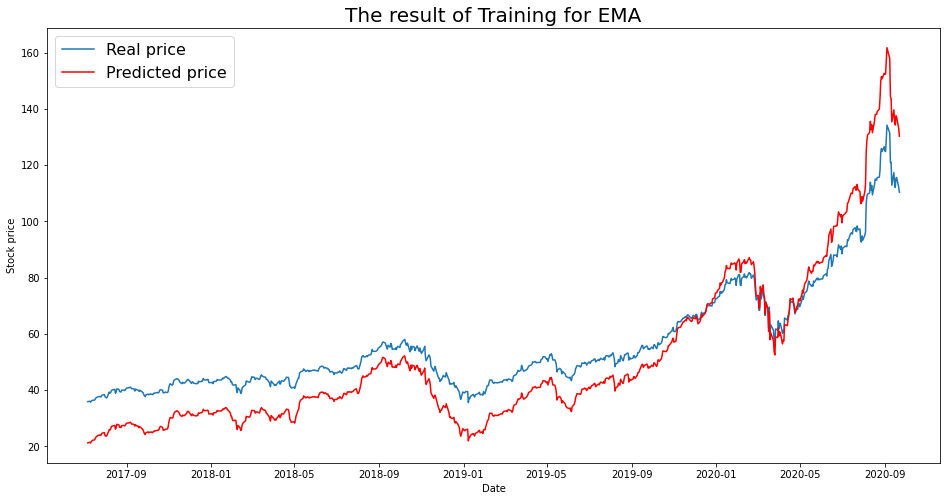

----- Train RMSE for EMA ----- 10.570254973011156
----- Train_MSE_LSTM for EMA ----- 111.73029019446709
----- Train MAE LSTM for EMA ----- 9.451268005811858


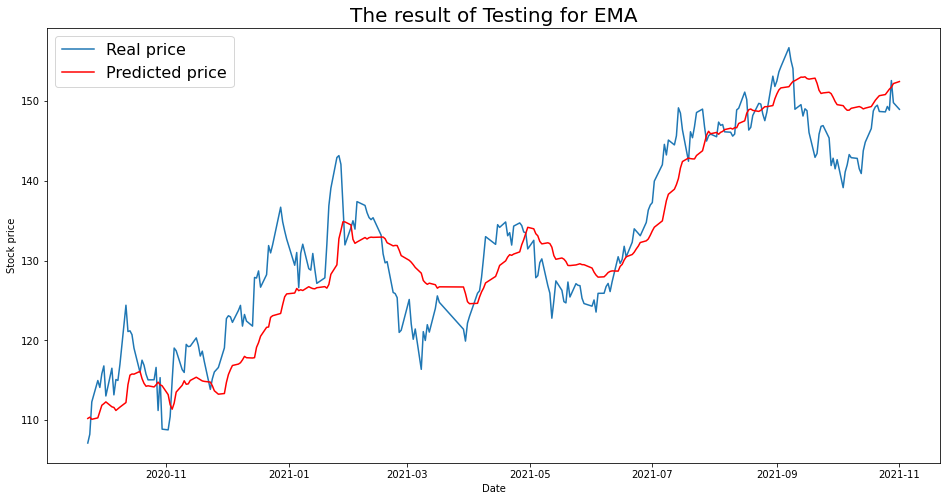

----- Test RMSE for EMA----- 4.930947218202654
----- Test_MSE_LSTM for EMA----- 24.31424046870049
----- Test_MAE_LSTM for EMA----- 4.072073008160127


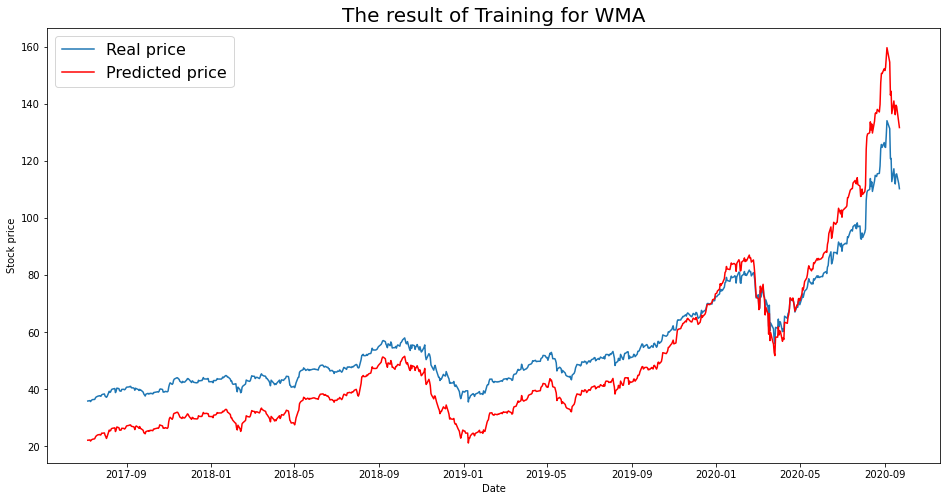

----- Train RMSE for WMA ----- 10.97436711794096
----- Train_MSE_LSTM for WMA ----- 120.43673363934376
----- Train MAE LSTM for WMA ----- 9.925815236695067


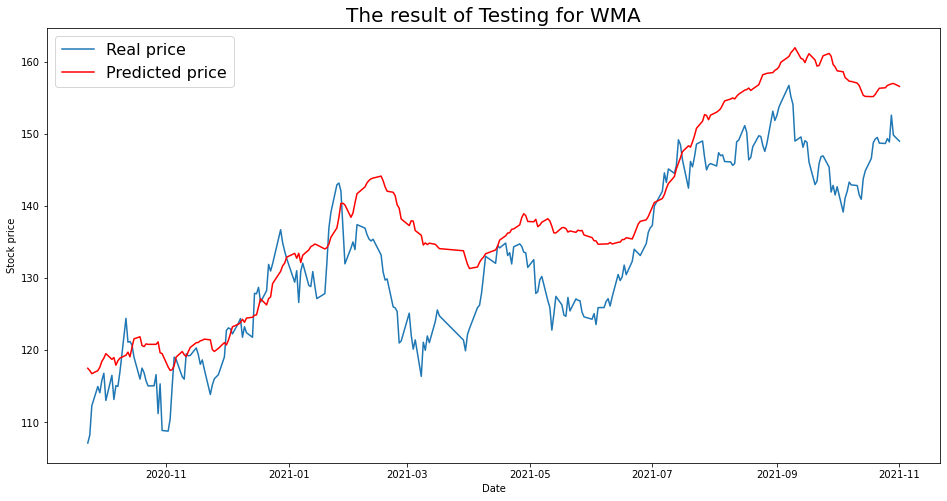

----- Test RMSE for WMA----- 8.255404404296101
----- Test_MSE_LSTM for WMA----- 68.15170187847146
----- Test_MAE_LSTM for WMA----- 6.806281257852447


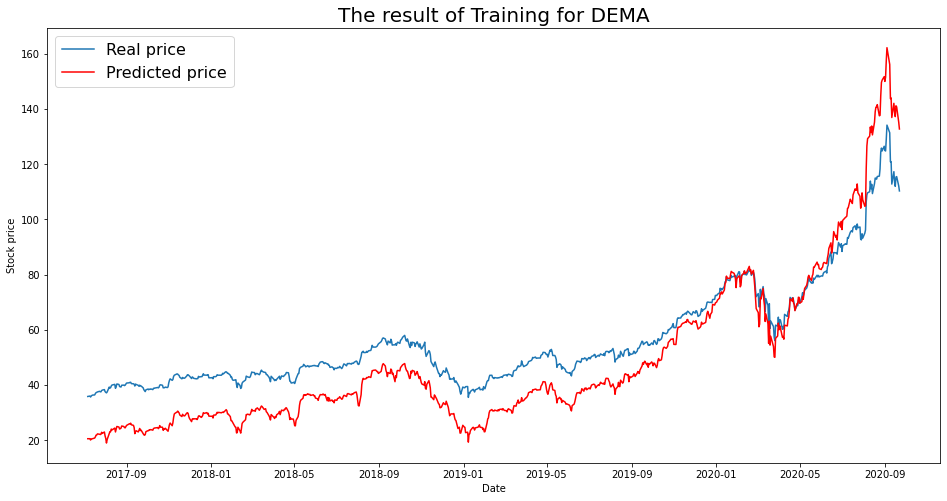

----- Train RMSE for DEMA ----- 12.066299877592092
----- Train_MSE_LSTM for DEMA ----- 145.59559273597895
----- Train MAE LSTM for DEMA ----- 10.907355915123395


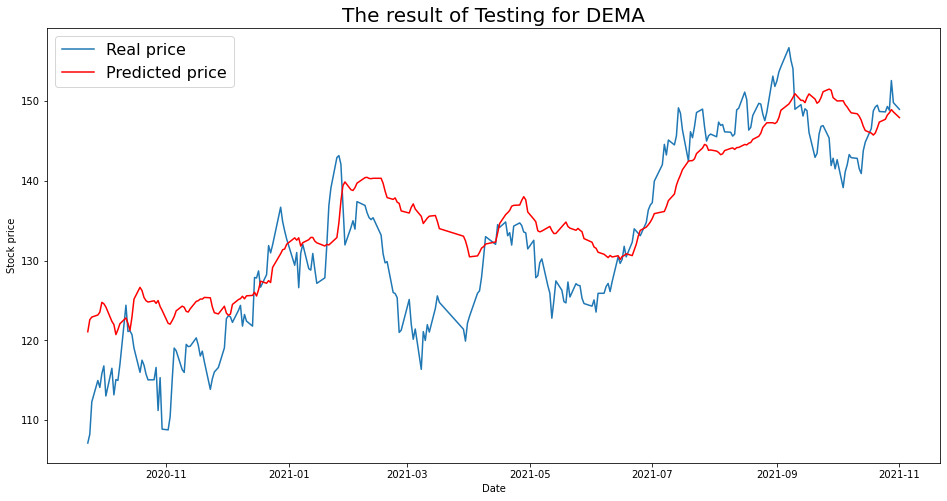

----- Test RMSE for DEMA----- 6.627380888958364
----- Test_MSE_LSTM for DEMA----- 43.922177447330554
----- Test_MAE_LSTM for DEMA----- 5.414540694927783


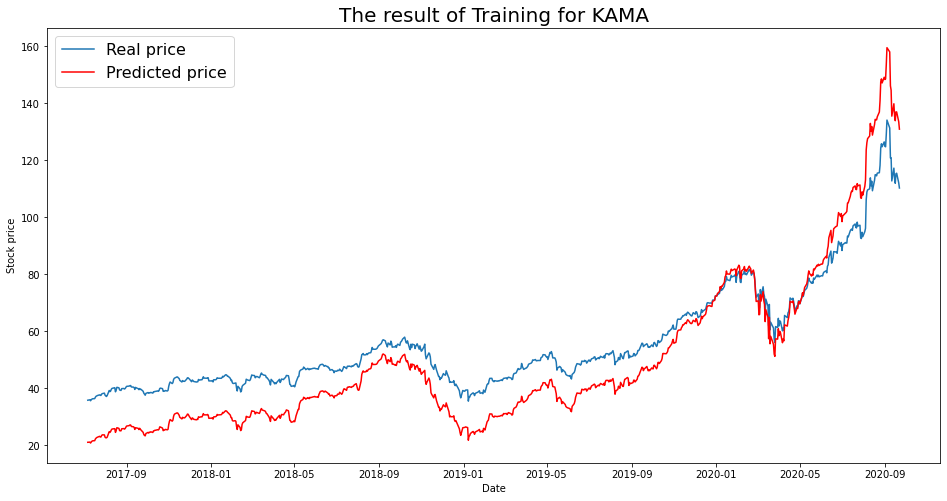

----- Train RMSE for KAMA ----- 10.869146791217638
----- Train_MSE_LSTM for KAMA ----- 118.13835196903668
----- Train MAE LSTM for KAMA ----- 9.759291692937742


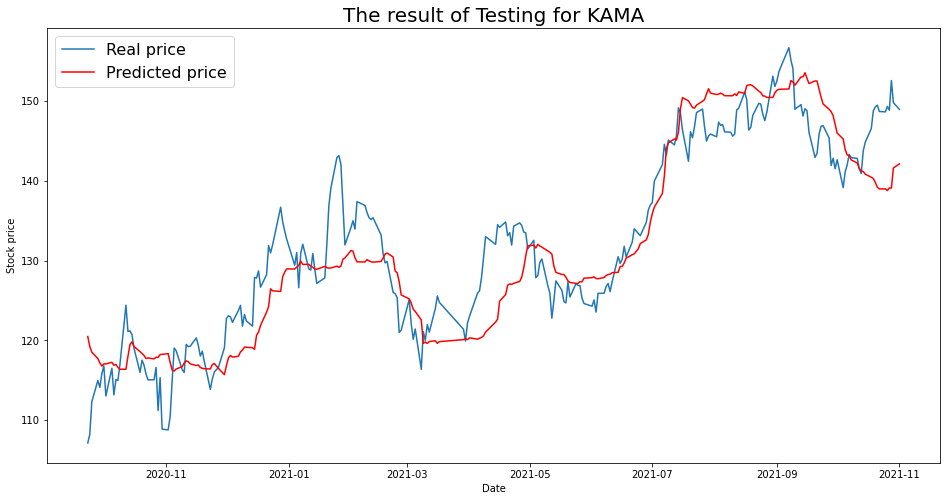

----- Test RMSE for KAMA----- 4.8986153334270215
----- Test_MSE_LSTM for KAMA----- 23.99643218488633
----- Test_MAE_LSTM for KAMA----- 3.8674202618000764


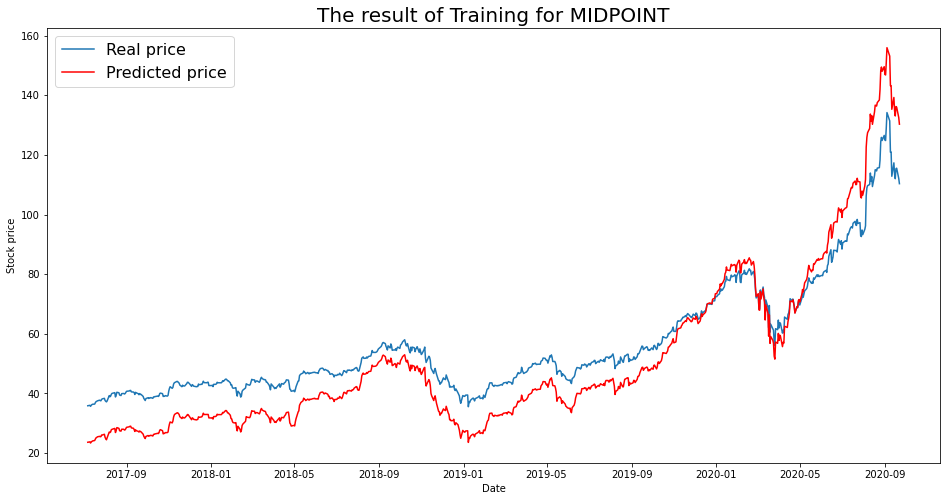

----- Train RMSE for MIDPOINT ----- 9.691011765630286
----- Train_MSE_LSTM for MIDPOINT ----- 93.91570904158462
----- Train MAE LSTM for MIDPOINT ----- 8.650189046672622


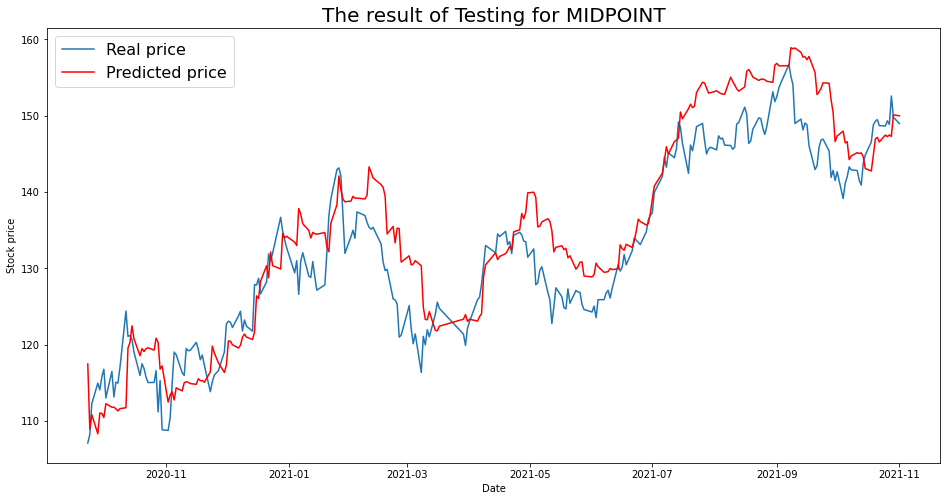

----- Test RMSE for MIDPOINT----- 5.359026541555295
----- Test_MSE_LSTM for MIDPOINT----- 28.7191654730941
----- Test_MAE_LSTM for MIDPOINT----- 4.42030651732032


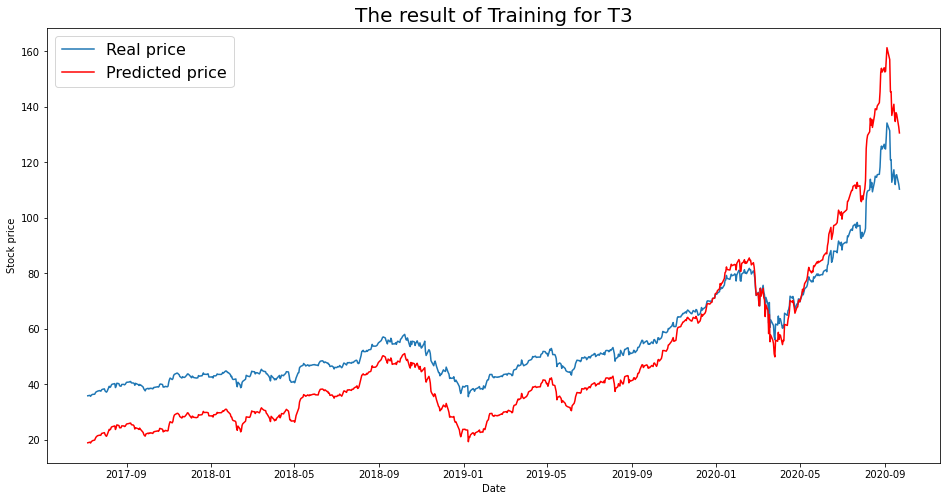

----- Train RMSE for T3 ----- 12.129650565307267
----- Train_MSE_LSTM for T3 ----- 147.12842283645892
----- Train MAE LSTM for T3 ----- 10.936634904781638


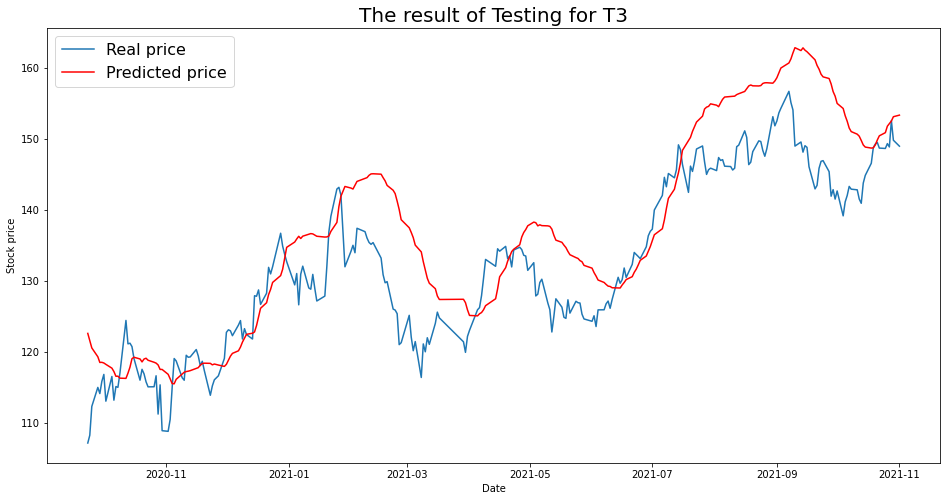

----- Test RMSE for T3----- 7.553602318843705
----- Test_MSE_LSTM for T3----- 57.05690799124099
----- Test_MAE_LSTM for T3----- 6.064989593585796


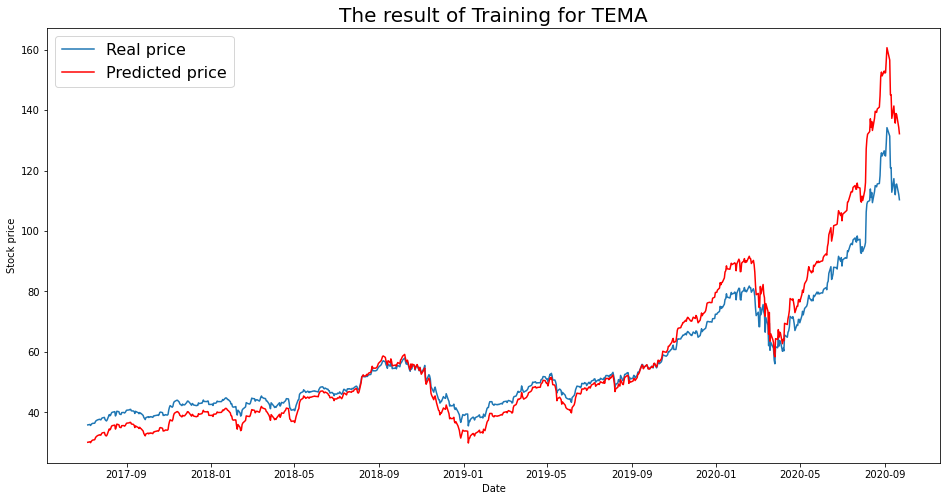

----- Train RMSE for TEMA ----- 7.376932734913034
----- Train_MSE_LSTM for TEMA ----- 54.419136575431494
----- Train MAE LSTM for TEMA ----- 5.050424731629302


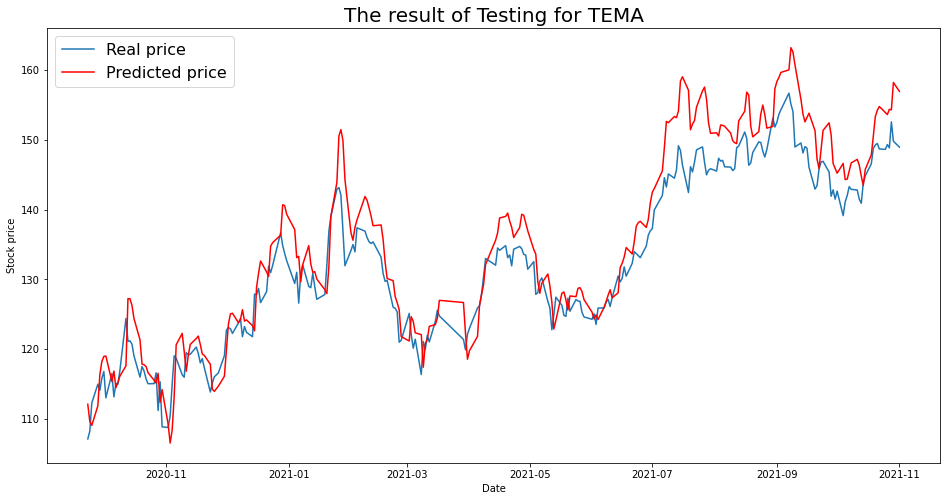

----- Test RMSE for TEMA----- 4.578721256009806
----- Test_MSE_LSTM for TEMA----- 20.964688340236016
----- Test_MAE_LSTM for TEMA----- 3.7212897315589664


In [ ]:
for i in range(len(list(simulation3.keys()))):
  SIM = list(simulation3.keys())[i]
  plot_train(simulation3,SIM)
  plot_test(simulation3,SIM)

## Univariate Arima Multistep MutiVariate LSTM Hybrid Model Experiment 4

From  the above experiments it is evident that with Higher moving averages the loss plots show unreoresented data and underfitting, hence keeping only the MA's that have smaller periods like T3 OR TRIMA. Going forward EMA, WMA & DEMA will be ignored.

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # # Option 1
    # # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()




    # # Option 3
    # # define custom activation
    # # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM4.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = (y_scaler.inverse_transform(predictiontr)-det).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte =( y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4157.020, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3687.148, Time=0.02 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3458.651, Time=0.04 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3322.133, Time=0.06 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3324.133, Time=0.12 sec

Best model:  ARIMA(3,3,0)(0,0,0)[0]          
Total fit time: 1.570 seconds
                               SARIMAX Results                                
Dep.

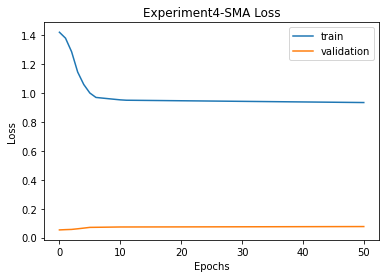


SMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 23.31830336349202 
RMSE:	 4.828902915103183 
MAPE:	 3.806885992834059
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4231.556, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3761.238, Time=0.02 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.15 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3532.227, Time=0.04 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3394.496, Time=0.09 sec
 ARIMA(3,3,1)(0,0,0)[0]             : AIC=inf, Time=0.81 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(3,3,0)(0,0,0)[0] intercept   : AIC=3396.496, Time=0.2

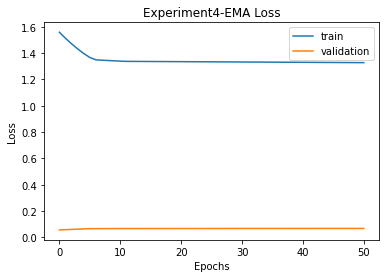


SMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 23.31830336349202 
RMSE:	 4.828902915103183 
MAPE:	 3.806885992834059

EMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 31.4391560756623 
RMSE:	 5.607063052584865 
MAPE:	 4.398444723456604
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4264.089, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3793.930, Time=0.02 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=3564.923, Time=0.06 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=3427.258, Time=0.08 sec
 ARIMA(3,3,1)(0,0,0)[0]  

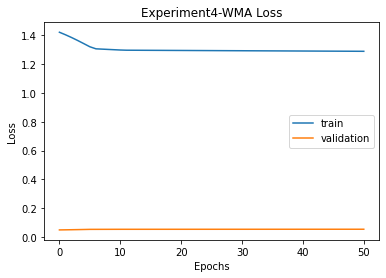


SMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 23.31830336349202 
RMSE:	 4.828902915103183 
MAPE:	 3.806885992834059

EMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 31.4391560756623 
RMSE:	 5.607063052584865 
MAPE:	 4.398444723456604

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 48.85272948439791 
RMSE:	 6.989472761546318 
MAPE:	 5.616901258925532
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=4436.126, Time=0.02 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=3965.317, Time=0.02 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=in

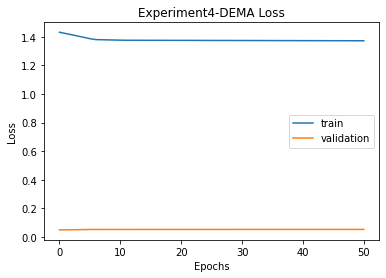


SMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 23.31830336349202 
RMSE:	 4.828902915103183 
MAPE:	 3.806885992834059

EMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 31.4391560756623 
RMSE:	 5.607063052584865 
MAPE:	 4.398444723456604

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 48.85272948439791 
RMSE:	 6.989472761546318 
MAPE:	 5.616901258925532

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 143.4471215002686 
RMSE:	 11.976941241413376 
MAPE:	 10.686872819228396
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(0,3,0)(

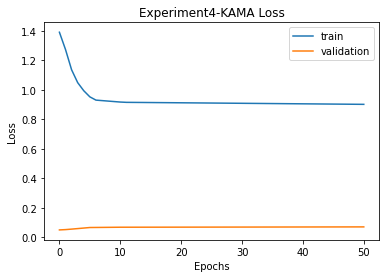


SMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 23.31830336349202 
RMSE:	 4.828902915103183 
MAPE:	 3.806885992834059

EMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 31.4391560756623 
RMSE:	 5.607063052584865 
MAPE:	 4.398444723456604

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 48.85272948439791 
RMSE:	 6.989472761546318 
MAPE:	 5.616901258925532

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 143.4471215002686 
RMSE:	 11.976941241413376 
MAPE:	 10.686872819228396

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 23.251670970583447 
RMSE:	 4.821998648961181 
MAPE:	 3.833042253232743
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MI

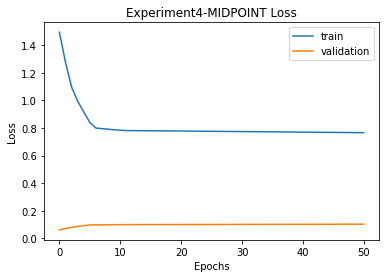


SMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 23.31830336349202 
RMSE:	 4.828902915103183 
MAPE:	 3.806885992834059

EMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 31.4391560756623 
RMSE:	 5.607063052584865 
MAPE:	 4.398444723456604

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 48.85272948439791 
RMSE:	 6.989472761546318 
MAPE:	 5.616901258925532

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 143.4471215002686 
RMSE:	 11.976941241413376 
MAPE:	 10.686872819228396

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 23.251670970583447 
RMSE:	 4.821998648961181 
MAPE:	 3.833042253232743

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 16.39872837560197 
RMSE:	 4.0495343405880595 
MAPE:	 3.299619771312048
T3
T3([input_arrays], [t

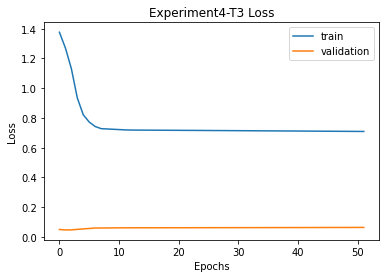


SMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 23.31830336349202 
RMSE:	 4.828902915103183 
MAPE:	 3.806885992834059

EMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 31.4391560756623 
RMSE:	 5.607063052584865 
MAPE:	 4.398444723456604

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 48.85272948439791 
RMSE:	 6.989472761546318 
MAPE:	 5.616901258925532

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 143.4471215002686 
RMSE:	 11.976941241413376 
MAPE:	 10.686872819228396

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 23.251670970583447 
RMSE:	 4.821998648961181 
MAPE:	 3.833042253232743

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 16.39872837560197 
RMSE:	 4.0495343405880595 
MAPE:	 3.299619771312048

T3
Prediction vs Close:

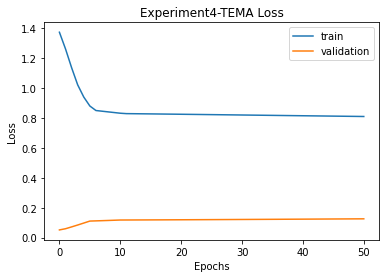


SMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	50.37% Accuracy
MSE:	 23.31830336349202 
RMSE:	 4.828902915103183 
MAPE:	 3.806885992834059

EMA
Prediction vs Close:		55.97% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 31.4391560756623 
RMSE:	 5.607063052584865 
MAPE:	 4.398444723456604

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.64% Accuracy
MSE:	 48.85272948439791 
RMSE:	 6.989472761546318 
MAPE:	 5.616901258925532

DEMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 143.4471215002686 
RMSE:	 11.976941241413376 
MAPE:	 10.686872819228396

KAMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 23.251670970583447 
RMSE:	 4.821998648961181 
MAPE:	 3.833042253232743

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 16.39872837560197 
RMSE:	 4.0495343405880595 
MAPE:	 3.299619771312048

T3
Prediction vs Close:

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation4 = {}
    imgfile = 'Experiment4'
    for ma in optimized_period:
              print(ma)
              print(functions[ma])
              print ( int( optimized_period[ma]))
            # if ma == 'SMA':
              low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
              low_vol = low_vol.fillna(0)
              low_vol_data = df['close']
              high_vol = pd.DataFrame()
              df2 = df.copy()
              for i in df2.columns:
                if i in low_vol.columns:
                  high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
              high_vol_data = df['close']
              ## *****************************************************
              # Generate ARIMA and LSTM predictions
              print('\nWorking on ' + ma + ' predictions')
              try:
                print('parameters used : ', train_len, test_len)
                low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima(low_vol,low_vol_data, train_len, test_len)
              except:
                  print('ARIMA error, skipping to next MA type')
                  continue
              Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
              final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
              mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
              rmse_ftr = mse_ftr ** 0.5
              mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
              mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

              final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
              mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
              rmse = mse ** 0.5
              mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
              # Generate prediction accuracy
              actual = df['close'].tail(test_len).values
              result_1 = []
              result_2 = []
              for i in range(1, len(final_prediction)):
                  # Compare prediction to previous close price
                  if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                      result_1.append(1)
                  elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                      result_1.append(1)
                  else:
                      result_1.append(0)

                  # Compare prediction to previous prediction
                  if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                      result_2.append(1)
                  elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                      result_2.append(1)
                  else:
                      result_2.append(0)

              accuracy_1 = np.mean(result_1)
              accuracy_2 = np.mean(result_2)

              simulation4[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                            'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                            'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                            'rmse': rmse_ftr, 'mae' : mae_ftr},
                                'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                          'rmse': rmse, 'mae': mae },
                                'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

              # save simulation data here as checkpoint
              with open('simulation4_data.json', 'w') as fp:
                  json.dump(simulation4, fp)

              for ma in simulation4.keys():
                  print('\n' + ma)
                  print('Prediction vs Close:\t\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs close'], 2))
                        + '% Accuracy')
                  print('Prediction vs Prediction:\t' + str(round(100*simulation4[ma]['accuracy']['prediction vs prediction'], 2))
                        + '% Accuracy')
                  print('MSE:\t', simulation4[ma]['final']['mse'],
                        '\nRMSE:\t', simulation4[ma]['final']['rmse'],
                        '\nMAPE:\t', simulation4[ma]['final']['mae'])#,
                        # '\nMAPE:\t', simulation[ma]['final']['mape'])
            # else:
            #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment4.png to Experiment4 (1).png


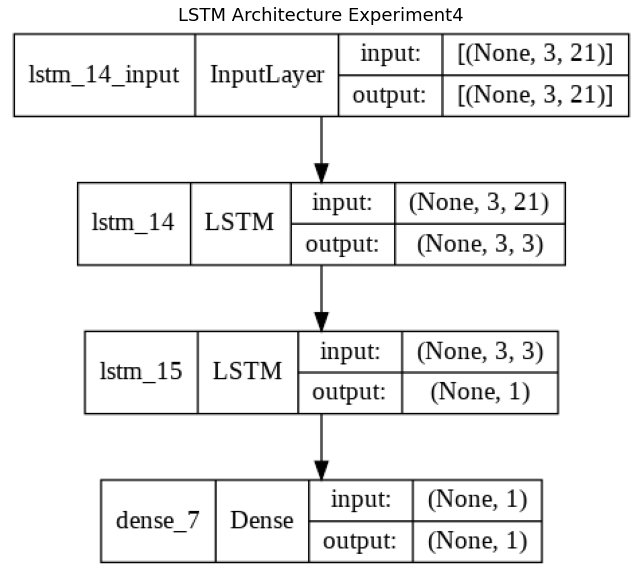

In [ ]:
img = cv2.imread('Experiment4.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [77]:
with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)
fileimg = 'Experiment4'

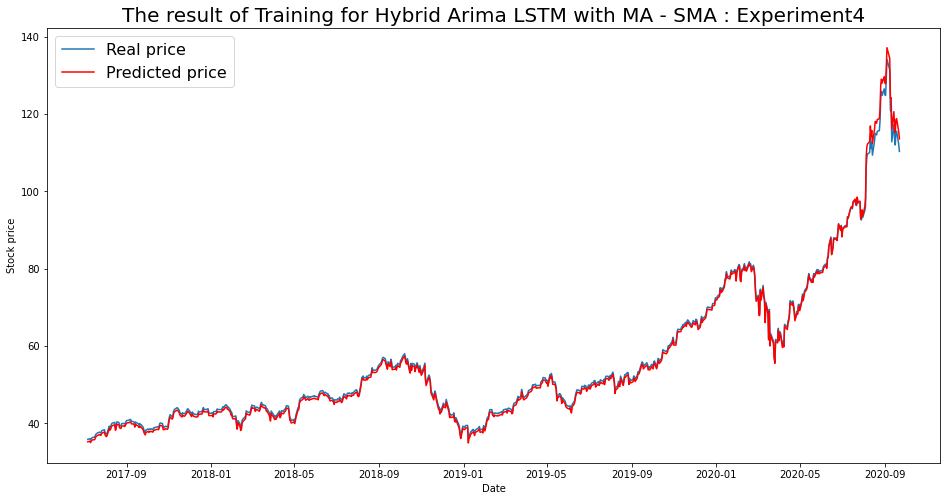

----- Train RMSE for SMA ----- 0.862136599337807
----- Train_MSE_LSTM for SMA ----- 0.7432795159177583
----- Train MAE LSTM for SMA ----- 0.6923502813471426


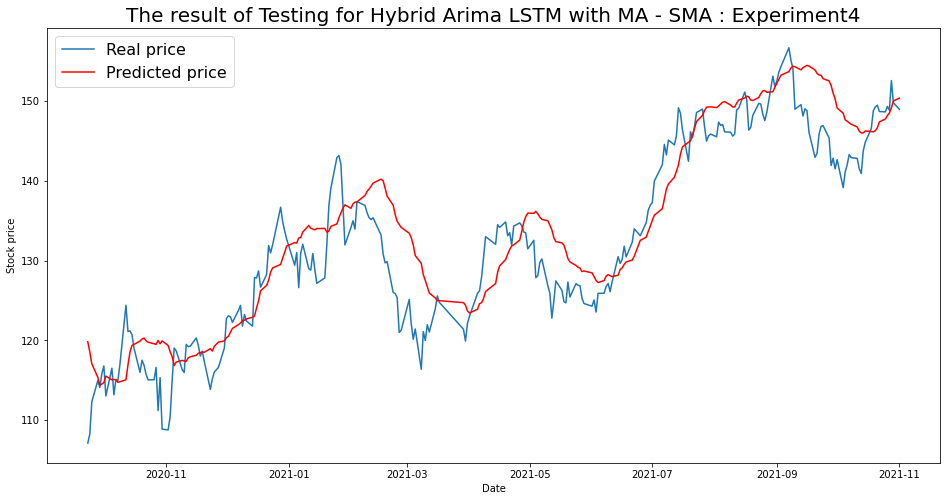

----- Test RMSE for SMA----- 4.828902915103183
----- Test_MSE_LSTM for SMA----- 23.31830336349202
----- Test_MAE_LSTM for SMA----- 3.806885992834059


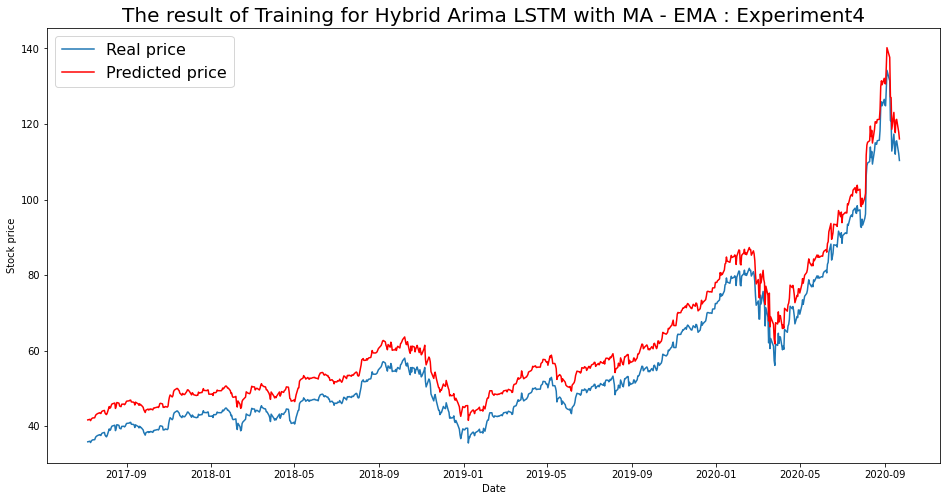

----- Train RMSE for EMA ----- 5.766823380655699
----- Train_MSE_LSTM for EMA ----- 33.25625190367723
----- Train MAE LSTM for EMA ----- 5.764868316083851


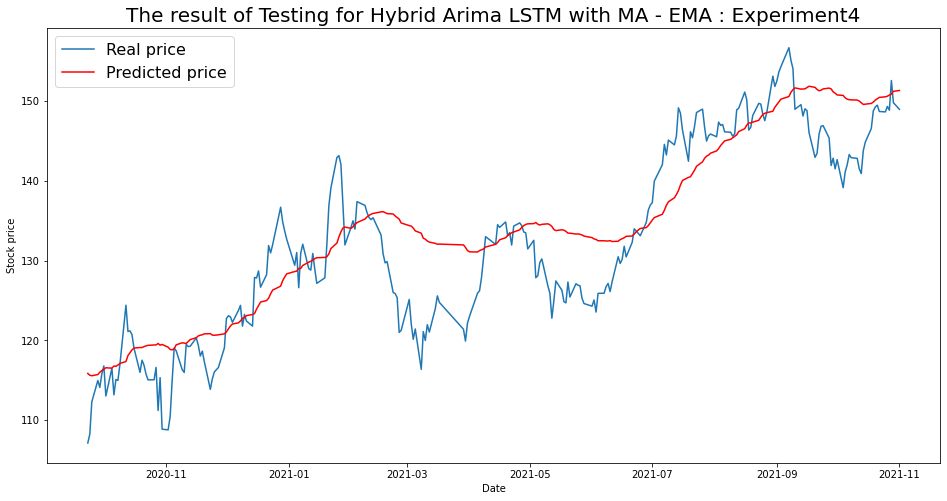

----- Test RMSE for EMA----- 5.607063052584865
----- Test_MSE_LSTM for EMA----- 31.4391560756623
----- Test_MAE_LSTM for EMA----- 4.398444723456604


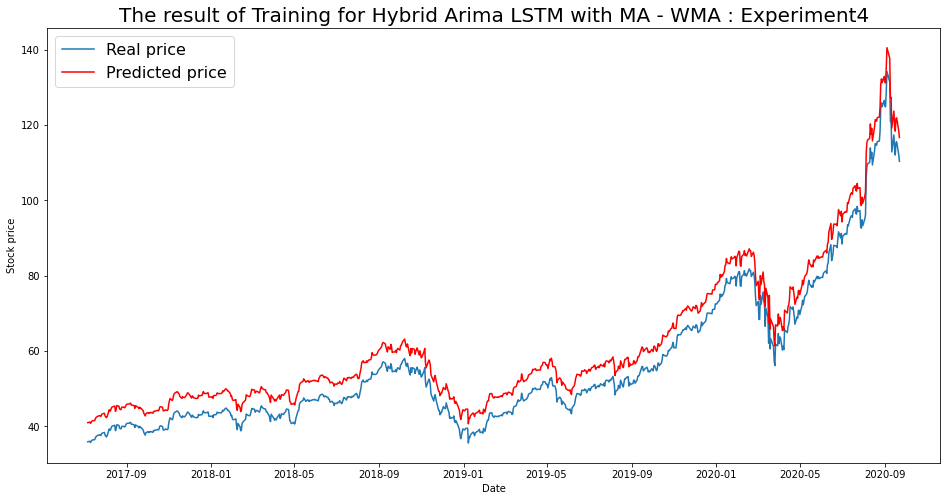

----- Train RMSE for WMA ----- 5.235584448867116
----- Train_MSE_LSTM for WMA ----- 27.41134452121919
----- Train MAE LSTM for WMA ----- 5.227147406870776


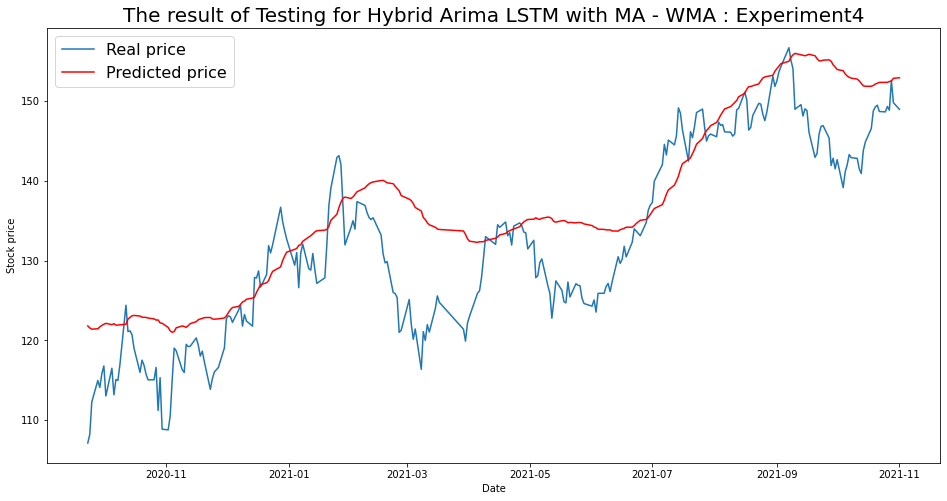

----- Test RMSE for WMA----- 6.989472761546318
----- Test_MSE_LSTM for WMA----- 48.85272948439791
----- Test_MAE_LSTM for WMA----- 5.616901258925532


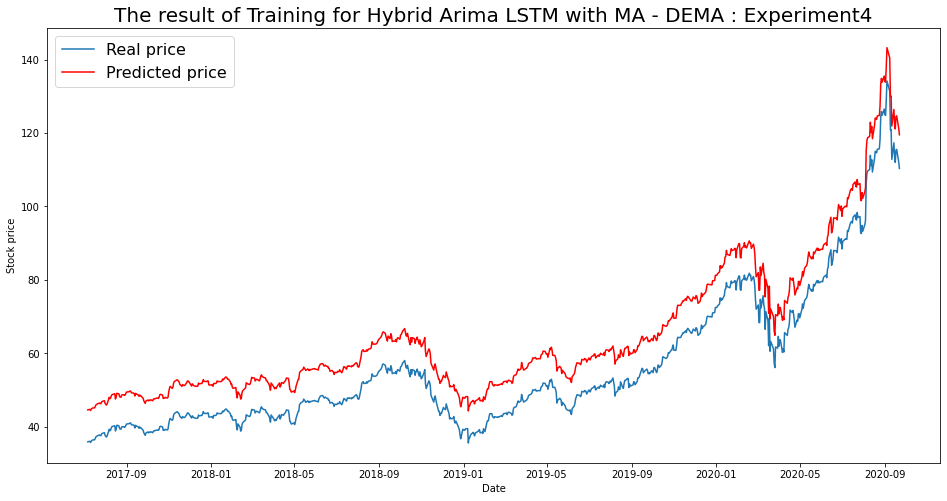

----- Train RMSE for DEMA ----- 8.750974100017887
----- Train_MSE_LSTM for DEMA ----- 76.57954769918385
----- Train MAE LSTM for DEMA ----- 8.750575766705051


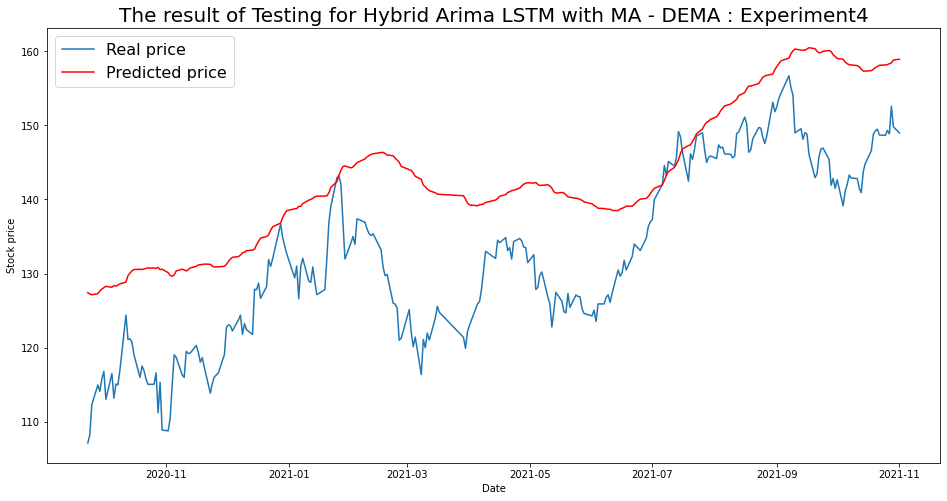

----- Test RMSE for DEMA----- 11.976941241413376
----- Test_MSE_LSTM for DEMA----- 143.4471215002686
----- Test_MAE_LSTM for DEMA----- 10.686872819228396


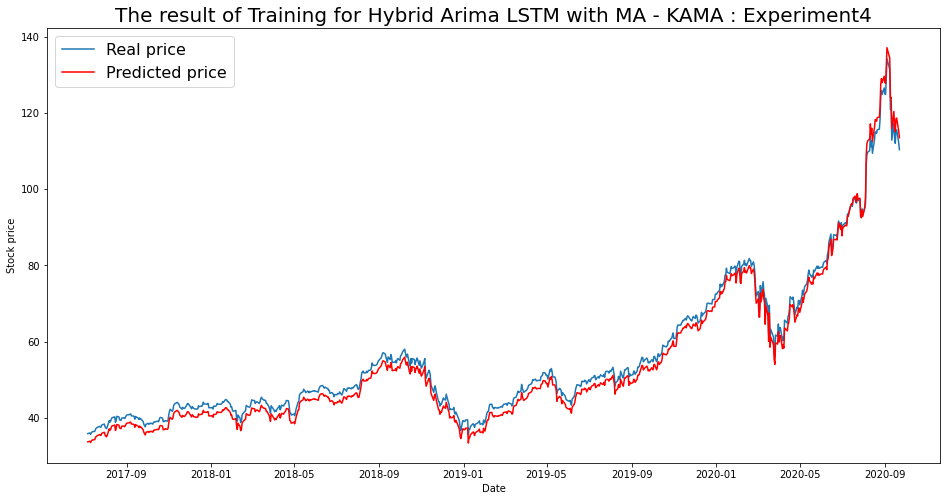

----- Train RMSE for KAMA ----- 2.103880765025744
----- Train_MSE_LSTM for KAMA ----- 4.42631427344531
----- Train MAE LSTM for KAMA ----- 2.0681962896101544


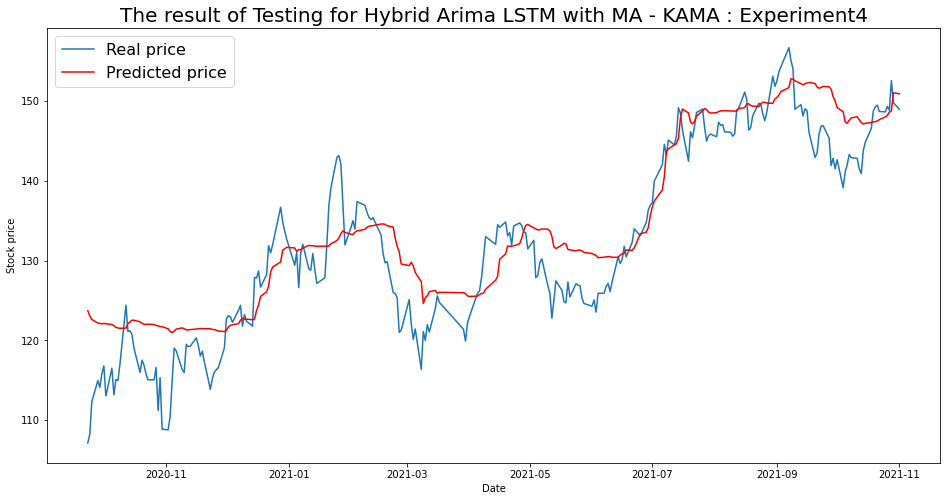

----- Test RMSE for KAMA----- 4.821998648961181
----- Test_MSE_LSTM for KAMA----- 23.251670970583447
----- Test_MAE_LSTM for KAMA----- 3.833042253232743


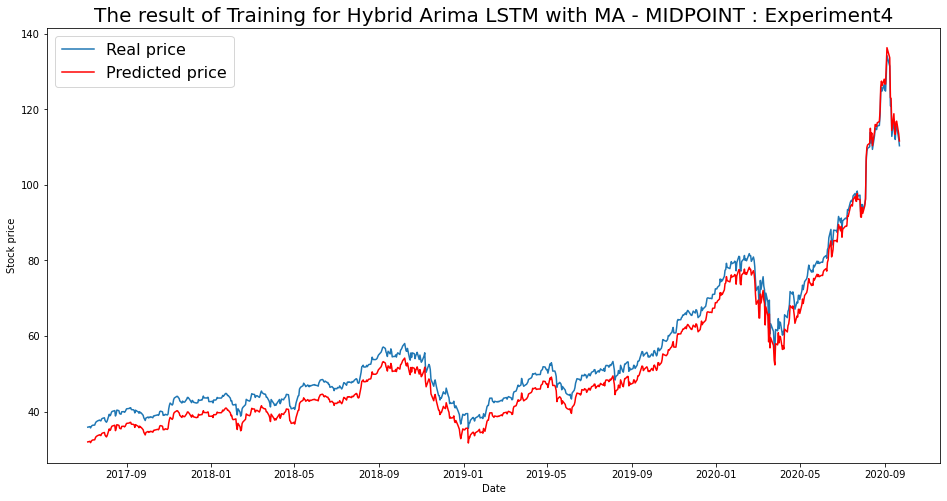

----- Train RMSE for MIDPOINT ----- 3.6774127068967175
----- Train_MSE_LSTM for MIDPOINT ----- 13.523364216845444
----- Train MAE LSTM for MIDPOINT ----- 3.613733980915334


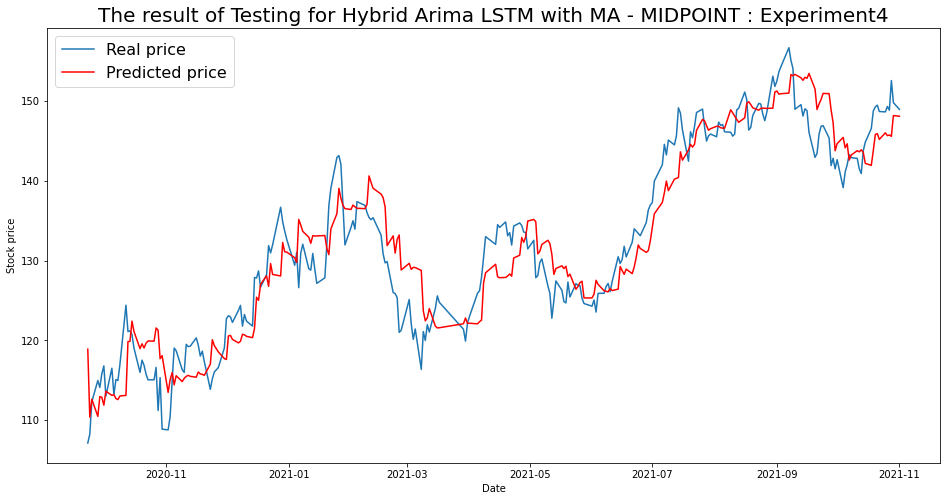

----- Test RMSE for MIDPOINT----- 4.0495343405880595
----- Test_MSE_LSTM for MIDPOINT----- 16.39872837560197
----- Test_MAE_LSTM for MIDPOINT----- 3.299619771312048


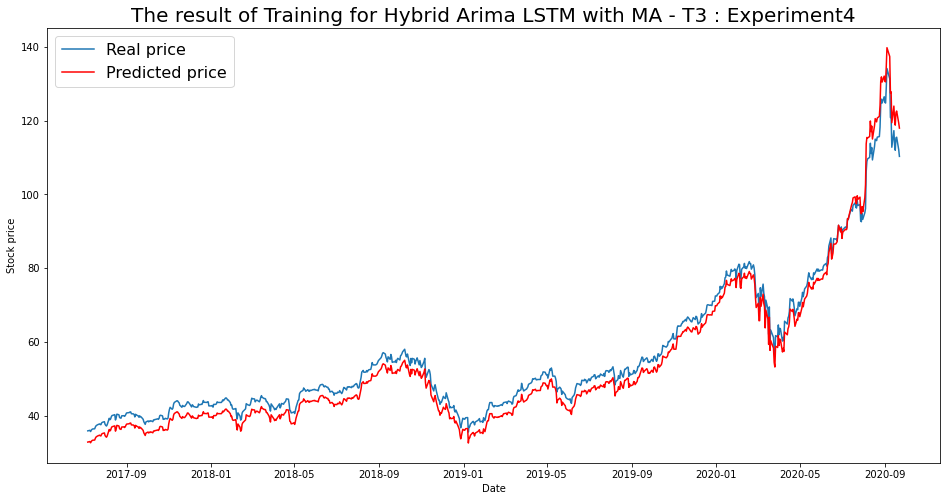

----- Train RMSE for T3 ----- 3.104004527969992
----- Train_MSE_LSTM for T3 ----- 9.634844109658212
----- Train MAE LSTM for T3 ----- 2.999024202327917


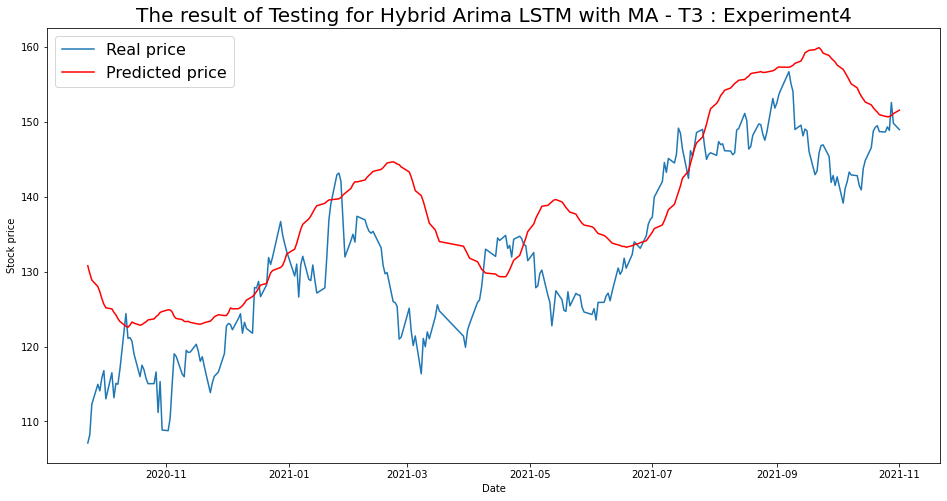

----- Test RMSE for T3----- 9.24312521872772
----- Test_MSE_LSTM for T3----- 85.43536380908036
----- Test_MAE_LSTM for T3----- 7.5496901284439915


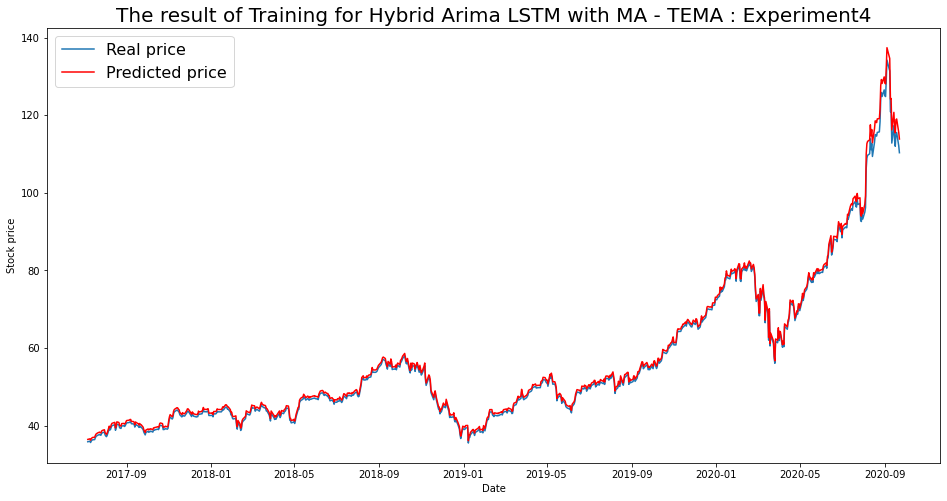

----- Train RMSE for TEMA ----- 0.9583344967025622
----- Train_MSE_LSTM for TEMA ----- 0.9184050075701532
----- Train MAE LSTM for TEMA ----- 0.7602822898638131


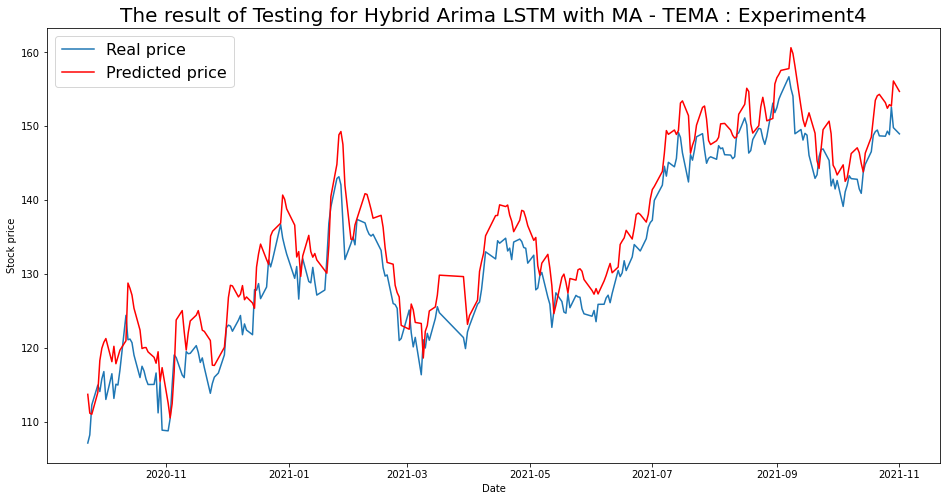

----- Test RMSE for TEMA----- 4.21298538343085
----- Test_MSE_LSTM for TEMA----- 17.749245841001986
----- Test_MAE_LSTM for TEMA----- 3.636908590169574


In [78]:
for i in range(len(list(simulation4.keys()))):
  SIM = list(simulation4.keys())[i]
  plot_train(simulation4,SIM)
  plot_test(simulation4,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 5

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det = 20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    model.add(Dense(units=64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    ## Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM5.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15000.708, Time=8.38 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13492.284, Time=2.29 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15827.971, Time=8.04 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13635.197, Time=10.22 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-14132.778, Time=3.77 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15140.312, Time=10.05 sec
 ARIMA(1,3,0)(0,0,0)[0] intercept   : AIC=-13970.469, Time=7.25 sec

Best model:  ARIMA(1,3,0)(0,0,0)[0]          
Total fit time: 50.014 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:              

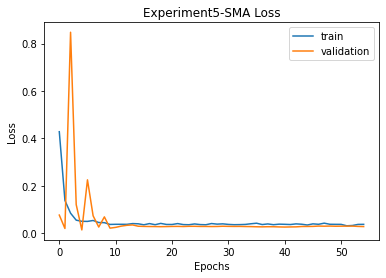


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 38.984836670221576 
RMSE:	 6.24378384236847 
MAPE:	 5.10393861237253
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.775, Time=2.37 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14574.593, Time=3.89 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16801.081, Time=8.82 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14572.593, Time=5.10 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-14532.068, Time=7.39 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15610.472, Time=11.82 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16103.302, Time=12.30 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17030.021, Time=4.45 sec
 ARIMA(3,3,0)(0,0,0)[0]

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17003.984, Time=3.22 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16998.666, Time=3.64 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 89.716 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.720
Date:                Sun, 12 Dec 2021   AIC                         -17087.441
Time:                        13:29:53   BIC                         -16965.479
Sample:                             0   HQIC                        -17040.602
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

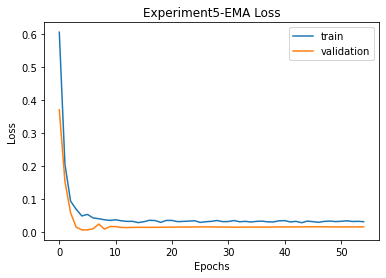


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 38.984836670221576 
RMSE:	 6.24378384236847 
MAPE:	 5.10393861237253

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 124.25764226707467 
RMSE:	 11.1470912020614 
MAPE:	 9.17724208981177
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-14480.432, Time=9.64 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-15747.905, Time=6.37 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15116.389, Time=7.16 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13532.115, Time=7.90 sec
 ARIMA(0,3,0)(0,0,0)[0] intercept   : AIC=-13619.624, Time=5.46 sec

Best model:  ARIMA(0,3,0)(0,0,0)[0]          
Total fit time: 36.552 se

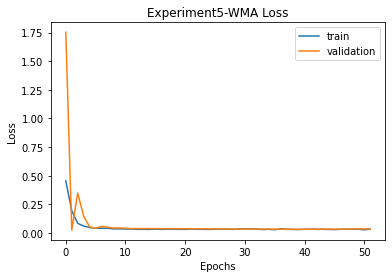


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 38.984836670221576 
RMSE:	 6.24378384236847 
MAPE:	 5.10393861237253

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 124.25764226707467 
RMSE:	 11.1470912020614 
MAPE:	 9.17724208981177

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 38.21405797999008 
RMSE:	 6.1817520154071275 
MAPE:	 5.0592557753421294
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.774, Time=2.43 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14574.593, Time=4.13 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15590.302, Time=7.08 sec
 ARIMA(0,3,1)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17003.985, Time=3.06 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16998.665, Time=4.11 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 82.076 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.721
Date:                Sun, 12 Dec 2021   AIC                         -17087.441
Time:                        13:40:00   BIC                         -16965.479
Sample:                             0   HQIC                        -17040.603
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

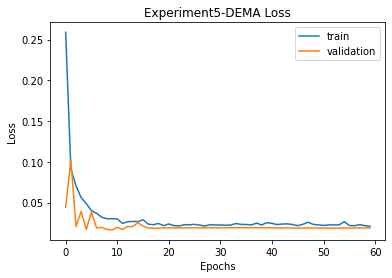


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 38.984836670221576 
RMSE:	 6.24378384236847 
MAPE:	 5.10393861237253

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 124.25764226707467 
RMSE:	 11.1470912020614 
MAPE:	 9.17724208981177

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 38.21405797999008 
RMSE:	 6.1817520154071275 
MAPE:	 5.0592557753421294

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	42.54% Accuracy
MSE:	 272.80520892035037 
RMSE:	 16.51681594376926 
MAPE:	 15.690440427295842
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.902, Time=2.37 sec
 ARIMA

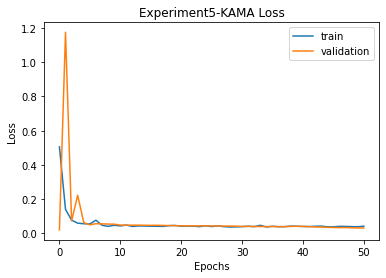


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 38.984836670221576 
RMSE:	 6.24378384236847 
MAPE:	 5.10393861237253

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 124.25764226707467 
RMSE:	 11.1470912020614 
MAPE:	 9.17724208981177

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 38.21405797999008 
RMSE:	 6.1817520154071275 
MAPE:	 5.0592557753421294

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	42.54% Accuracy
MSE:	 272.80520892035037 
RMSE:	 16.51681594376926 
MAPE:	 15.690440427295842

KAMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.855043502438484 
RMSE:	 6.313085101789654 
MAPE:	 4.932118299391016
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

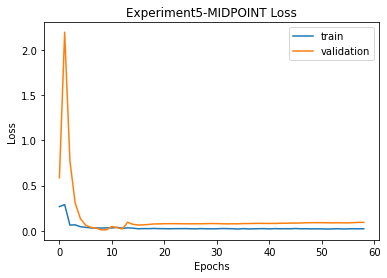


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 38.984836670221576 
RMSE:	 6.24378384236847 
MAPE:	 5.10393861237253

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 124.25764226707467 
RMSE:	 11.1470912020614 
MAPE:	 9.17724208981177

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 38.21405797999008 
RMSE:	 6.1817520154071275 
MAPE:	 5.0592557753421294

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	42.54% Accuracy
MSE:	 272.80520892035037 
RMSE:	 16.51681594376926 
MAPE:	 15.690440427295842

KAMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.855043502438484 
RMSE:	 6.313085101789654 
MAPE:	 4.932118299391016

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 247.8059617737088 
RMSE:	 15.741853822650901 
MAPE:	 13.137429929578502
T3
T3([input_arrays], [t

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16318.604, Time=3.35 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16567.270, Time=2.21 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 55.514 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8308.635
Date:                Sun, 12 Dec 2021   AIC                         -16569.270
Time:                        14:00:45   BIC                         -16456.690
Sample:                             0   HQIC                        -16526.035
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

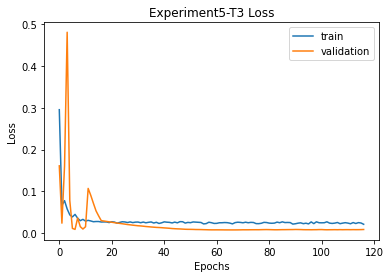


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 38.984836670221576 
RMSE:	 6.24378384236847 
MAPE:	 5.10393861237253

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 124.25764226707467 
RMSE:	 11.1470912020614 
MAPE:	 9.17724208981177

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 38.21405797999008 
RMSE:	 6.1817520154071275 
MAPE:	 5.0592557753421294

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	42.54% Accuracy
MSE:	 272.80520892035037 
RMSE:	 16.51681594376926 
MAPE:	 15.690440427295842

KAMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.855043502438484 
RMSE:	 6.313085101789654 
MAPE:	 4.932118299391016

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 247.8059617737088 
RMSE:	 15.741853822650901 
MAPE:	 13.137429929578502

T3
Prediction vs Close:

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16200.149, Time=3.37 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16461.809, Time=15.31 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=-16384.147, Time=3.25 sec
 ARIMA(3,3,2)(0,0,0)[0]             : AIC=inf, Time=10.13 sec
 ARIMA(2,3,1)(0,0,0)[0] intercept   : AIC=-15110.164, Time=5.64 sec

Best model:  ARIMA(2,3,1)(0,0,0)[0]          
Total fit time: 85.264 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(2, 3, 1)   Log Likelihood                8294.227
Date:                Sun, 12 Dec 2021   AIC                         -16538.454
Time:                        14:05:38   BIC                         -16421.183
Sample:                             0   HQIC                        -16493.417
                                - 808                                         
Covariance Type:                  

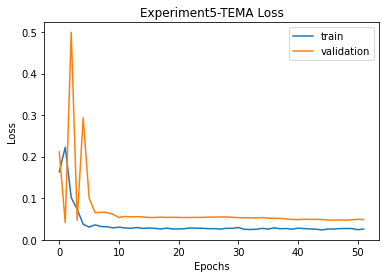


SMA
Prediction vs Close:		51.49% Accuracy
Prediction vs Prediction:	48.13% Accuracy
MSE:	 38.984836670221576 
RMSE:	 6.24378384236847 
MAPE:	 5.10393861237253

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 124.25764226707467 
RMSE:	 11.1470912020614 
MAPE:	 9.17724208981177

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 38.21405797999008 
RMSE:	 6.1817520154071275 
MAPE:	 5.0592557753421294

DEMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	42.54% Accuracy
MSE:	 272.80520892035037 
RMSE:	 16.51681594376926 
MAPE:	 15.690440427295842

KAMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	45.9% Accuracy
MSE:	 39.855043502438484 
RMSE:	 6.313085101789654 
MAPE:	 4.932118299391016

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 247.8059617737088 
RMSE:	 15.741853822650901 
MAPE:	 13.137429929578502

T3
Prediction vs Close:

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation5 = {}
    imgfile = 'Experiment5'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation5[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation5_data.json', 'w') as fp:
                    json.dump(simulation5, fp)

                for ma in simulation5.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation5[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation5[ma]['final']['mse'],
                          '\nRMSE:\t', simulation5[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation5[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment5.png to Experiment5 (1).png


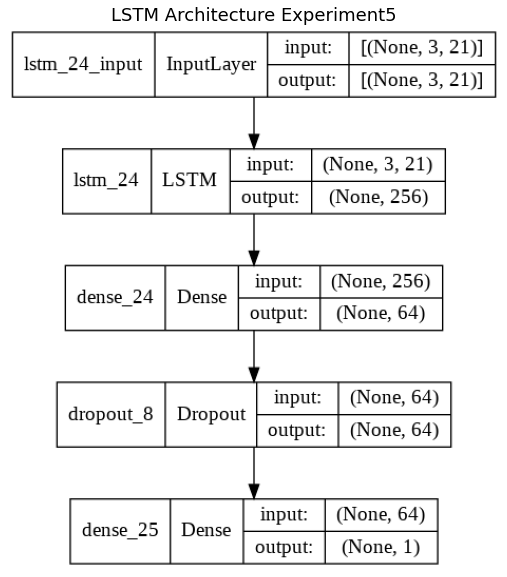

In [ ]:
img = cv2.imread('Experiment5.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [79]:
with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)
fileimg = 'Experiment5'

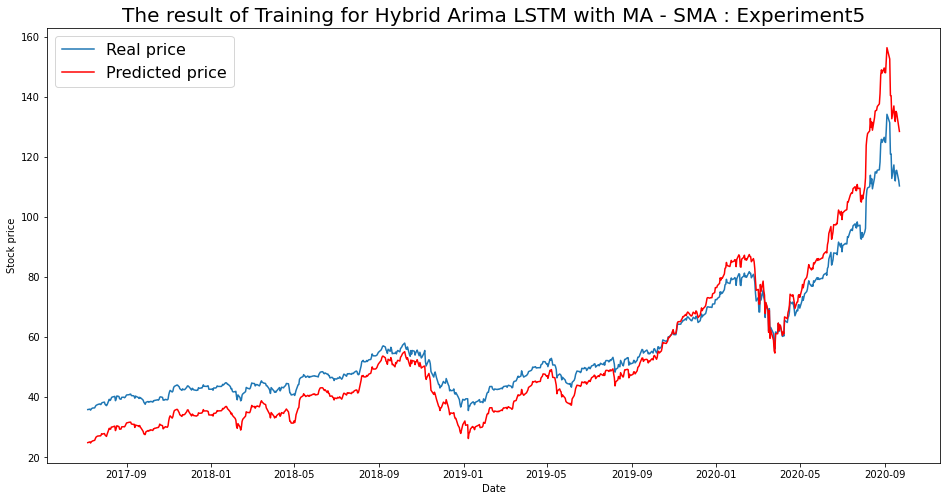

----- Train RMSE for SMA ----- 7.825688029871665
----- Train_MSE_LSTM for SMA ----- 61.24139314087665
----- Train MAE LSTM for SMA ----- 6.696912122355534


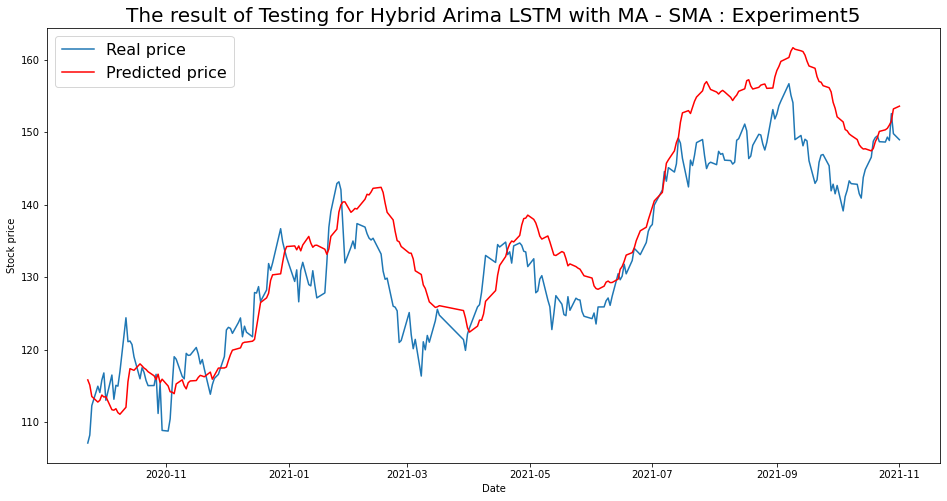

----- Test RMSE for SMA----- 6.24378384236847
----- Test_MSE_LSTM for SMA----- 38.984836670221576
----- Test_MAE_LSTM for SMA----- 5.10393861237253


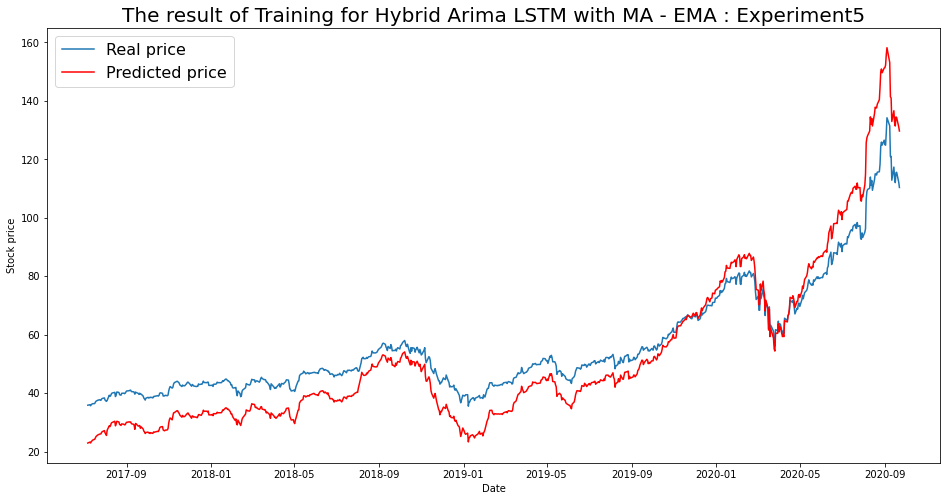

----- Train RMSE for EMA ----- 9.263860311359515
----- Train_MSE_LSTM for EMA ----- 85.819107868382
----- Train MAE LSTM for EMA ----- 8.131221693493242


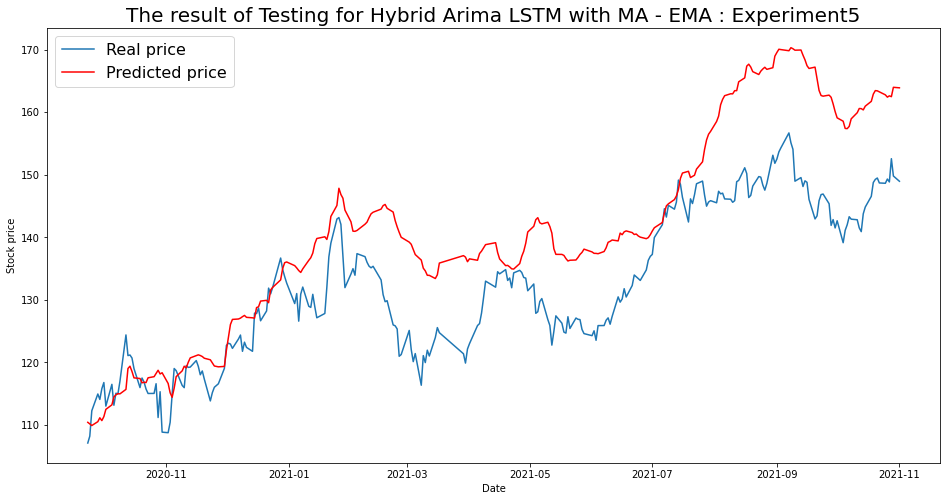

----- Test RMSE for EMA----- 11.1470912020614
----- Test_MSE_LSTM for EMA----- 124.25764226707467
----- Test_MAE_LSTM for EMA----- 9.17724208981177


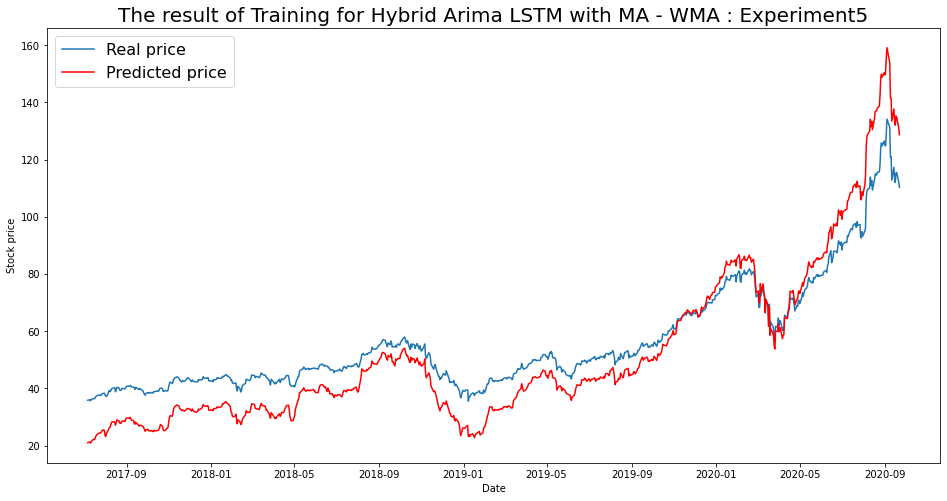

----- Train RMSE for WMA ----- 9.62296255691105
----- Train_MSE_LSTM for WMA ----- 92.60140837171207
----- Train MAE LSTM for WMA ----- 8.447782940991997


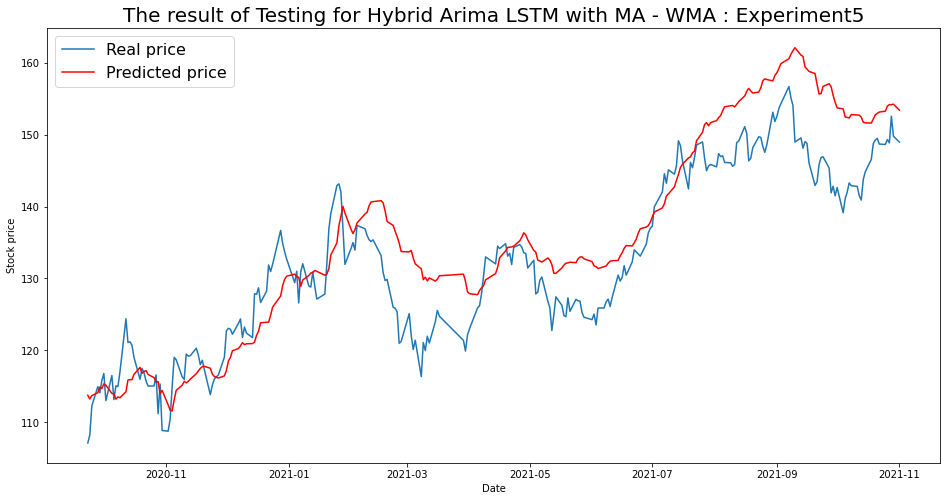

----- Test RMSE for WMA----- 6.1817520154071275
----- Test_MSE_LSTM for WMA----- 38.21405797999008
----- Test_MAE_LSTM for WMA----- 5.0592557753421294


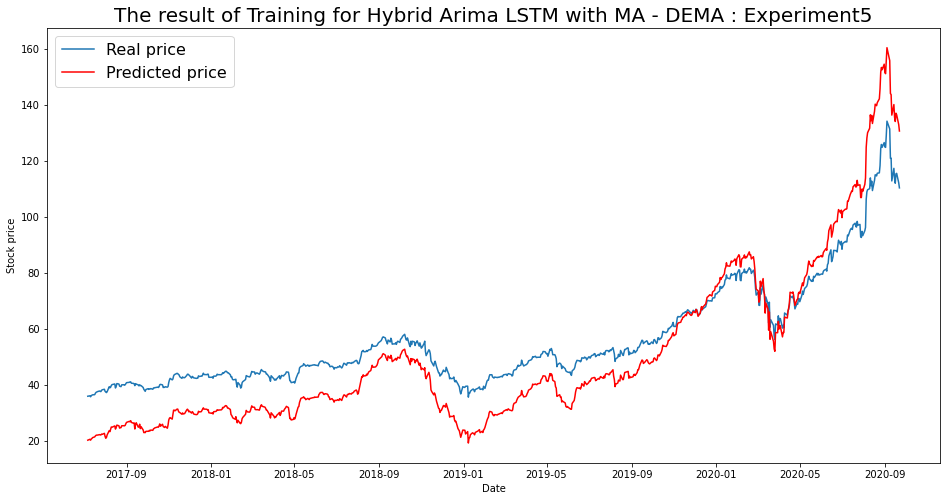

----- Train RMSE for DEMA ----- 11.500185279159618
----- Train_MSE_LSTM for DEMA ----- 132.25426145499958
----- Train MAE LSTM for DEMA ----- 10.30295939891055


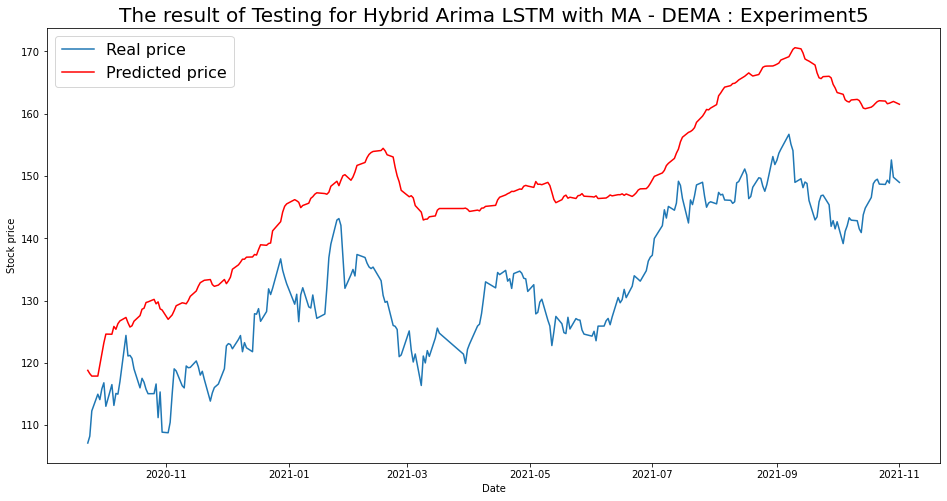

----- Test RMSE for DEMA----- 16.51681594376926
----- Test_MSE_LSTM for DEMA----- 272.80520892035037
----- Test_MAE_LSTM for DEMA----- 15.690440427295842


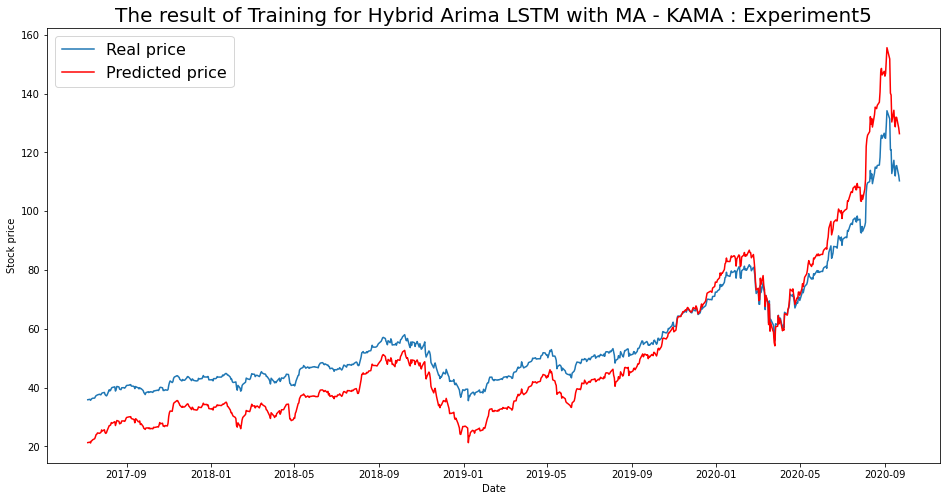

----- Train RMSE for KAMA ----- 9.40669400960287
----- Train_MSE_LSTM for KAMA ----- 88.48589219029851
----- Train MAE LSTM for KAMA ----- 8.417607692965897


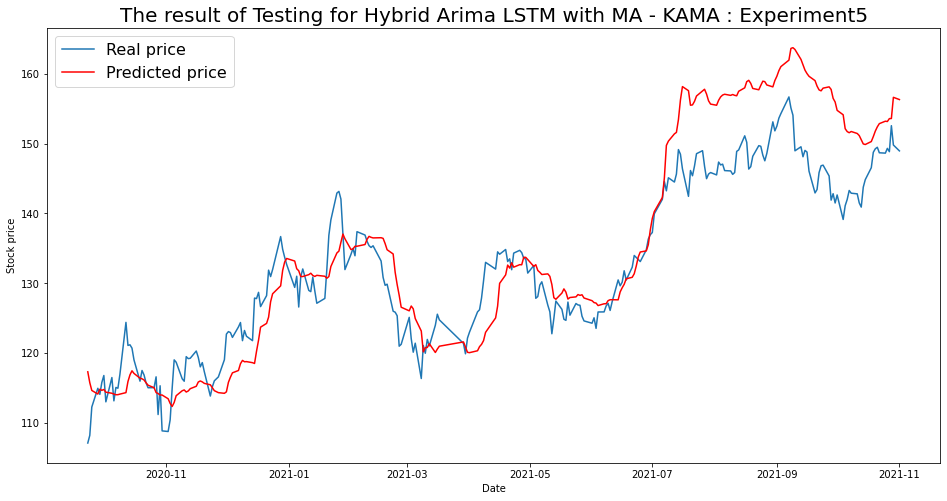

----- Test RMSE for KAMA----- 6.313085101789654
----- Test_MSE_LSTM for KAMA----- 39.855043502438484
----- Test_MAE_LSTM for KAMA----- 4.932118299391016


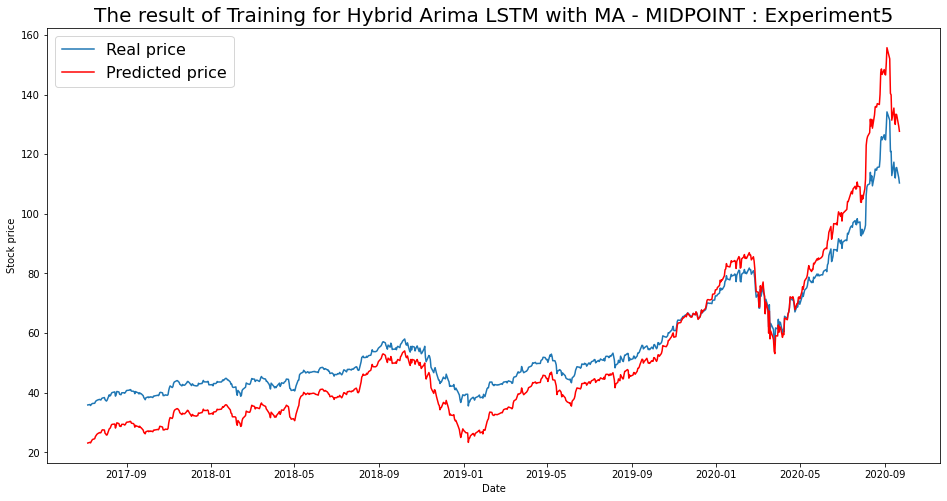

----- Train RMSE for MIDPOINT ----- 8.65407178367174
----- Train_MSE_LSTM for MIDPOINT ----- 74.89295843694336
----- Train MAE LSTM for MIDPOINT ----- 7.619016227644343


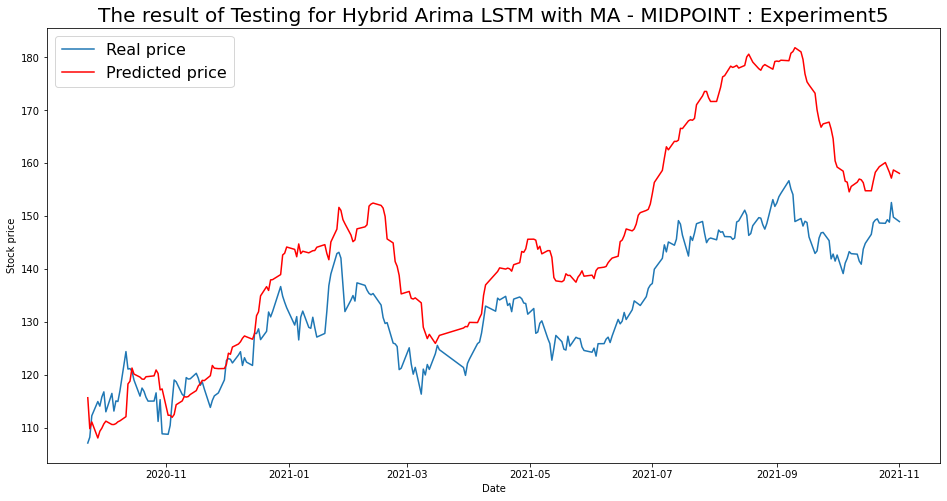

----- Test RMSE for MIDPOINT----- 15.741853822650901
----- Test_MSE_LSTM for MIDPOINT----- 247.8059617737088
----- Test_MAE_LSTM for MIDPOINT----- 13.137429929578502


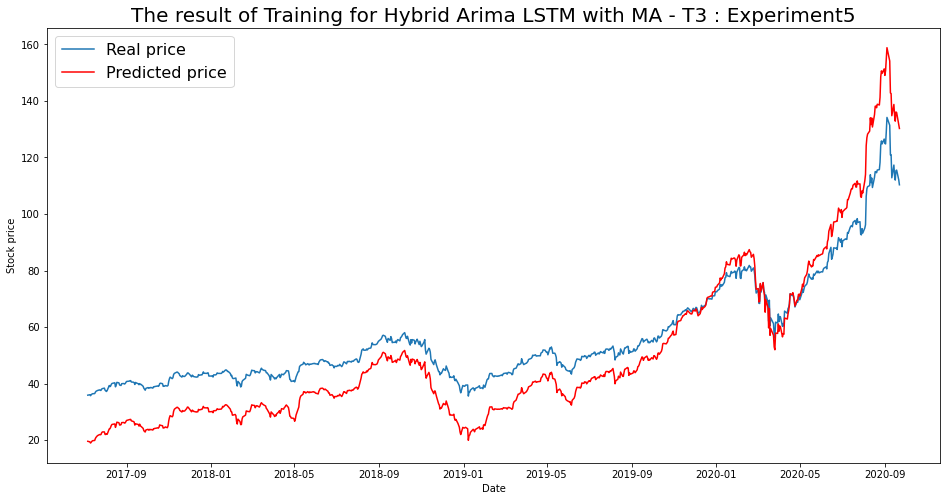

----- Train RMSE for T3 ----- 11.015384594469248
----- Train_MSE_LSTM for T3 ----- 121.33869776407043
----- Train MAE LSTM for T3 ----- 9.875190325929681


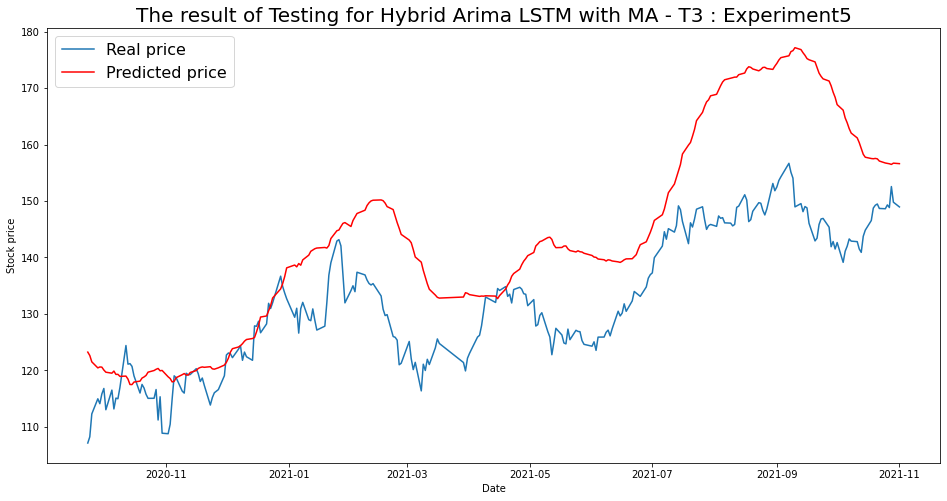

----- Test RMSE for T3----- 14.520507194247527
----- Test_MSE_LSTM for T3----- 210.84512917819418
----- Test_MAE_LSTM for T3----- 11.877711162377306


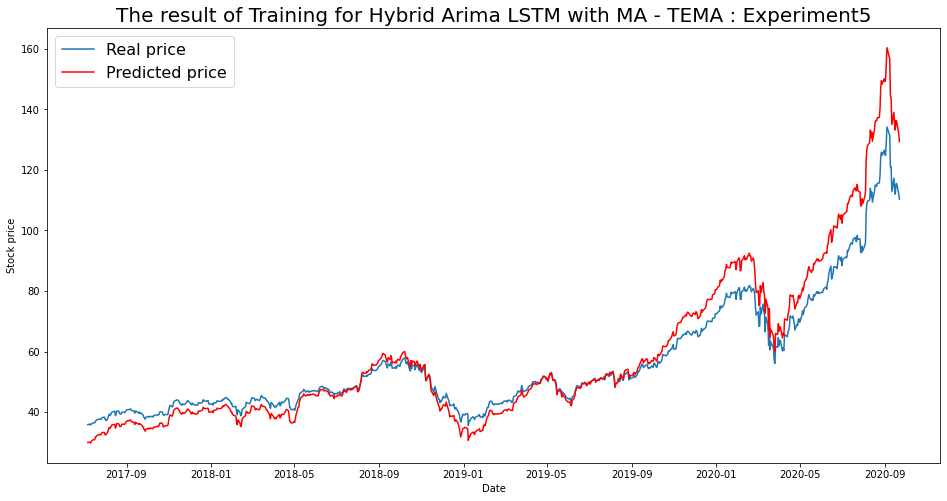

----- Train RMSE for TEMA ----- 6.884503600474202
----- Train_MSE_LSTM for TEMA ----- 47.396389824942254
----- Train MAE LSTM for TEMA ----- 4.709048845781707


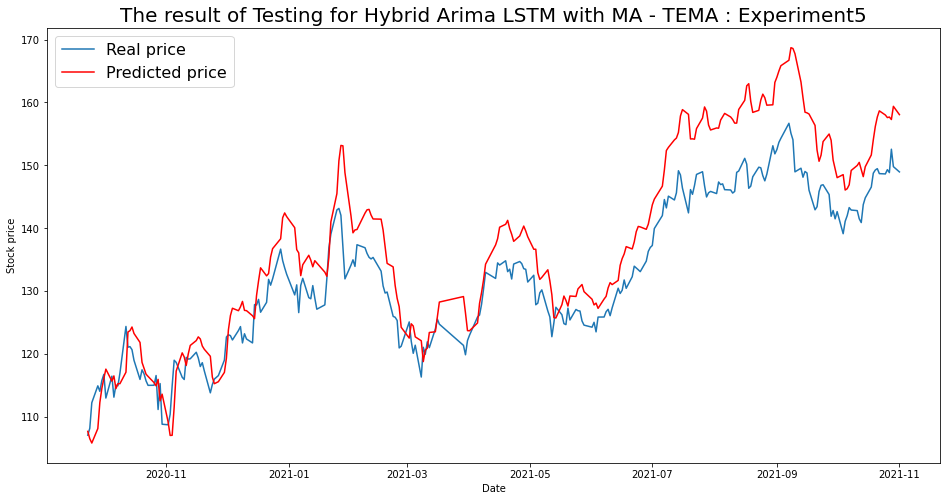

----- Test RMSE for TEMA----- 6.9148577552055706
----- Test_MSE_LSTM for TEMA----- 47.81525777472662
----- Test_MAE_LSTM for TEMA----- 5.805355375153735


In [80]:
for i in range(len(list(simulation5.keys()))):
  SIM = list(simulation5.keys())[i]
  plot_train(simulation5,SIM)
  plot_test(simulation5,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 6

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()


    # # option 2
    model = Sequential()
    model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    model.add(Dense(64))
    model.add(Dense(units=output_dim))
    model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM6.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15000.708, Time=8.47 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13492.284, Time=2.32 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15827.971, Time=7.98 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13635.197, Time=9.87 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-14132.778, Time=3.91 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15140.312, Time=9.72 sec
 ARIMA(1,3,0)(0,0,0)[0] intercept   : AIC=-13970.469, Time=7.17 sec

Best model:  ARIMA(1,3,0)(0,0,0)[0]          
Total fit time: 49.461 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               S

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.07591, saving model to LSTM6.h5
48/48 - 4s - loss: 0.1164 - accuracy: 0.0000e+00 - val_loss: 0.0759 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 81ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.07591 to 0.01860, saving model to LSTM6.h5
48/48 - 0s - loss: 0.0536 - accuracy: 0.0000e+00 - val_loss: 0.0186 - val_accuracy: 0.0037 - lr: 0.0010 - 246ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01860
48/48 - 0s - loss: 0.0141 - accuracy: 0.0000e+00 - val_loss: 0.0443 - val_accuracy: 0.0037 - lr: 0.0010 - 230ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.01860 to 0.00820, saving model to LSTM6.h5
48/48 - 0s - loss: 0.0156 - accuracy: 0.0000e+00 - val_loss: 0.0082 - val_accuracy: 0.0037 - lr: 0.0010 - 263ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00820
48/48 - 0s - loss: 0.0028 - accuracy: 0.0000e+00 - val_loss: 0.0182 - val_accura

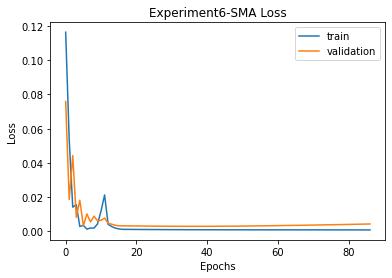


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 71.66891031373025 
RMSE:	 8.465749247038342 
MAPE:	 6.880610177712922
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.775, Time=2.24 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14574.593, Time=3.95 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16801.081, Time=8.73 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14572.593, Time=5.16 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-14532.068, Time=6.53 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15610.472, Time=11.59 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16103.302, Time=13.63 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17030.021, Time=4.20 sec
 ARIMA(3,3,0)(0,0,0)[0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17003.984, Time=3.06 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16998.666, Time=3.42 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 86.580 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.720
Date:                Sun, 12 Dec 2021   AIC                         -17087.441
Time:                        16:39:56   BIC                         -16965.479
Sample:                             0   HQIC                        -17040.602
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.01113, saving model to LSTM6.h5
16/16 - 3s - loss: 0.0891 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0037 - lr: 0.0010 - 3s/epoch - 216ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.01113
16/16 - 0s - loss: 0.0226 - accuracy: 0.0000e+00 - val_loss: 0.0154 - val_accuracy: 0.0037 - lr: 0.0010 - 97ms/epoch - 6ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.01113
16/16 - 0s - loss: 0.0111 - accuracy: 0.0000e+00 - val_loss: 0.0118 - val_accuracy: 0.0037 - lr: 0.0010 - 89ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.01113
16/16 - 0s - loss: 0.0026 - accuracy: 0.0000e+00 - val_loss: 0.0246 - val_accuracy: 0.0037 - lr: 0.0010 - 98ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01113
16/16 - 0s - loss: 0.0023 - accuracy: 0.0000e+00 - val_loss: 0.0205 - val_accuracy: 0.0037 - lr: 0.0010 - 89ms/epoch - 6ms/step
Epoch 6/500

E

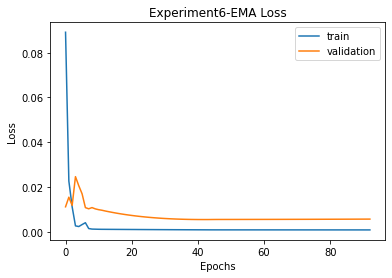


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 71.66891031373025 
RMSE:	 8.465749247038342 
MAPE:	 6.880610177712922

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 67.24711347278334 
RMSE:	 8.200433736869249 
MAPE:	 6.781803215137433
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-14480.432, Time=8.68 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-15747.905, Time=6.24 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15116.389, Time=6.89 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13532.115, Time=7.94 sec
 ARIMA(0,3,0)(0,0,0)[0] intercept   : AIC=-13619.624, Time=5.24 sec

Best model:  ARIMA(0,3,0)(0,0,0)[0]          
Total fit time: 35.004 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.15122, saving model to LSTM6.h5
17/17 - 4s - loss: 0.1166 - accuracy: 0.0000e+00 - val_loss: 0.1512 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 4s/epoch - 210ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.15122 to 0.08149, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0463 - accuracy: 0.0000e+00 - val_loss: 0.0815 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 124ms/epoch - 7ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.08149 to 0.00911, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0091 - val_accuracy: 0.0037 - lr: 0.0010 - 129ms/epoch - 8ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.00911 to 0.00792, saving model to LSTM6.h5
17/17 - 0s - loss: 0.0043 - accuracy: 0.0000e+00 - val_loss: 0.0079 - val_accuracy: 0.0037 - lr: 0.0010 - 113ms/epoch - 7ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00792
17/17 - 0s - loss: 0.0047 - accuracy: 0.0

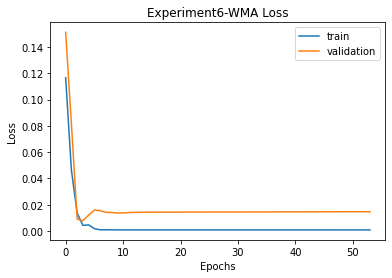


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 71.66891031373025 
RMSE:	 8.465749247038342 
MAPE:	 6.880610177712922

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 67.24711347278334 
RMSE:	 8.200433736869249 
MAPE:	 6.781803215137433

WMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.550384022767716 
RMSE:	 7.6518222681115455 
MAPE:	 6.1413991074844
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.774, Time=2.34 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14574.593, Time=4.01 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15590.302, Time=6.94 sec
 ARIMA(0,3,1)(0,0,0)[0]          

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17003.985, Time=3.09 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16998.665, Time=3.65 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 77.572 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.721
Date:                Sun, 12 Dec 2021   AIC                         -17087.441
Time:                        16:49:55   BIC                         -16965.479
Sample:                             0   HQIC                        -17040.603
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.06618, saving model to LSTM6.h5
10/10 - 4s - loss: 0.2504 - accuracy: 0.0000e+00 - val_loss: 0.0662 - val_accuracy: 0.0000e+00 - lr: 0.0010 - 4s/epoch - 380ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.06618 to 0.03100, saving model to LSTM6.h5
10/10 - 0s - loss: 0.0628 - accuracy: 0.0000e+00 - val_loss: 0.0310 - val_accuracy: 0.0037 - lr: 0.0010 - 91ms/epoch - 9ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03100
10/10 - 0s - loss: 0.0124 - accuracy: 0.0000e+00 - val_loss: 0.0482 - val_accuracy: 0.0037 - lr: 0.0010 - 63ms/epoch - 6ms/step
Epoch 4/500

Epoch 00004: val_loss did not improve from 0.03100
10/10 - 0s - loss: 0.0035 - accuracy: 0.0000e+00 - val_loss: 0.0460 - val_accuracy: 0.0037 - lr: 0.0010 - 66ms/epoch - 7ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.03100
10/10 - 0s - loss: 0.0018 - accuracy: 0.0000e+00 - val_loss: 0.0350 - val_accuracy: 0.0037 - lr: 0.0010 - 62

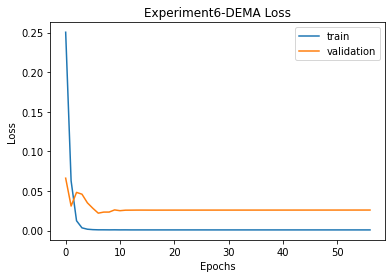


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 71.66891031373025 
RMSE:	 8.465749247038342 
MAPE:	 6.880610177712922

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 67.24711347278334 
RMSE:	 8.200433736869249 
MAPE:	 6.781803215137433

WMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.550384022767716 
RMSE:	 7.6518222681115455 
MAPE:	 6.1413991074844

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 127.72881036471918 
RMSE:	 11.301717142307146 
MAPE:	 10.306940424406019
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.902, Time=2.09 sec
 ARIMA

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.04322, saving model to LSTM6.h5
45/45 - 4s - loss: 0.1157 - accuracy: 0.0000e+00 - val_loss: 0.0432 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 88ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.04322 to 0.02118, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0138 - accuracy: 0.0000e+00 - val_loss: 0.0212 - val_accuracy: 0.0037 - lr: 0.0010 - 223ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.02118
45/45 - 0s - loss: 0.0091 - accuracy: 0.0000e+00 - val_loss: 0.0243 - val_accuracy: 0.0037 - lr: 0.0010 - 220ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.02118 to 0.00757, saving model to LSTM6.h5
45/45 - 0s - loss: 0.0124 - accuracy: 0.0000e+00 - val_loss: 0.0076 - val_accuracy: 0.0037 - lr: 0.0010 - 249ms/epoch - 6ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00757
45/45 - 0s - loss: 0.0094 - accuracy: 0.0000e+00 - val_loss: 0.0082 - val_accura

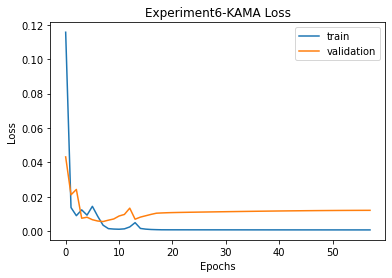


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 71.66891031373025 
RMSE:	 8.465749247038342 
MAPE:	 6.880610177712922

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 67.24711347278334 
RMSE:	 8.200433736869249 
MAPE:	 6.781803215137433

WMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.550384022767716 
RMSE:	 7.6518222681115455 
MAPE:	 6.1413991074844

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 127.72881036471918 
RMSE:	 11.301717142307146 
MAPE:	 10.306940424406019

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.855468679122 
RMSE:	 6.622346161227303 
MAPE:	 5.4751276749367985
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MID

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.00811, saving model to LSTM6.h5
58/58 - 4s - loss: 0.1472 - accuracy: 0.0000e+00 - val_loss: 0.0081 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 63ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.00811
58/58 - 0s - loss: 0.0220 - accuracy: 0.0000e+00 - val_loss: 0.0081 - val_accuracy: 0.0037 - lr: 0.0010 - 293ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.00811
58/58 - 0s - loss: 0.0168 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0037 - lr: 0.0010 - 274ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.00811 to 0.00638, saving model to LSTM6.h5
58/58 - 0s - loss: 0.0052 - accuracy: 0.0000e+00 - val_loss: 0.0064 - val_accuracy: 0.0037 - lr: 0.0010 - 299ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00638
58/58 - 0s - loss: 0.0028 - accuracy: 0.0000e+00 - val_loss: 0.0088 - val_accuracy: 0.0037 - lr: 0.0010 - 273m

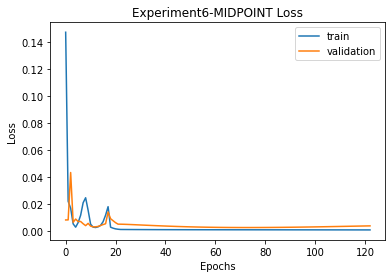


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 71.66891031373025 
RMSE:	 8.465749247038342 
MAPE:	 6.880610177712922

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 67.24711347278334 
RMSE:	 8.200433736869249 
MAPE:	 6.781803215137433

WMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.550384022767716 
RMSE:	 7.6518222681115455 
MAPE:	 6.1413991074844

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 127.72881036471918 
RMSE:	 11.301717142307146 
MAPE:	 10.306940424406019

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.855468679122 
RMSE:	 6.622346161227303 
MAPE:	 5.4751276749367985

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 67.44416314351042 
RMSE:	 8.212439536673035 
MAPE:	 6.768235104271493
T3
T3([input_arrays], [tim

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16318.604, Time=3.49 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16567.270, Time=2.32 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 54.991 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8308.635
Date:                Sun, 12 Dec 2021   AIC                         -16569.270
Time:                        17:10:07   BIC                         -16456.690
Sample:                             0   HQIC                        -16526.035
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.03167, saving model to LSTM6.h5
43/43 - 4s - loss: 0.1223 - accuracy: 0.0000e+00 - val_loss: 0.0317 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 97ms/step
Epoch 2/500

Epoch 00002: val_loss did not improve from 0.03167
43/43 - 0s - loss: 0.0537 - accuracy: 0.0000e+00 - val_loss: 0.0551 - val_accuracy: 0.0037 - lr: 0.0010 - 213ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss did not improve from 0.03167
43/43 - 0s - loss: 0.0270 - accuracy: 0.0000e+00 - val_loss: 0.0575 - val_accuracy: 0.0037 - lr: 0.0010 - 208ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.03167 to 0.01264, saving model to LSTM6.h5
43/43 - 0s - loss: 0.0175 - accuracy: 0.0000e+00 - val_loss: 0.0126 - val_accuracy: 0.0037 - lr: 0.0010 - 222ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.01264
43/43 - 0s - loss: 0.0093 - accuracy: 0.0000e+00 - val_loss: 0.0307 - val_accuracy: 0.0037 - lr: 0.0010 - 214m

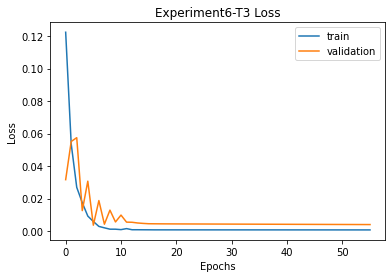


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 71.66891031373025 
RMSE:	 8.465749247038342 
MAPE:	 6.880610177712922

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 67.24711347278334 
RMSE:	 8.200433736869249 
MAPE:	 6.781803215137433

WMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.550384022767716 
RMSE:	 7.6518222681115455 
MAPE:	 6.1413991074844

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 127.72881036471918 
RMSE:	 11.301717142307146 
MAPE:	 10.306940424406019

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.855468679122 
RMSE:	 6.622346161227303 
MAPE:	 5.4751276749367985

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 67.44416314351042 
RMSE:	 8.212439536673035 
MAPE:	 6.768235104271493

T3
Prediction vs Close:		

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16200.149, Time=3.34 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16461.809, Time=16.02 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=-16384.147, Time=3.44 sec
 ARIMA(3,3,2)(0,0,0)[0]             : AIC=inf, Time=9.34 sec
 ARIMA(2,3,1)(0,0,0)[0] intercept   : AIC=-15110.164, Time=5.45 sec

Best model:  ARIMA(2,3,1)(0,0,0)[0]          
Total fit time: 85.353 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(2, 3, 1)   Log Likelihood                8294.227
Date:                Sun, 12 Dec 2021   AIC                         -16538.454
Time:                        17:14:34   BIC                         -16421.183
Sample:                             0   HQIC                        -16493.417
                                - 808                                         
Covariance Type:                  o

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.08025, saving model to LSTM6.h5
90/90 - 4s - loss: 0.1296 - accuracy: 0.0000e+00 - val_loss: 0.0802 - val_accuracy: 0.0037 - lr: 0.0010 - 4s/epoch - 46ms/step
Epoch 2/500

Epoch 00002: val_loss improved from 0.08025 to 0.00870, saving model to LSTM6.h5
90/90 - 0s - loss: 0.0263 - accuracy: 0.0000e+00 - val_loss: 0.0087 - val_accuracy: 0.0037 - lr: 0.0010 - 446ms/epoch - 5ms/step
Epoch 3/500

Epoch 00003: val_loss improved from 0.00870 to 0.00668, saving model to LSTM6.h5
90/90 - 0s - loss: 0.0346 - accuracy: 0.0000e+00 - val_loss: 0.0067 - val_accuracy: 0.0037 - lr: 0.0010 - 427ms/epoch - 5ms/step
Epoch 4/500

Epoch 00004: val_loss improved from 0.00668 to 0.00660, saving model to LSTM6.h5
90/90 - 0s - loss: 0.0286 - accuracy: 0.0000e+00 - val_loss: 0.0066 - val_accuracy: 0.0037 - lr: 0.0010 - 437ms/epoch - 5ms/step
Epoch 5/500

Epoch 00005: val_loss did not improve from 0.00660
90/90 - 0s - loss: 0.0280 - accuracy: 0.0000e+00 -

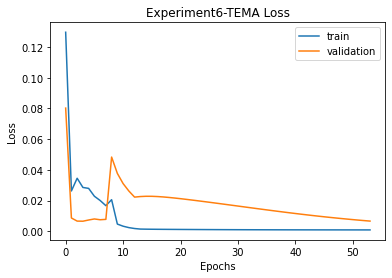


SMA
Prediction vs Close:		53.73% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 71.66891031373025 
RMSE:	 8.465749247038342 
MAPE:	 6.880610177712922

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	43.66% Accuracy
MSE:	 67.24711347278334 
RMSE:	 8.200433736869249 
MAPE:	 6.781803215137433

WMA
Prediction vs Close:		55.6% Accuracy
Prediction vs Prediction:	47.76% Accuracy
MSE:	 58.550384022767716 
RMSE:	 7.6518222681115455 
MAPE:	 6.1413991074844

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 127.72881036471918 
RMSE:	 11.301717142307146 
MAPE:	 10.306940424406019

KAMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.51% Accuracy
MSE:	 43.855468679122 
RMSE:	 6.622346161227303 
MAPE:	 5.4751276749367985

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 67.44416314351042 
RMSE:	 8.212439536673035 
MAPE:	 6.768235104271493

T3
Prediction vs Close:		

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation6 = {}
    imgfile = 'Experiment6'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation6[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation6_data.json', 'w') as fp:
                    json.dump(simulation6, fp)

                for ma in simulation6.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation6[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation6[ma]['final']['mse'],
                          '\nRMSE:\t', simulation6[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation6[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

Saving Experiment6.png to Experiment6 (1).png


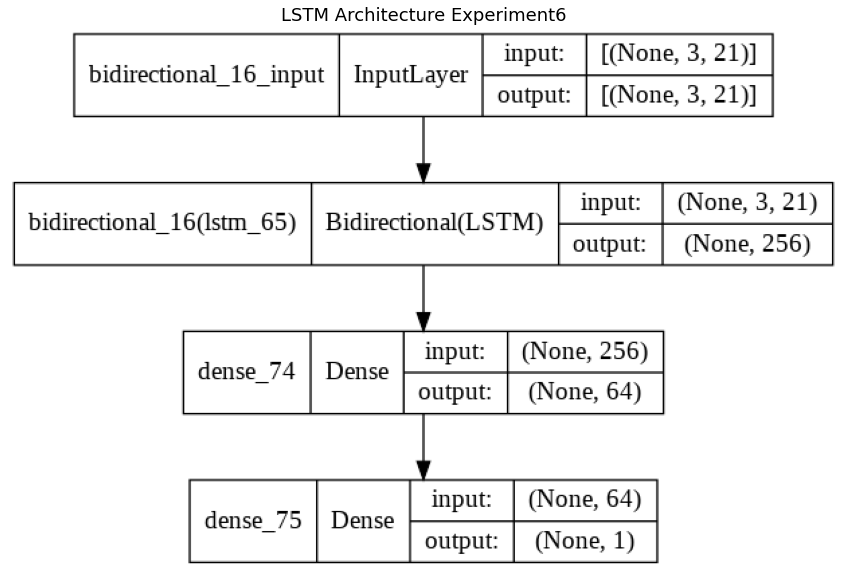

In [ ]:
imgfile = 'Experiment6'
img = cv2.imread('Experiment6.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [81]:
with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)
fileimg = 'Experiment6'

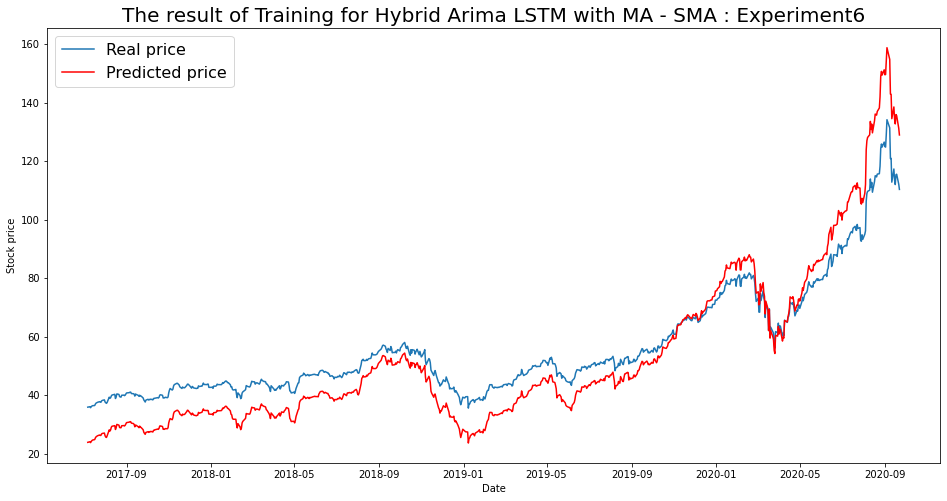

----- Train RMSE for SMA ----- 8.860010937586445
----- Train_MSE_LSTM for SMA ----- 78.49979381415143
----- Train MAE LSTM for SMA ----- 7.754632690589469


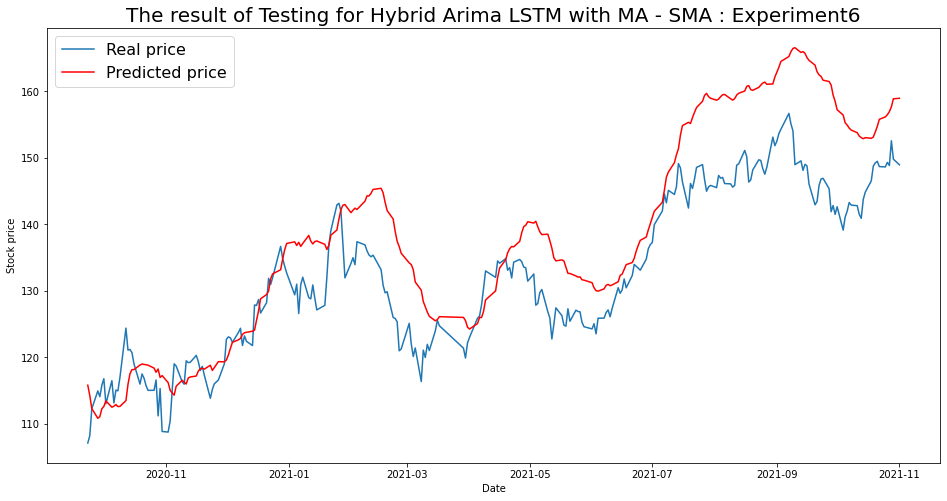

----- Test RMSE for SMA----- 8.465749247038342
----- Test_MSE_LSTM for SMA----- 71.66891031373025
----- Test_MAE_LSTM for SMA----- 6.880610177712922


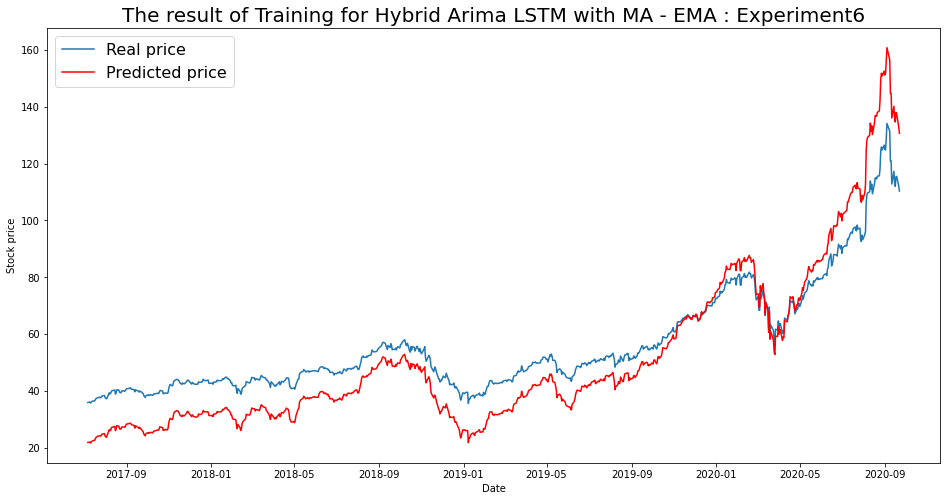

----- Train RMSE for EMA ----- 10.185838832459739
----- Train_MSE_LSTM for EMA ----- 103.7513127208448
----- Train MAE LSTM for EMA ----- 9.021545289753416


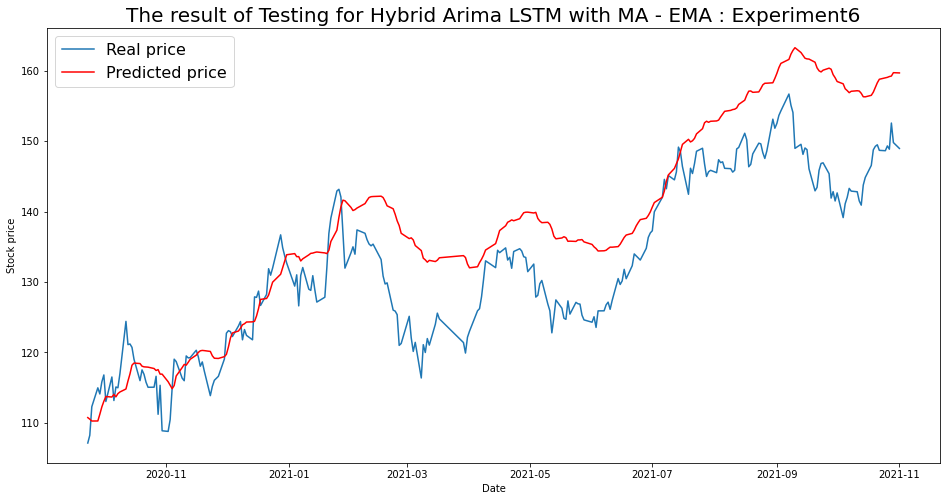

----- Test RMSE for EMA----- 8.200433736869249
----- Test_MSE_LSTM for EMA----- 67.24711347278334
----- Test_MAE_LSTM for EMA----- 6.781803215137433


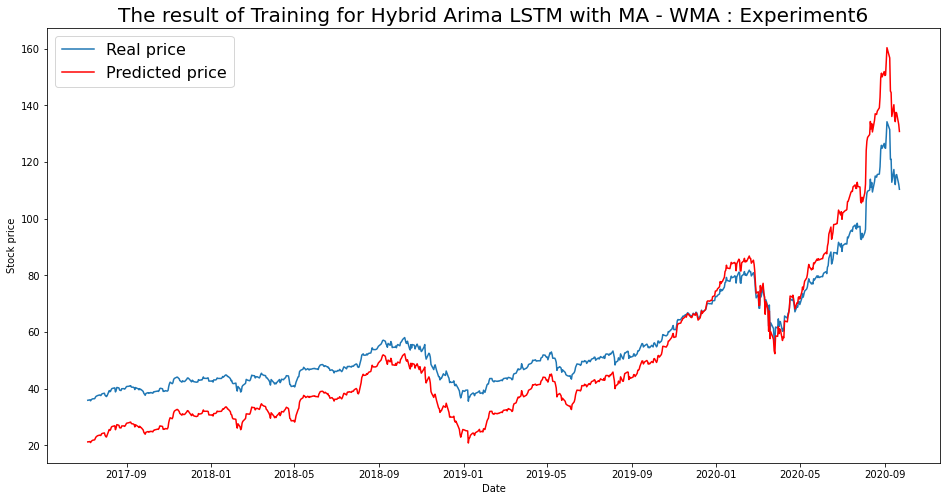

----- Train RMSE for WMA ----- 10.495797568969957
----- Train_MSE_LSTM for WMA ----- 110.16176660879566
----- Train MAE LSTM for WMA ----- 9.342000266276576


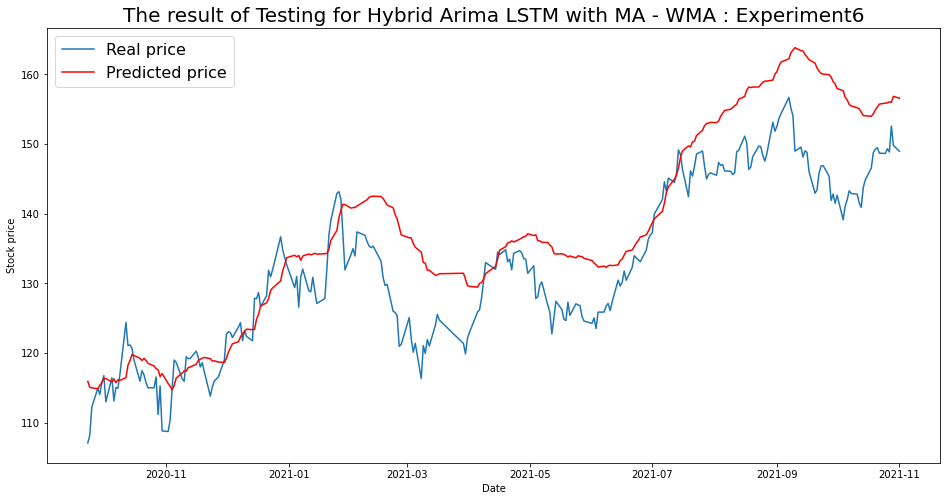

----- Test RMSE for WMA----- 7.6518222681115455
----- Test_MSE_LSTM for WMA----- 58.550384022767716
----- Test_MAE_LSTM for WMA----- 6.1413991074844


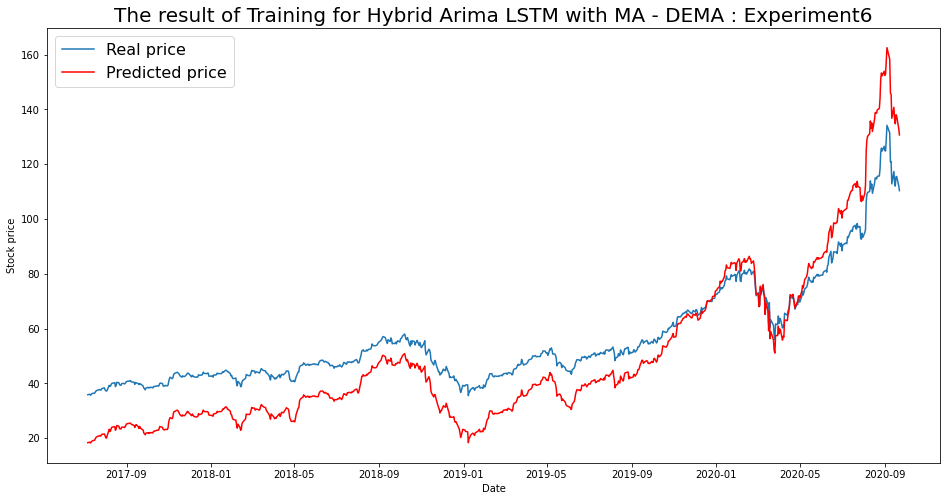

----- Train RMSE for DEMA ----- 12.196853963107756
----- Train_MSE_LSTM for DEMA ----- 148.76324659737736
----- Train MAE LSTM for DEMA ----- 10.958250443400392


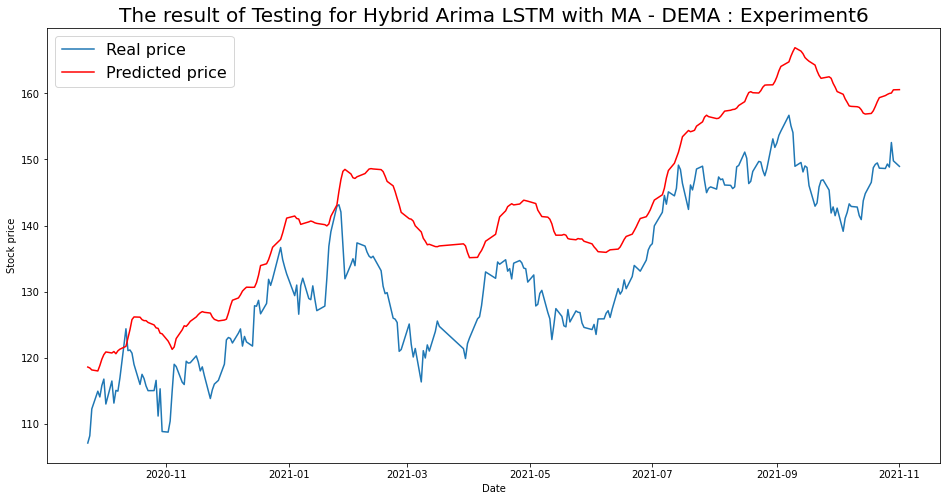

----- Test RMSE for DEMA----- 11.301717142307146
----- Test_MSE_LSTM for DEMA----- 127.72881036471918
----- Test_MAE_LSTM for DEMA----- 10.306940424406019


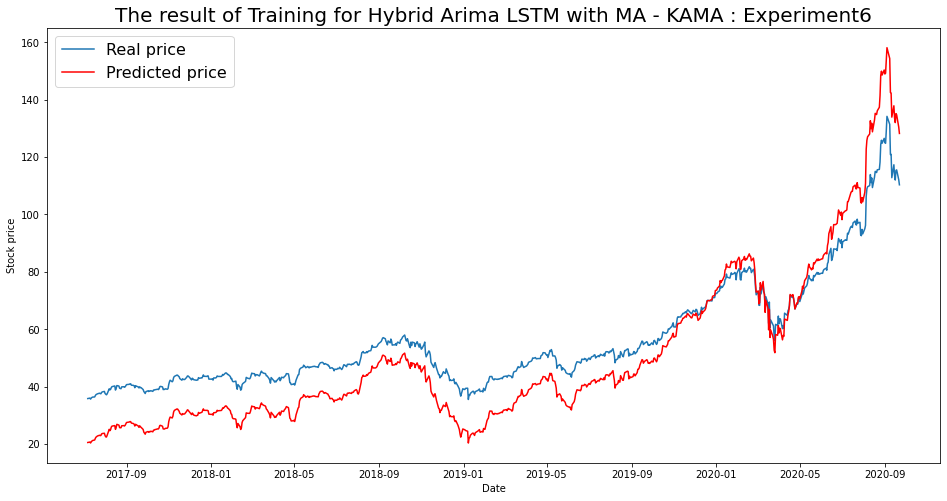

----- Train RMSE for KAMA ----- 10.5711440318656
----- Train_MSE_LSTM for KAMA ----- 111.74908614244768
----- Train MAE LSTM for KAMA ----- 9.510206620484396


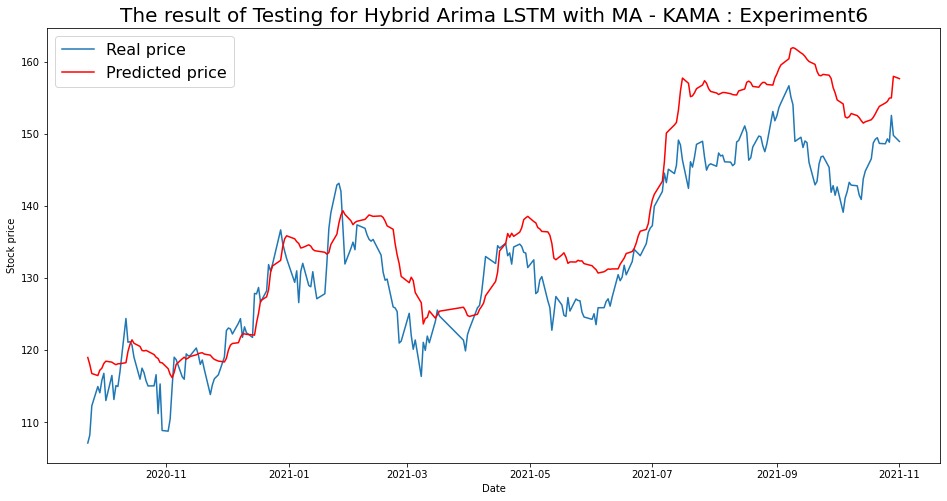

----- Test RMSE for KAMA----- 6.622346161227303
----- Test_MSE_LSTM for KAMA----- 43.855468679122
----- Test_MAE_LSTM for KAMA----- 5.4751276749367985


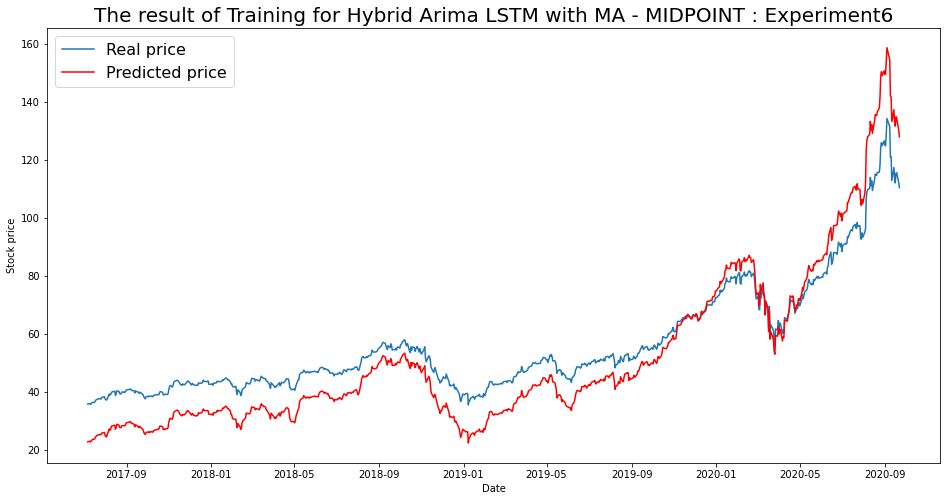

----- Train RMSE for MIDPOINT ----- 9.431256276275592
----- Train_MSE_LSTM for MIDPOINT ----- 88.94859494878776
----- Train MAE LSTM for MIDPOINT ----- 8.385353724073704


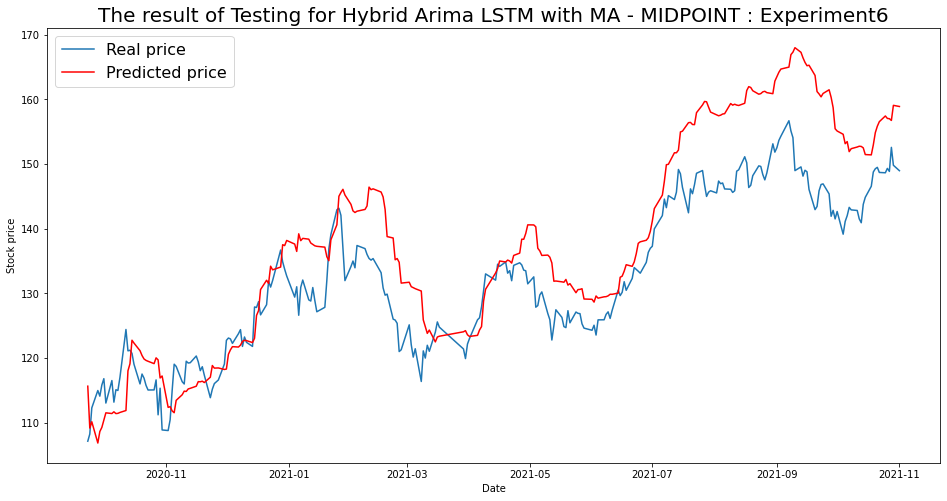

----- Test RMSE for MIDPOINT----- 8.212439536673035
----- Test_MSE_LSTM for MIDPOINT----- 67.44416314351042
----- Test_MAE_LSTM for MIDPOINT----- 6.768235104271493


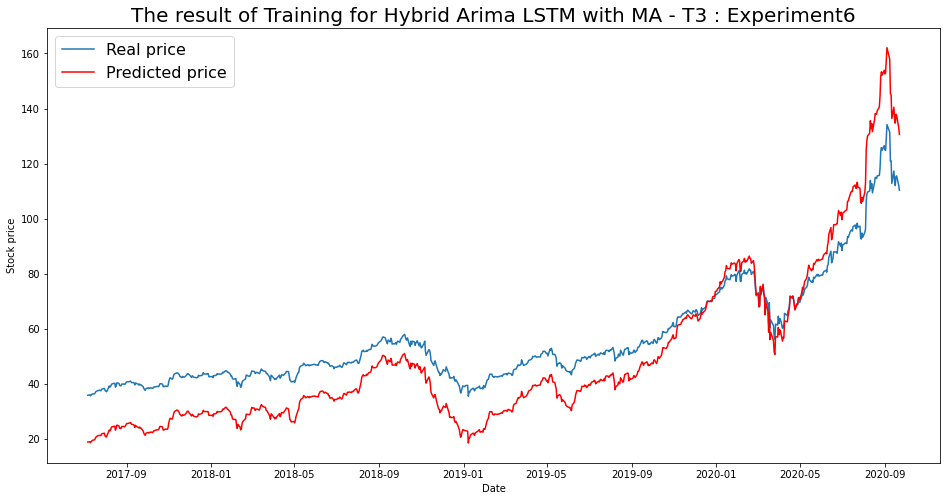

----- Train RMSE for T3 ----- 12.0506886763047
----- Train_MSE_LSTM for T3 ----- 145.21909757321833
----- Train MAE LSTM for T3 ----- 10.839950464284371


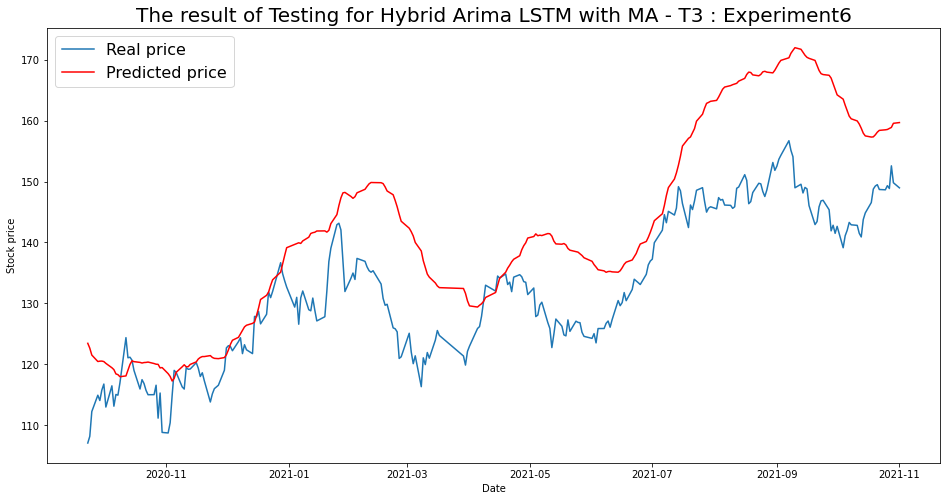

----- Test RMSE for T3----- 12.444836664136135
----- Test_MSE_LSTM for T3----- 154.873959597027
----- Test_MAE_LSTM for T3----- 10.329006454112236


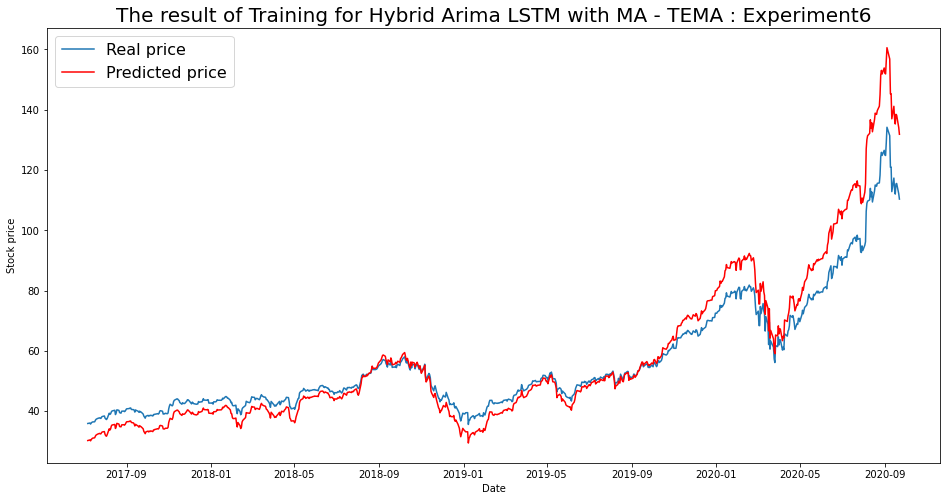

----- Train RMSE for TEMA ----- 7.410516533334238
----- Train_MSE_LSTM for TEMA ----- 54.915755290820094
----- Train MAE LSTM for TEMA ----- 5.083548934505515


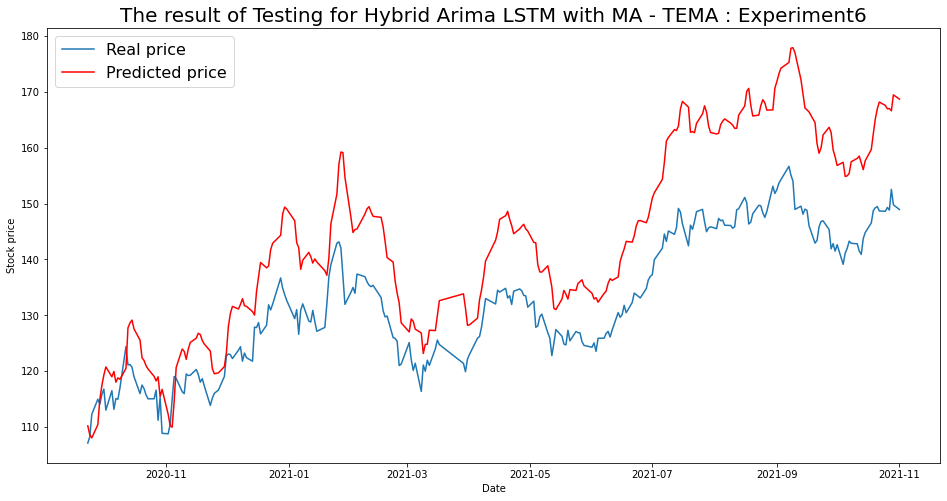

----- Test RMSE for TEMA----- 12.788753454085597
----- Test_MSE_LSTM for TEMA----- 163.5522149093863
----- Test_MAE_LSTM for TEMA----- 11.455728191899736


In [82]:
for i in range(len(list(simulation6.keys()))):
  SIM = list(simulation6.keys())[i]
  plot_train(simulation6,SIM)
  plot_test(simulation6,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 7

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    class Double_Tanh(Activation):
        def __init__(self, activation, **kwargs):
            super(Double_Tanh, self).__init__(activation, **kwargs)
            self.__name__ = 'double_tanh'

    def double_tanh(x):
        return (K.tanh(x) * 2)

    get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
        # Model Generation
    model = Sequential()
    #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    model.add(Dense(1))
    model.add(Activation(double_tanh))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()

    # Option 4
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    # model.add(LSTM(units=int(lstm_len/2)))
    # model.add(Dense(1, activation='sigmoid'))
    # model.compile(loss='mean_squared_error', optimizer='adam')
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15000.708, Time=8.16 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13492.284, Time=2.28 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15827.971, Time=8.01 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13635.197, Time=9.85 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-14132.778, Time=3.78 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15140.312, Time=9.83 sec
 ARIMA(1,3,0)(0,0,0)[0] intercept   : AIC=-13970.469, Time=7.14 sec

Best model:  ARIMA(1,3,0)(0,0,0)[0]          
Total fit time: 49.071 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               S

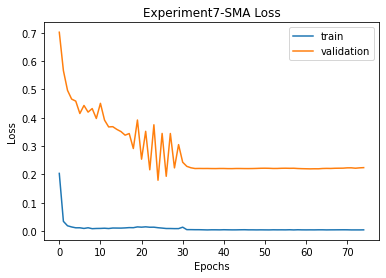


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 37.148636819682245 
RMSE:	 6.094968155756209 
MAPE:	 5.090179331518223
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.775, Time=2.31 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14574.593, Time=3.91 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16801.081, Time=8.99 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14572.593, Time=5.31 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-14532.068, Time=7.29 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15610.472, Time=12.83 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16103.302, Time=13.06 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17030.021, Time=4.15 sec
 ARIMA(3,3,0)(0,0,0)[

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17003.984, Time=3.00 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16998.666, Time=3.68 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 91.197 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.720
Date:                Sun, 12 Dec 2021   AIC                         -17087.441
Time:                        15:06:04   BIC                         -16965.479
Sample:                             0   HQIC                        -17040.602
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

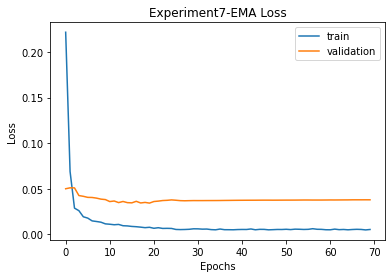


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 37.148636819682245 
RMSE:	 6.094968155756209 
MAPE:	 5.090179331518223

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 31.582654654902484 
RMSE:	 5.619844718041815 
MAPE:	 4.507182634072088
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-14480.432, Time=9.44 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-15747.905, Time=6.44 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15116.389, Time=7.16 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13532.115, Time=7.81 sec
 ARIMA(0,3,0)(0,0,0)[0] intercept   : AIC=-13619.624, Time=5.40 sec

Best model:  ARIMA(0,3,0)(0,0,0)[0]          
Total fit time: 36.27

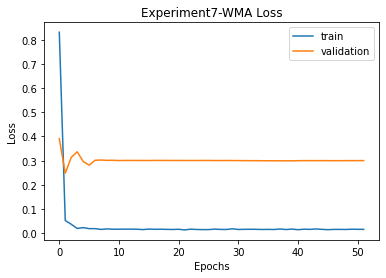


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 37.148636819682245 
RMSE:	 6.094968155756209 
MAPE:	 5.090179331518223

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 31.582654654902484 
RMSE:	 5.619844718041815 
MAPE:	 4.507182634072088

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 65.00101872981564 
RMSE:	 8.062320926992156 
MAPE:	 6.705711592581163
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.774, Time=2.05 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14574.593, Time=4.01 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15590.302, Time=7.02 sec
 ARIMA(0,3,1)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17003.985, Time=3.33 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16998.665, Time=3.36 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 78.451 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.721
Date:                Sun, 12 Dec 2021   AIC                         -17087.441
Time:                        15:16:00   BIC                         -16965.479
Sample:                             0   HQIC                        -17040.603
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

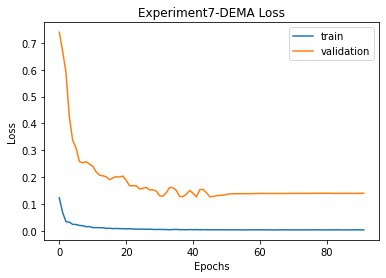


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 37.148636819682245 
RMSE:	 6.094968155756209 
MAPE:	 5.090179331518223

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 31.582654654902484 
RMSE:	 5.619844718041815 
MAPE:	 4.507182634072088

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 65.00101872981564 
RMSE:	 8.062320926992156 
MAPE:	 6.705711592581163

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 35.269002386685244 
RMSE:	 5.938771117553298 
MAPE:	 4.62878838931535
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.902, Time=2.34 sec
 ARIMA

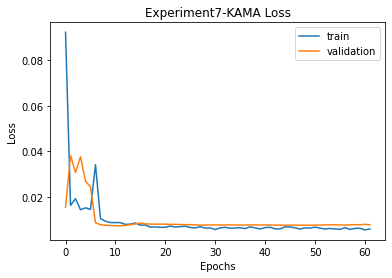


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 37.148636819682245 
RMSE:	 6.094968155756209 
MAPE:	 5.090179331518223

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 31.582654654902484 
RMSE:	 5.619844718041815 
MAPE:	 4.507182634072088

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 65.00101872981564 
RMSE:	 8.062320926992156 
MAPE:	 6.705711592581163

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 35.269002386685244 
RMSE:	 5.938771117553298 
MAPE:	 4.62878838931535

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 62.25156682504816 
RMSE:	 7.8899662119078915 
MAPE:	 6.222956717810362
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on MI

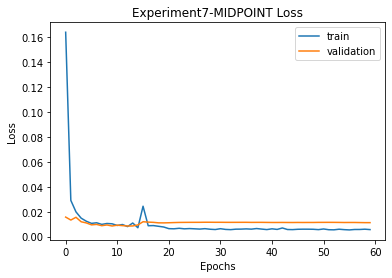


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 37.148636819682245 
RMSE:	 6.094968155756209 
MAPE:	 5.090179331518223

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 31.582654654902484 
RMSE:	 5.619844718041815 
MAPE:	 4.507182634072088

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 65.00101872981564 
RMSE:	 8.062320926992156 
MAPE:	 6.705711592581163

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 35.269002386685244 
RMSE:	 5.938771117553298 
MAPE:	 4.62878838931535

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 62.25156682504816 
RMSE:	 7.8899662119078915 
MAPE:	 6.222956717810362

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	42.54% Accuracy
MSE:	 84.47531990876952 
RMSE:	 9.191045637399997 
MAPE:	 7.890202393641488
T3
T3([input_arrays], [ti

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16318.604, Time=3.52 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16567.270, Time=2.23 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 55.672 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8308.635
Date:                Sun, 12 Dec 2021   AIC                         -16569.270
Time:                        15:36:26   BIC                         -16456.690
Sample:                             0   HQIC                        -16526.035
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

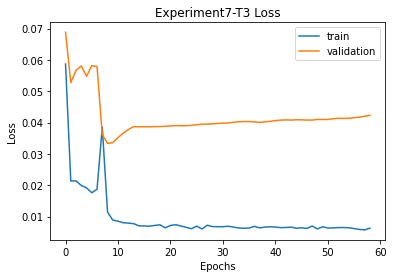


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 37.148636819682245 
RMSE:	 6.094968155756209 
MAPE:	 5.090179331518223

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 31.582654654902484 
RMSE:	 5.619844718041815 
MAPE:	 4.507182634072088

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 65.00101872981564 
RMSE:	 8.062320926992156 
MAPE:	 6.705711592581163

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 35.269002386685244 
RMSE:	 5.938771117553298 
MAPE:	 4.62878838931535

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 62.25156682504816 
RMSE:	 7.8899662119078915 
MAPE:	 6.222956717810362

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	42.54% Accuracy
MSE:	 84.47531990876952 
RMSE:	 9.191045637399997 
MAPE:	 7.890202393641488

T3
Prediction vs Close:	

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16200.149, Time=3.30 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16461.809, Time=15.38 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=-16384.147, Time=3.00 sec
 ARIMA(3,3,2)(0,0,0)[0]             : AIC=inf, Time=10.18 sec
 ARIMA(2,3,1)(0,0,0)[0] intercept   : AIC=-15110.164, Time=5.74 sec

Best model:  ARIMA(2,3,1)(0,0,0)[0]          
Total fit time: 85.805 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(2, 3, 1)   Log Likelihood                8294.227
Date:                Sun, 12 Dec 2021   AIC                         -16538.454
Time:                        15:40:52   BIC                         -16421.183
Sample:                             0   HQIC                        -16493.417
                                - 808                                         
Covariance Type:                  

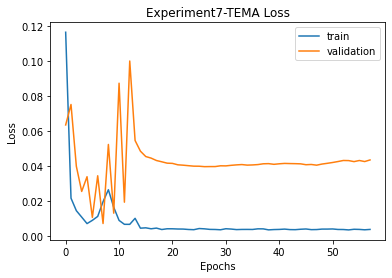


SMA
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 37.148636819682245 
RMSE:	 6.094968155756209 
MAPE:	 5.090179331518223

EMA
Prediction vs Close:		55.22% Accuracy
Prediction vs Prediction:	47.39% Accuracy
MSE:	 31.582654654902484 
RMSE:	 5.619844718041815 
MAPE:	 4.507182634072088

WMA
Prediction vs Close:		52.99% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 65.00101872981564 
RMSE:	 8.062320926992156 
MAPE:	 6.705711592581163

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.52% Accuracy
MSE:	 35.269002386685244 
RMSE:	 5.938771117553298 
MAPE:	 4.62878838931535

KAMA
Prediction vs Close:		54.1% Accuracy
Prediction vs Prediction:	48.88% Accuracy
MSE:	 62.25156682504816 
RMSE:	 7.8899662119078915 
MAPE:	 6.222956717810362

MIDPOINT
Prediction vs Close:		51.12% Accuracy
Prediction vs Prediction:	42.54% Accuracy
MSE:	 84.47531990876952 
RMSE:	 9.191045637399997 
MAPE:	 7.890202393641488

T3
Prediction vs Close:	

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation7 = {}
    imgfile = 'Experiment7'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation7[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation7_data.json', 'w') as fp:
                    json.dump(simulation7, fp)

                for ma in simulation7.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation7[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation7[ma]['final']['mse'],
                          '\nRMSE:\t', simulation7[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation7[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

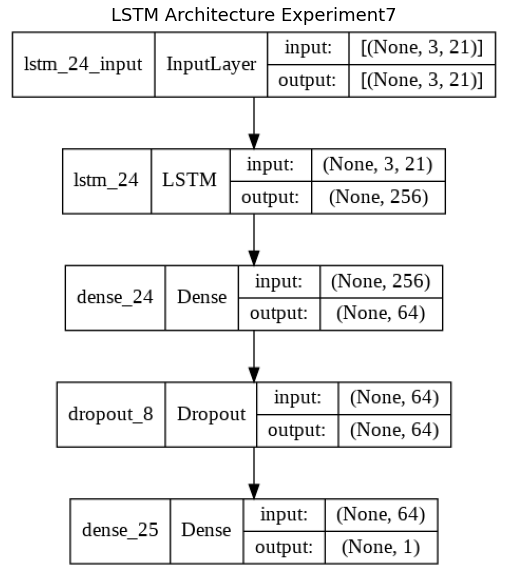

In [ ]:
img = cv2.imread('Experiment5.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [83]:
with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)
fileimg = 'Experiment7'

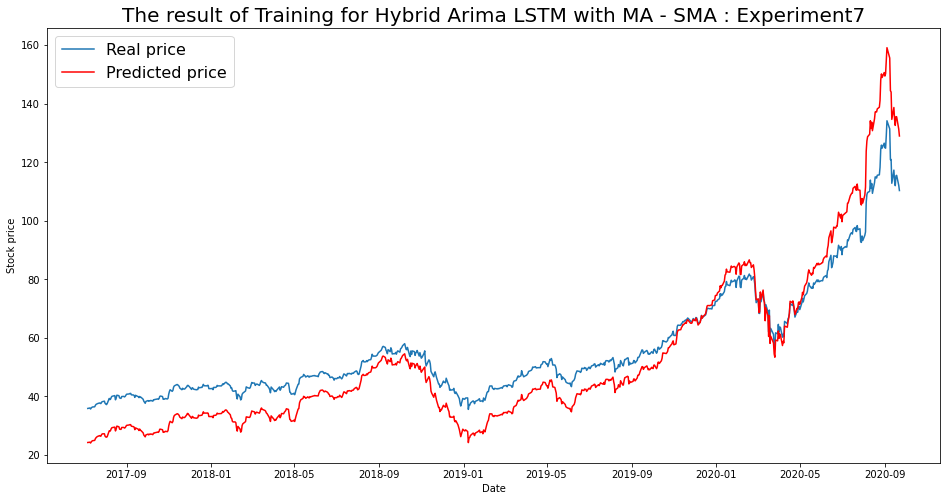

----- Train RMSE for SMA ----- 8.955057105534777
----- Train_MSE_LSTM for SMA ----- 80.19304776338892
----- Train MAE LSTM for SMA ----- 7.794913717002681


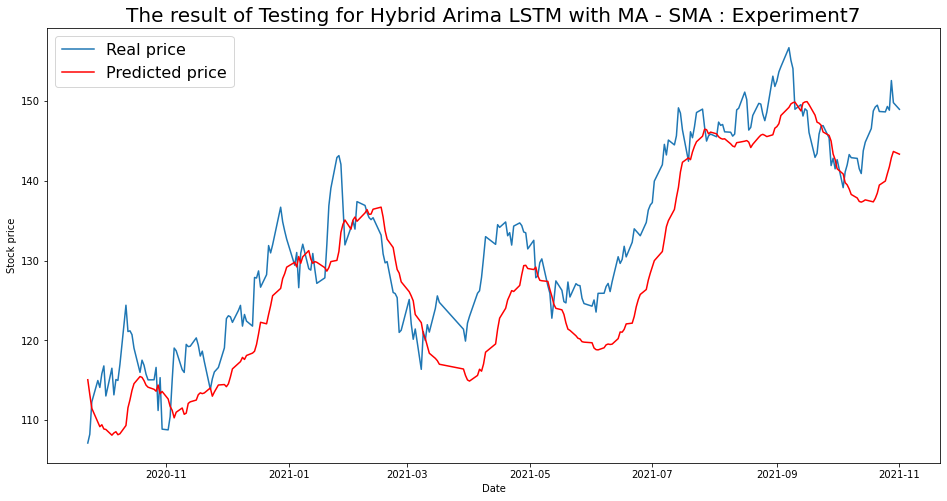

----- Test RMSE for SMA----- 6.094968155756209
----- Test_MSE_LSTM for SMA----- 37.148636819682245
----- Test_MAE_LSTM for SMA----- 5.090179331518223


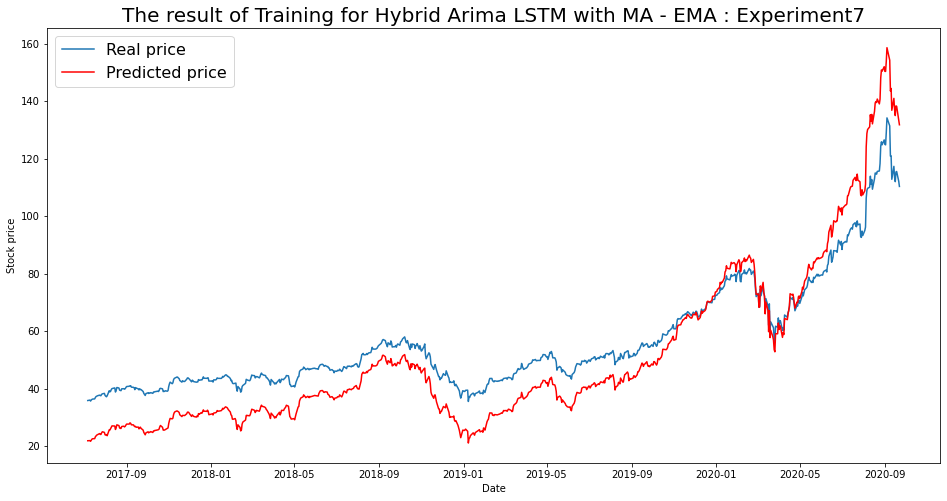

----- Train RMSE for EMA ----- 10.61356917187827
----- Train_MSE_LSTM for EMA ----- 112.6478505662448
----- Train MAE LSTM for EMA ----- 9.447697131450768


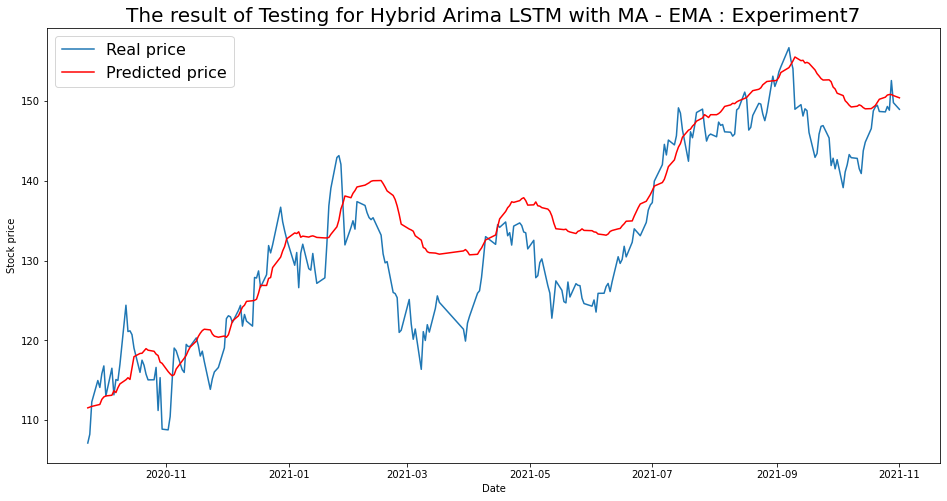

----- Test RMSE for EMA----- 5.619844718041815
----- Test_MSE_LSTM for EMA----- 31.582654654902484
----- Test_MAE_LSTM for EMA----- 4.507182634072088


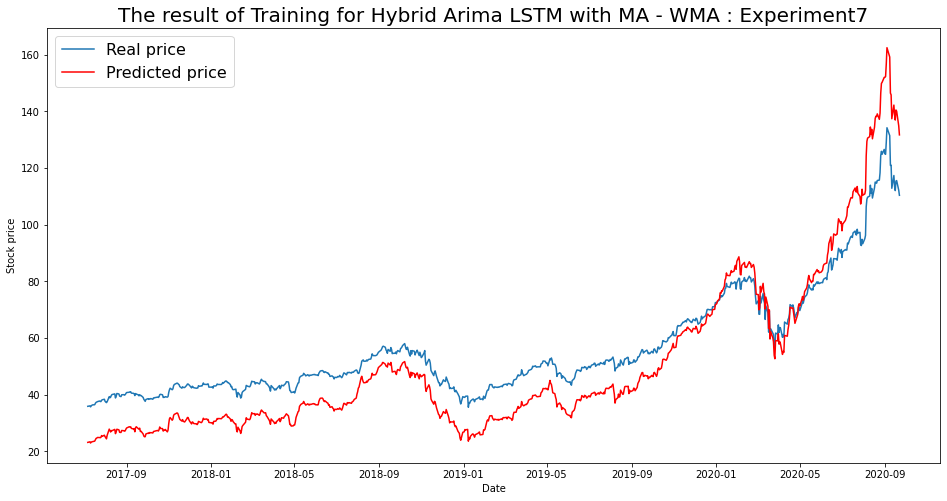

----- Train RMSE for WMA ----- 10.751551158526922
----- Train_MSE_LSTM for WMA ----- 115.59585231442159
----- Train MAE LSTM for WMA ----- 9.750787083557483


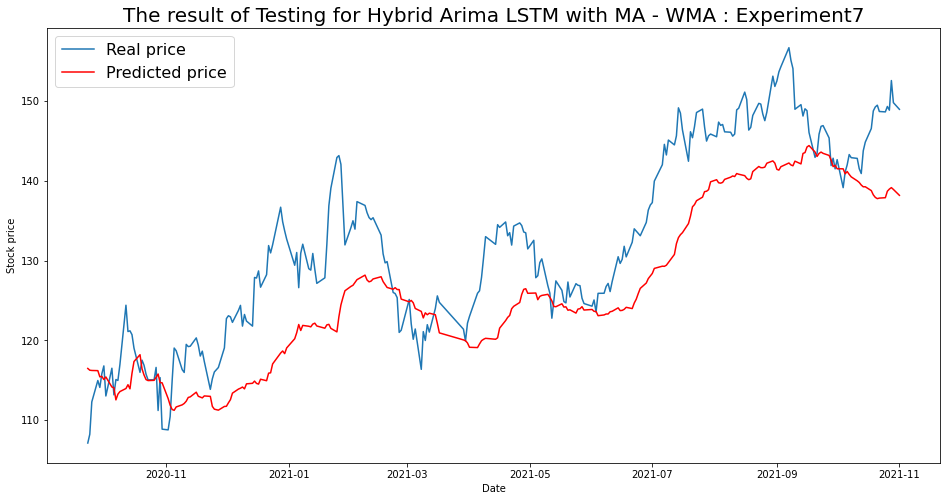

----- Test RMSE for WMA----- 8.062320926992156
----- Test_MSE_LSTM for WMA----- 65.00101872981564
----- Test_MAE_LSTM for WMA----- 6.705711592581163


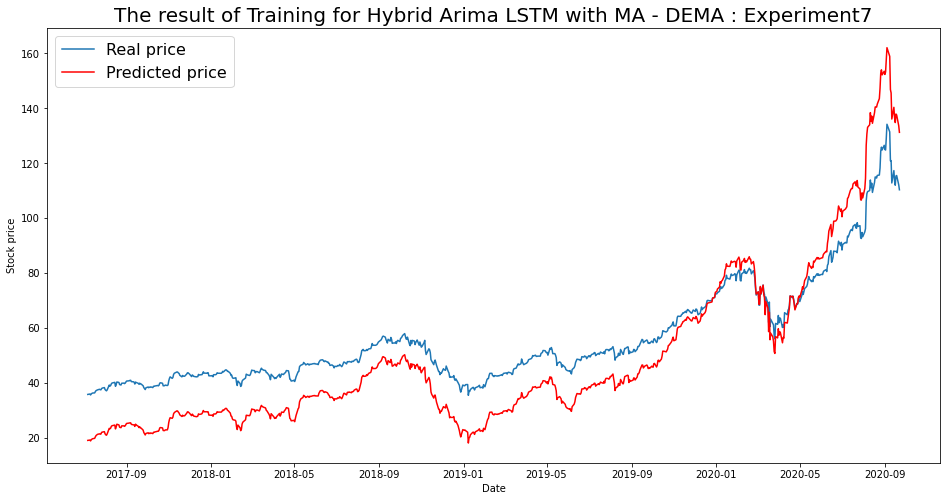

----- Train RMSE for DEMA ----- 12.583936483896219
----- Train_MSE_LSTM for DEMA ----- 158.3554574307343
----- Train MAE LSTM for DEMA ----- 11.414769962937156


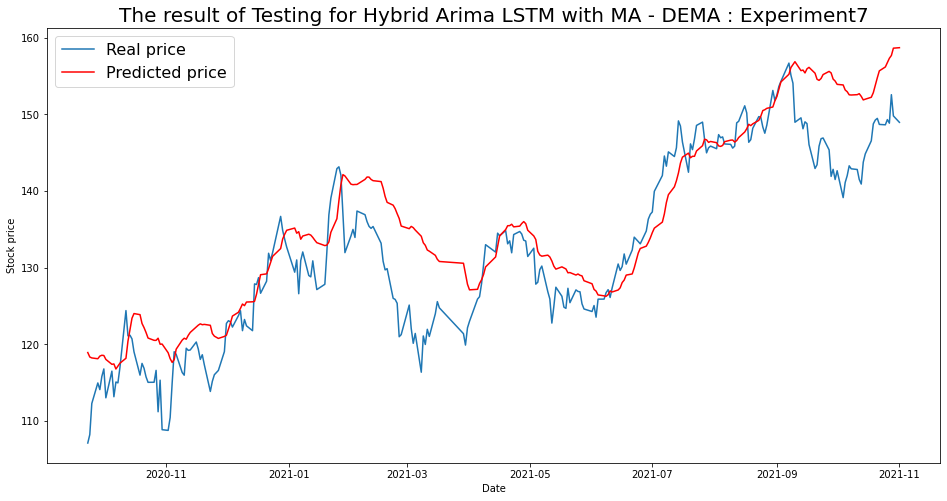

----- Test RMSE for DEMA----- 5.938771117553298
----- Test_MSE_LSTM for DEMA----- 35.269002386685244
----- Test_MAE_LSTM for DEMA----- 4.62878838931535


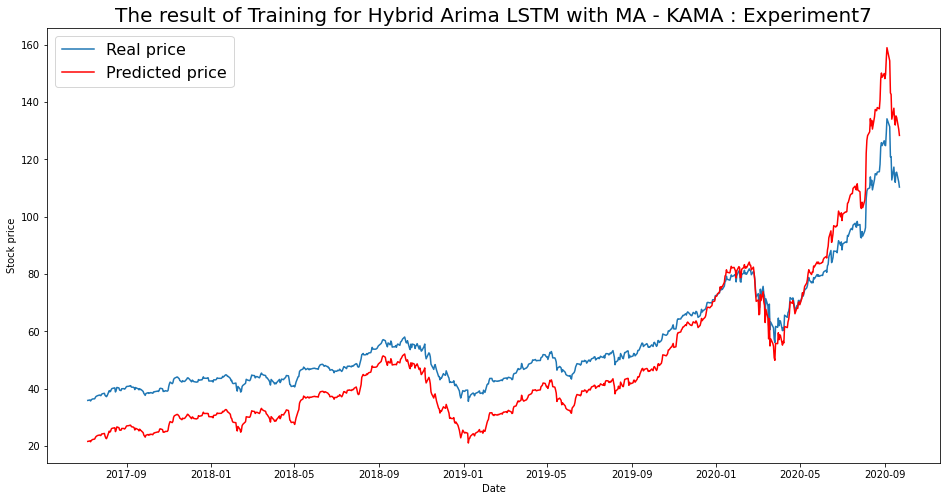

----- Train RMSE for KAMA ----- 10.911962583126925
----- Train_MSE_LSTM for KAMA ----- 119.07092741556205
----- Train MAE LSTM for KAMA ----- 9.89734832853964


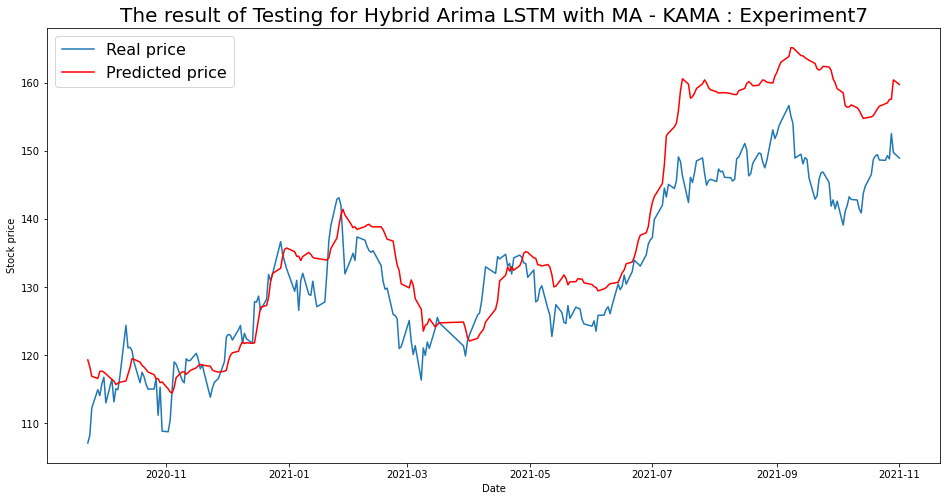

----- Test RMSE for KAMA----- 7.8899662119078915
----- Test_MSE_LSTM for KAMA----- 62.25156682504816
----- Test_MAE_LSTM for KAMA----- 6.222956717810362


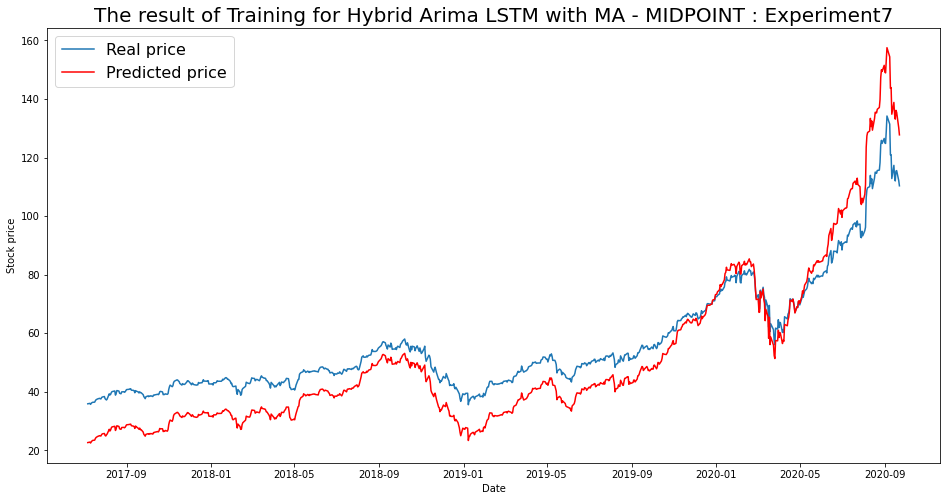

----- Train RMSE for MIDPOINT ----- 9.704593247771532
----- Train_MSE_LSTM for MIDPOINT ----- 94.17913010469283
----- Train MAE LSTM for MIDPOINT ----- 8.665870629654135


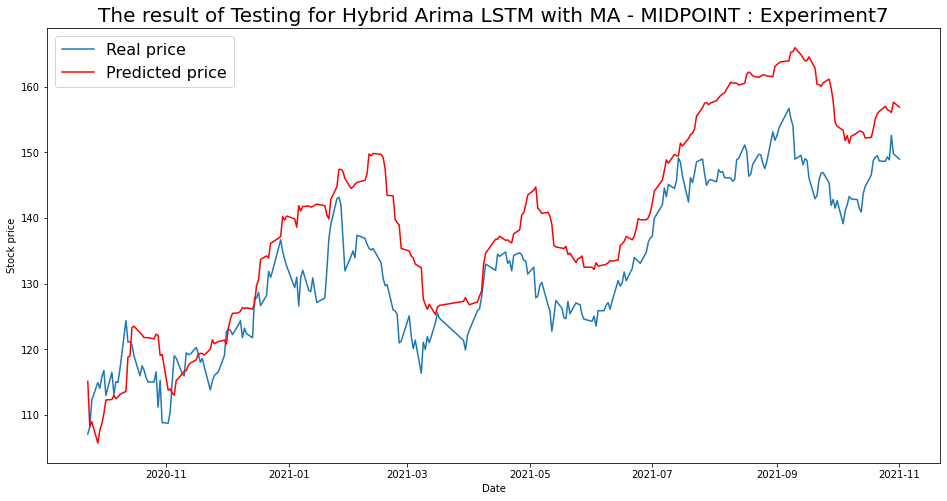

----- Test RMSE for MIDPOINT----- 9.191045637399997
----- Test_MSE_LSTM for MIDPOINT----- 84.47531990876952
----- Test_MAE_LSTM for MIDPOINT----- 7.890202393641488


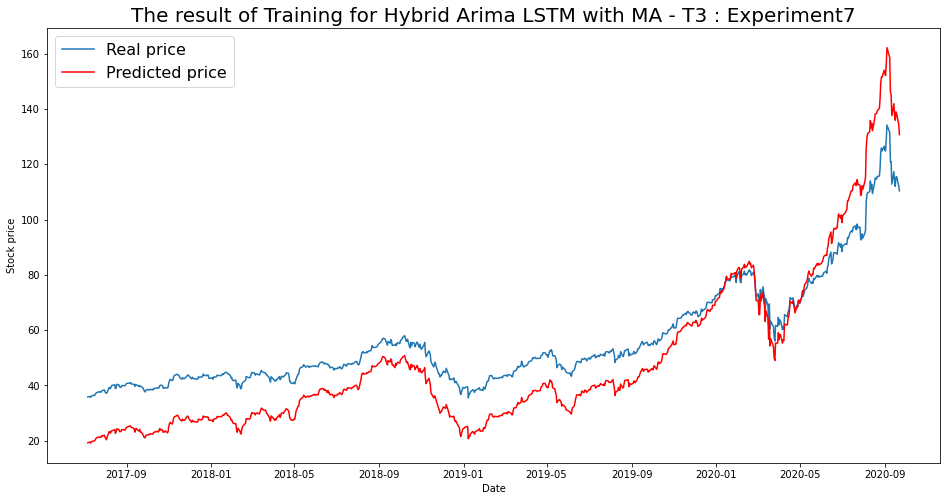

----- Train RMSE for T3 ----- 12.326458508446358
----- Train_MSE_LSTM for T3 ----- 151.94157936044962
----- Train MAE LSTM for T3 ----- 11.126900240195694


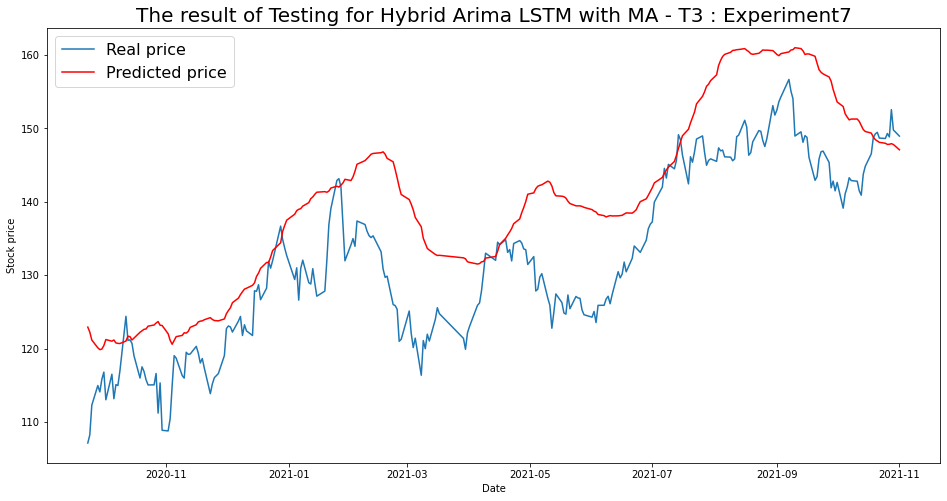

----- Test RMSE for T3----- 9.623258025780078
----- Test_MSE_LSTM for T3----- 92.6070950307407
----- Test_MAE_LSTM for T3----- 8.212466968891306


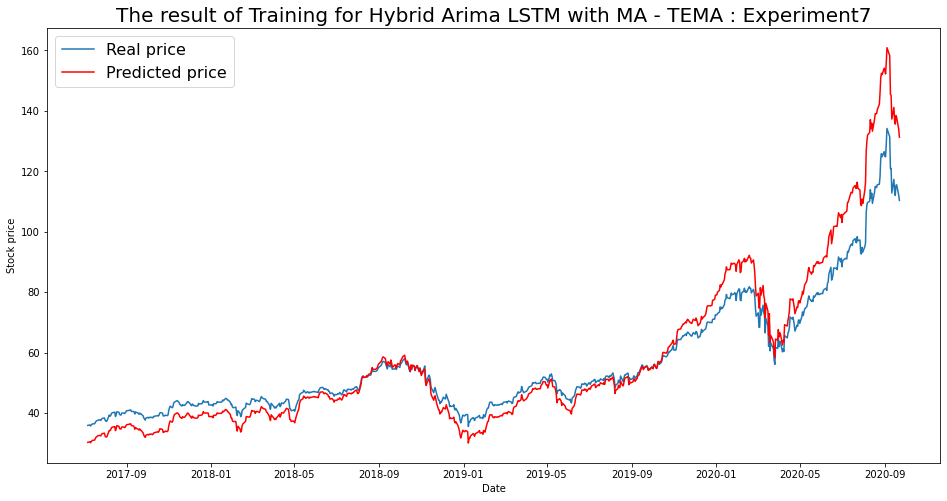

----- Train RMSE for TEMA ----- 7.3831693218457195
----- Train_MSE_LSTM for TEMA ----- 54.51118923504378
----- Train MAE LSTM for TEMA ----- 5.0852937426664155


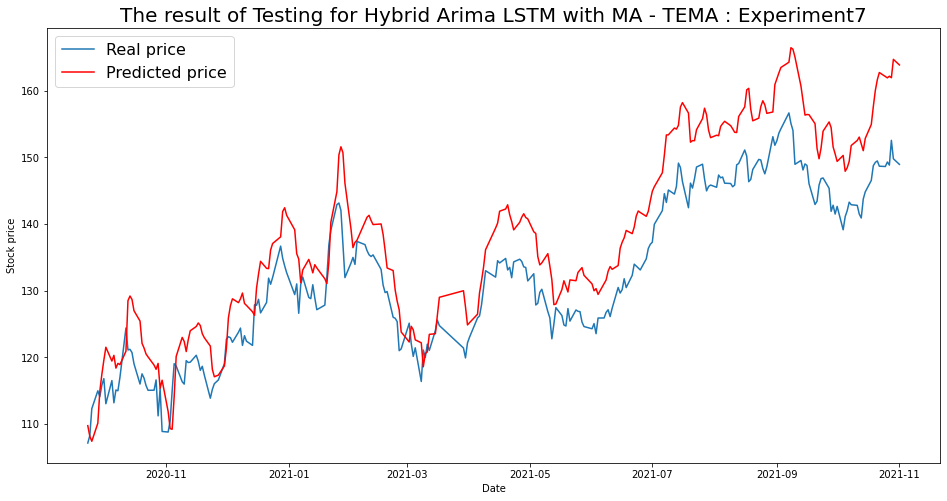

----- Test RMSE for TEMA----- 7.087285014740061
----- Test_MSE_LSTM for TEMA----- 50.229608880159034
----- Test_MAE_LSTM for TEMA----- 6.2877236827531835


In [84]:
for i in range(len(list(simulation7.keys()))):
  SIM = list(simulation7.keys())[i]
  plot_train(simulation7,SIM)
  plot_test(simulation7,SIM)

## Arima w Exogenous Variable Multistep MutiVariate LSTM Hybrid Model Experiment 8

In [ ]:
def get_arima_exog(dataframe,original_data, train_len, test_len):    
    

    # prepare train and test data for exogenous vr
    X_value = pd.DataFrame(low_vol.iloc[:, :])
    y_value = pd.DataFrame(low_vol.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    X_scale_dataset = X_scaler.fit_transform(X_value)
    y_scale_dataset = y_scaler.fit_transform(y_value)
    # Get data and check shape
    # X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X_scale_dataset)
    y_train, y_test, = split_train_test(y_scale_dataset)
    yc_train,yc_test = split_train_test(low_vol_data)
    yc = yc_test.values.tolist()
    y_train_list = y_train.flatten().tolist()
    y_test_list = y_test.flatten().tolist()
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)

    # Initialize model
    model = auto_arima(y_train_list,exogenous  = X_train,trace=True, error_action='ignore', start_p=1,start_q=1,max_p=3,max_q=3,d=3,
            suppress_warnings=True,stepwise=True,seasonal=True)

      # Determine model parameters
    print(model.summary())
    model.fit(y_train_list,maxiter=200)
    order = model.get_params()['order']
    print('ARIMA order:', order, '\n')

      # Genereate predictions
    prediction = []
    for i in range(len(y_test_list)):
        model = pmdarima.ARIMA(order=order)
        model.fit(y_train_list)
        # print('working on', i+1, 'of', len(y_test), '-- ' + str(int(100 * (i + 1) / len(y_test))) + '% complete')

        prediction.append(model.predict()[0])
        y_train_list.append(y_test_list[i])

    predictionte = y_scaler.inverse_transform(np.array(prediction).reshape(-1,1))
    y_test_ = y_scaler.inverse_transform(np.array(y_test_list).reshape(-1,1))

    # Generate error data
    mse = mean_squared_error(yc_test, predictionte)
    rmse = mse ** 0.5
    mae = mean_absolute_error(y_test_ , predictionte )
    return yc,predictionte.flatten().tolist(), mse, rmse, mae

In [ ]:
def get_lstm(data,original_data, train_len, test_len,img_file,ma ,lstm_len=3):
    # prepare train and test data
    X_value = pd.DataFrame(data.iloc[:, :])
    y_value = pd.DataFrame(data.iloc[:, 3])
    X_scaler = MinMaxScaler(feature_range=(-1, 1))
    y_scaler = MinMaxScaler(feature_range=(-1, 1))
    X_scaler.fit(X_value)
    y_scaler.fit(y_value)
    # Get data and check shape
    X, y, yc = get_X_y(X_scale_dataset, y_scale_dataset)#X will be of shape 224 X 3 X 21 (each 3 X 21 array will be 3 days' worth of data). yc will have the corresponding closing price value
    # pdb.set_trace()
    X_train, X_test, = split_train_test(X)
    y_train, y_test, = split_train_test(y)
    # yc_train, yc_test, = split_train_test(original_data)
    index_train, index_test, = predict_index(dataset_final, X_train, n_steps_in, n_steps_out)
    det =20
    input_dim = X_train.shape[1]#3
    feature_size = X_train.shape[2]#24
    output_dim = y_train.shape[1]#1



    # Option 1
    # Set up & fit LSTM RNN
    # model = Sequential()
    # model.add(LSTM(256, activation='relu', kernel_initializer='he_normal', input_shape=(input_dim, feature_size)))
    # model.add(Dense(units=64,activation='relu'))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(learning_rate = 0.001), loss='mse')

    # ## Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM1.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma_' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()


    # # # option 2
    # model = Sequential()
    # model.add(Bidirectional(LSTM(units= 128), input_shape=(input_dim, feature_size)))
    # model.add(Dense(64))
    # model.add(Dense(units=output_dim))
    # model.compile(optimizer=Adam(lr = 0.001), loss='mean_squared_error', metrics=['accuracy'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # Option 3
    # define custom activation
    # 
    # class Double_Tanh(Activation):
    #     def __init__(self, activation, **kwargs):
    #         super(Double_Tanh, self).__init__(activation, **kwargs)
    #         self.__name__ = 'double_tanh'

    # def double_tanh(x):
    #     return (K.tanh(x) * 2)

    # get_custom_objects().update({'double_tanh':Double_Tanh(double_tanh)})
    #     # Model Generation
    # model = Sequential()
    # #check https://machinelearningmastery.com/use-weight-regularization-lstm-networks-time-series-forecasting/
    # model.add(LSTM(25, input_shape=(input_dim, feature_size), dropout=0.2, kernel_regularizer=l1_l2(0.00,0.00), bias_regularizer=l1_l2(0.00,0.00)))
    # model.add(Dense(1))
    # model.add(Activation(double_tanh))
    # model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse', 'mae'])
    # # Common code
    # callbacks = [
    # EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    # ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    # ModelCheckpoint('LSTM7.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    # fname1 = img_file+'.png'
    # tensorflow.keras.utils.plot_model(
    #     model, to_file=fname1, show_shapes=True, show_dtype=False,
    #     show_layer_names=True, expand_nested=False, dpi=96,
    #     layer_range=None, show_layer_activations=False
    # )
    # history = model.fit(X_train, y_train, epochs=500, batch_size=1, verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # # plot loss
    # fname2 = img_file+'-'+ma
    # plt.title(img_file+'-'+ma+' Loss')
    # plt.xlabel("Epochs")
    # plt.ylabel("Loss")
    # pyplot.plot(history.history['loss'], label='train')
    # pyplot.plot(history.history['val_loss'], label='validation')
    # pyplot.legend()
    # pyplot.savefig(fname2+'.png',dpi='figure')
    # pyplot.show()

    # #Option 4
    # # Set up & fit LSTM RNN
    model = Sequential()
    model.add(LSTM(units=lstm_len, return_sequences=True, input_shape=(input_dim, feature_size)))
    model.add(LSTM(units=int(lstm_len/2)))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # Common code
    callbacks = [
    EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('LSTM8.h5', verbose=1, save_best_only=True, save_weights_only=True)]
    fname1 = img_file+'.png'
    tensorflow.keras.utils.plot_model(
        model, to_file=fname1, show_shapes=True, show_dtype=False,
        show_layer_names=True, expand_nested=False, dpi=96,
        layer_range=None, show_layer_activations=False
    )
    history = model.fit(X_train, y_train, epochs=500, batch_size=int( optimized_period[ma]), verbose=2, callbacks=callbacks, validation_data=(X_test, y_test),shuffle=False)
    # plot loss
    fname2 = img_file+'-'+ma
    plt.title(img_file+'-'+ma+' Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    pyplot.plot(history.history['loss'], label='train')
    pyplot.plot(history.history['val_loss'], label='validation')
    pyplot.legend()
    pyplot.savefig(fname2+'.png',dpi='figure')
    pyplot.show()



    # Generate predictions
    predictiontr = model.predict(X_train, verbose=0)
    predictiontr = y_scaler.inverse_transform(predictiontr).tolist()
    outputtr = []
    for i in range(len(predictiontr)):
        outputtr.extend(predictiontr[i])
    predictiontr = outputtr
    # Generate error data

    ## replace with yc , xtest generated by new multistep method
    mse_tr = mean_squared_error(y_train, predictiontr)
    rmse_tr = mse_tr ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictiontr))
    mae_tr = mean_absolute_error(y_train, pd.Series(predictiontr))
    # Original_tr = pd.Series(yc_train)
    Original_tr = y_scaler.inverse_transform(y_train).flatten().tolist()


    predictionte = model.predict(X_test, verbose=0)
    predictionte = (y_scaler.inverse_transform(predictionte)-det).tolist()
    outputte = []
    for i in range(len(predictionte)):
        outputte.extend(predictionte[i])
    predictionte = outputte
    # Generate error data

    mse_te = mean_squared_error(y_test, predictionte)
    rmse_te = mse_te ** 0.5
    # mape = mean_absolute_percentage_error(X_test, pd.Series(predictionte))
    mae_te = mean_absolute_error(y_test, pd.Series(predictionte))
    # Original_te = pd.Series(yc_test)
    Original_te = y_scaler.inverse_transform(y_test).flatten().tolist()

    return Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,Original_te,predictionte, mse_te,rmse_te,mae_te

SMA
SMA([input_arrays], [timeperiod=30])

Simple Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
17

Working on SMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15000.708, Time=9.21 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13492.284, Time=2.24 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15827.971, Time=8.03 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13635.197, Time=10.27 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-14132.778, Time=3.58 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-15140.312, Time=9.97 sec
 ARIMA(1,3,0)(0,0,0)[0] intercept   : AIC=-13970.469, Time=7.12 sec

Best model:  ARIMA(1,3,0)(0,0,0)[0]          
Total fit time: 50.431 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               

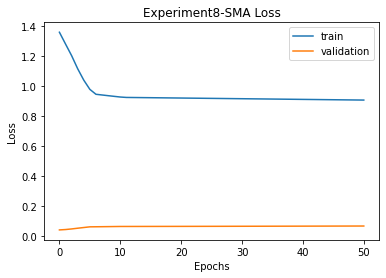


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 27.593274833467863 
RMSE:	 5.252930118844897 
MAPE:	 4.117405060238624
EMA
EMA([input_arrays], [timeperiod=30])

Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
51

Working on EMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.775, Time=2.28 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14574.593, Time=3.86 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-16801.081, Time=8.74 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-14572.593, Time=5.08 sec
 ARIMA(2,3,1)(0,0,0)[0]             : AIC=-14532.068, Time=7.00 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-15610.472, Time=11.60 sec
 ARIMA(0,3,2)(0,0,0)[0]             : AIC=-16103.302, Time=12.94 sec
 ARIMA(2,3,0)(0,0,0)[0]             : AIC=-17030.021, Time=4.12 sec
 ARIMA(3,3,0)(0,0,0)[

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17003.984, Time=3.03 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16998.666, Time=3.23 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 87.797 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.720
Date:                Sun, 12 Dec 2021   AIC                         -17087.441
Time:                        15:55:29   BIC                         -16965.479
Sample:                             0   HQIC                        -17040.602
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

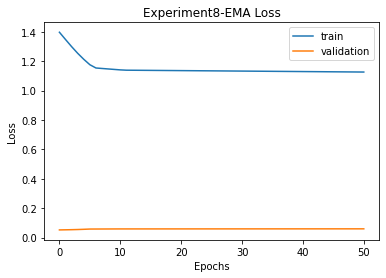


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 27.593274833467863 
RMSE:	 5.252930118844897 
MAPE:	 4.117405060238624

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 36.00024912834101 
RMSE:	 6.000020760659167 
MAPE:	 4.70426166066095
WMA
WMA([input_arrays], [timeperiod=30])

Weighted Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
49

Working on WMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-14480.432, Time=9.06 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-15747.905, Time=6.31 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15116.389, Time=6.99 sec
 ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13532.115, Time=7.99 sec
 ARIMA(0,3,0)(0,0,0)[0] intercept   : AIC=-13619.624, Time=5.40 sec

Best model:  ARIMA(0,3,0)(0,0,0)[0]          
Total fit time: 35.768 

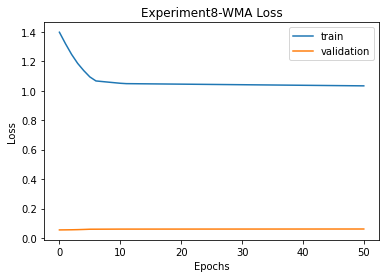


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 27.593274833467863 
RMSE:	 5.252930118844897 
MAPE:	 4.117405060238624

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 36.00024912834101 
RMSE:	 6.000020760659167 
MAPE:	 4.70426166066095

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 41.43257052147296 
RMSE:	 6.4368136932393005 
MAPE:	 5.073793611210466
DEMA
DEMA([input_arrays], [timeperiod=30])

Double Exponential Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
89

Working on DEMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.774, Time=2.25 sec
 ARIMA(0,3,0)(0,0,0)[0]             : AIC=-14574.593, Time=3.92 sec
 ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15590.302, Time=6.94 sec
 ARIMA(0,3,1)(0,0,0)[0]        

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-17003.985, Time=3.09 sec
 ARIMA(3,3,1)(0,0,0)[0] intercept   : AIC=-16998.665, Time=3.57 sec

Best model:  ARIMA(3,3,1)(0,0,0)[0]          
Total fit time: 77.793 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(3, 3, 1)   Log Likelihood                8569.721
Date:                Sun, 12 Dec 2021   AIC                         -17087.441
Time:                        16:05:33   BIC                         -16965.479
Sample:                             0   HQIC                        -17040.603
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

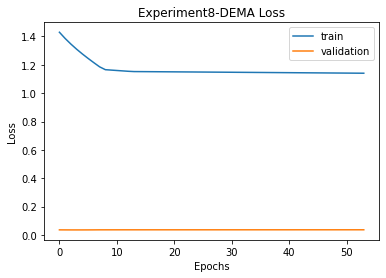


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 27.593274833467863 
RMSE:	 5.252930118844897 
MAPE:	 4.117405060238624

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 36.00024912834101 
RMSE:	 6.000020760659167 
MAPE:	 4.70426166066095

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 41.43257052147296 
RMSE:	 6.4368136932393005 
MAPE:	 5.073793611210466

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 181.24518187853474 
RMSE:	 13.462733076108087 
MAPE:	 12.35792879577932
KAMA
KAMA([input_arrays], [timeperiod=30])

Kaufman Adaptive Moving Average (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 30
Outputs:
    real
18

Working on KAMA predictions
parameters used :  808 269
Performing stepwise search to minimize aic
 ARIMA(1,3,1)(0,0,0)[0]             : AIC=-17005.902, Time=2.11 sec
 ARIM

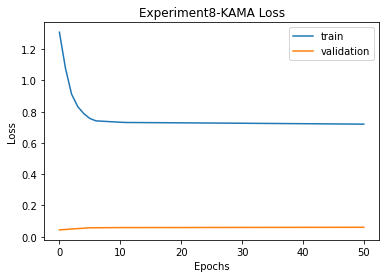


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 27.593274833467863 
RMSE:	 5.252930118844897 
MAPE:	 4.117405060238624

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 36.00024912834101 
RMSE:	 6.000020760659167 
MAPE:	 4.70426166066095

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 41.43257052147296 
RMSE:	 6.4368136932393005 
MAPE:	 5.073793611210466

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 181.24518187853474 
RMSE:	 13.462733076108087 
MAPE:	 12.35792879577932

KAMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 27.433326731723586 
RMSE:	 5.237683336335214 
MAPE:	 4.154161853007022
MIDPOINT
MIDPOINT([input_arrays], [timeperiod=14])

MidPoint over period (Overlap Studies)

Inputs:
    price: (any ndarray)
Parameters:
    timeperiod: 14
Outputs:
    real
14

Working on 

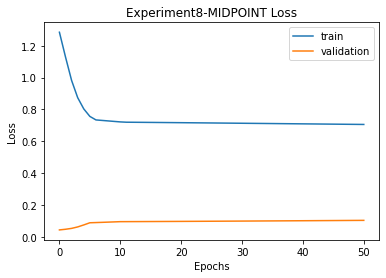


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 27.593274833467863 
RMSE:	 5.252930118844897 
MAPE:	 4.117405060238624

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 36.00024912834101 
RMSE:	 6.000020760659167 
MAPE:	 4.70426166066095

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 41.43257052147296 
RMSE:	 6.4368136932393005 
MAPE:	 5.073793611210466

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 181.24518187853474 
RMSE:	 13.462733076108087 
MAPE:	 12.35792879577932

KAMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 27.433326731723586 
RMSE:	 5.237683336335214 
MAPE:	 4.154161853007022

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 17.391761137690516 
RMSE:	 4.170343047962663 
MAPE:	 3.393694867236689
T3
T3([input_arrays], 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16318.604, Time=3.56 sec
 ARIMA(1,3,1)(0,0,0)[0] intercept   : AIC=-16567.270, Time=2.35 sec

Best model:  ARIMA(1,3,1)(0,0,0)[0]          
Total fit time: 55.608 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(1, 3, 1)   Log Likelihood                8308.635
Date:                Sun, 12 Dec 2021   AIC                         -16569.270
Time:                        16:25:22   BIC                         -16456.690
Sample:                             0   HQIC                        -16526.035
                                - 808                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------

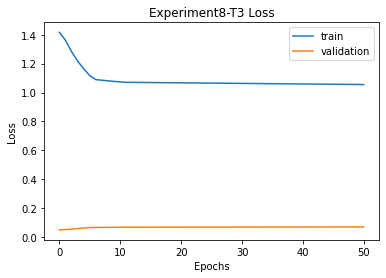


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 27.593274833467863 
RMSE:	 5.252930118844897 
MAPE:	 4.117405060238624

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 36.00024912834101 
RMSE:	 6.000020760659167 
MAPE:	 4.70426166066095

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 41.43257052147296 
RMSE:	 6.4368136932393005 
MAPE:	 5.073793611210466

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 181.24518187853474 
RMSE:	 13.462733076108087 
MAPE:	 12.35792879577932

KAMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 27.433326731723586 
RMSE:	 5.237683336335214 
MAPE:	 4.154161853007022

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 17.391761137690516 
RMSE:	 4.170343047962663 
MAPE:	 3.393694867236689

T3
Prediction vs Clos

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(2,3,2)(0,0,0)[0]             : AIC=-16200.149, Time=3.43 sec
 ARIMA(1,3,2)(0,0,0)[0]             : AIC=-16461.809, Time=16.42 sec
 ARIMA(3,3,0)(0,0,0)[0]             : AIC=-16384.147, Time=3.34 sec
 ARIMA(3,3,2)(0,0,0)[0]             : AIC=inf, Time=8.64 sec
 ARIMA(2,3,1)(0,0,0)[0] intercept   : AIC=-15110.164, Time=5.24 sec

Best model:  ARIMA(2,3,1)(0,0,0)[0]          
Total fit time: 83.700 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  808
Model:               SARIMAX(2, 3, 1)   Log Likelihood                8294.227
Date:                Sun, 12 Dec 2021   AIC                         -16538.454
Time:                        16:29:48   BIC                         -16421.183
Sample:                             0   HQIC                        -16493.417
                                - 808                                         
Covariance Type:                  o

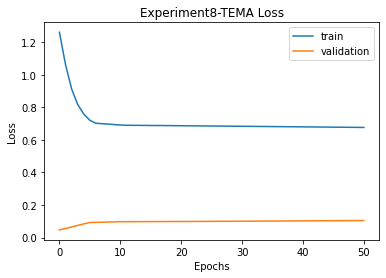


SMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	47.01% Accuracy
MSE:	 27.593274833467863 
RMSE:	 5.252930118844897 
MAPE:	 4.117405060238624

EMA
Prediction vs Close:		54.85% Accuracy
Prediction vs Prediction:	49.63% Accuracy
MSE:	 36.00024912834101 
RMSE:	 6.000020760659167 
MAPE:	 4.70426166066095

WMA
Prediction vs Close:		54.48% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 41.43257052147296 
RMSE:	 6.4368136932393005 
MAPE:	 5.073793611210466

DEMA
Prediction vs Close:		52.24% Accuracy
Prediction vs Prediction:	45.15% Accuracy
MSE:	 181.24518187853474 
RMSE:	 13.462733076108087 
MAPE:	 12.35792879577932

KAMA
Prediction vs Close:		56.72% Accuracy
Prediction vs Prediction:	46.27% Accuracy
MSE:	 27.433326731723586 
RMSE:	 5.237683336335214 
MAPE:	 4.154161853007022

MIDPOINT
Prediction vs Close:		51.87% Accuracy
Prediction vs Prediction:	44.78% Accuracy
MSE:	 17.391761137690516 
RMSE:	 4.170343047962663 
MAPE:	 3.393694867236689

T3
Prediction vs Clos

In [ ]:
if __name__ == '__main__':
    start_time = timeit.default_timer()
    simulation8 = {}
    imgfile = 'Experiment8'
    for ma in optimized_period:
                print(ma)
                print(functions[ma])
                print ( int( optimized_period[ma]))
              # if ma == 'SMA':
                low_vol = df.apply(lambda c:  functions[ma](c, timeperiod = int( optimized_period[ma])))
                low_vol = low_vol.fillna(0)
                low_vol_data = df['close']
                high_vol = pd.DataFrame()
                df2 = df.copy()
                for i in df2.columns:
                  if i in low_vol.columns:
                    high_vol[i] = df2[i].subtract(low_vol[i], fill_value=0)
                high_vol_data = df['close']
                ## *****************************************************
                # Generate ARIMA and LSTM predictions
                print('\nWorking on ' + ma + ' predictions')
                try:
                  print('parameters used : ', train_len, test_len)
                  low_vol_Original, low_vol_prediction, low_vol_mse, low_vol_rmse,low_vol_mae = get_arima_exog(low_vol,low_vol_data, train_len, test_len)
                except:
                    print('ARIMA error, skipping to next MA type')
                    continue
                Original_tr, predictiontr, mse_tr, rmse_tr,mae_tr,high_vol_Original, high_vol_prediction, high_vol_mse, high_vol_rmse,high_vol_mae, = get_lstm(high_vol,high_vol_data, train_len, test_len,imgfile,ma)
                final_prediction_tr = df['close'].head(train_len).values + pd.Series(predictiontr) # ignoring first 3 steps 
                mse_ftr = mean_squared_error(df['close'].head(train_len).values,final_prediction_tr.values)
                rmse_ftr = mse_ftr ** 0.5
                mape_ftr = mean_absolute_percentage_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)
                mae_ftr = mean_absolute_error(df['close'].head(train_len).reset_index(drop=True), final_prediction_tr)

                final_prediction = pd.Series(low_vol_prediction[3:]) + pd.Series(high_vol_prediction)
                mse = mean_squared_error(df['close'].tail(test_len).values,final_prediction.values)
                rmse = mse ** 0.5
                mape = mean_absolute_percentage_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                mae = mean_absolute_error(df['close'].tail(test_len).reset_index(drop=True), final_prediction)
                # Generate prediction accuracy
                actual = df['close'].tail(test_len).values
                result_1 = []
                result_2 = []
                for i in range(1, len(final_prediction)):
                    # Compare prediction to previous close price
                    if final_prediction[i] > actual[i-1] and actual[i] > actual[i-1]:
                        result_1.append(1)
                    elif final_prediction[i] < actual[i-1] and actual[i] < actual[i-1]:
                        result_1.append(1)
                    else:
                        result_1.append(0)

                    # Compare prediction to previous prediction
                    if final_prediction[i] > final_prediction[i-1] and actual[i] > actual[i-1]:
                        result_2.append(1)
                    elif final_prediction[i] < final_prediction[i-1] and actual[i] < actual[i-1]:
                        result_2.append(1)
                    else:
                        result_2.append(0)

                accuracy_1 = np.mean(result_1)
                accuracy_2 = np.mean(result_2)

                simulation8[ma] = {'low_vol': {'original':list(low_vol_Original), 'prediction': list(low_vol_prediction) , 'mse': low_vol_mse,
                                              'rmse': low_vol_rmse, 'mae' : low_vol_mae},
                                  'high_vol': {'original':list(high_vol_Original),'prediction': list(high_vol_prediction), 'mse': high_vol_mse,
                                              'rmse': high_vol_rmse, 'mae' : high_vol_mae},
                                  'final_tr': {'original':df['close'].head(train_len).tolist(),'prediction': final_prediction_tr.values.tolist(), 'mse': mse_ftr,
                                              'rmse': rmse_ftr, 'mae' : mae_ftr},
                                  'final': {'original': df['close'].tail(test_len).tolist(), 'prediction': final_prediction.values.tolist(), 'mse': mse,
                                            'rmse': rmse, 'mae': mae },
                                  'accuracy': {'prediction vs close': accuracy_1, 'prediction vs prediction': accuracy_2}}

                # save simulation data here as checkpoint
                with open('simulation8_data.json', 'w') as fp:
                    json.dump(simulation8, fp)

                for ma in simulation8.keys():
                    print('\n' + ma)
                    print('Prediction vs Close:\t\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs close'], 2))
                          + '% Accuracy')
                    print('Prediction vs Prediction:\t' + str(round(100*simulation8[ma]['accuracy']['prediction vs prediction'], 2))
                          + '% Accuracy')
                    print('MSE:\t', simulation8[ma]['final']['mse'],
                          '\nRMSE:\t', simulation8[ma]['final']['rmse'],
                          '\nMAPE:\t', simulation8[ma]['final']['mae'])#,
                          # '\nMAPE:\t', simulation[ma]['final']['mape'])
              # else:
              #   break
    elapsed = timeit.default_timer() - start_time
    print('Runtime: mins:',elapsed/60)

### Architecture Used

In [ ]:
from google.colab import files
import cv2
uploaded = files.upload()

In [ ]:
img = cv2.imread('Experiment5.png')
plt.figure(figsize=(20,10))
plt.axis("off")
plt.title('LSTM Architecture '+imgfile,fontsize=18)
plt.imshow(img)

### Model Plots

In [85]:
with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)
fileimg = 'Experiment8'

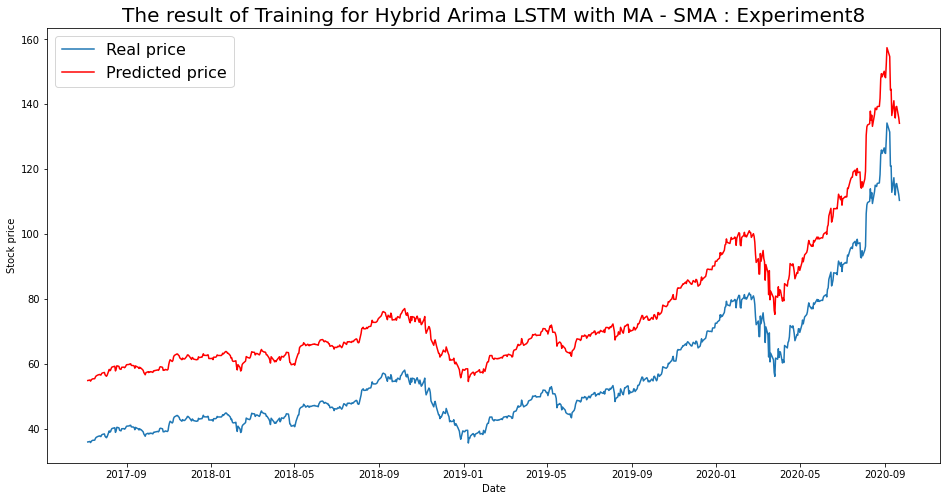

----- Train RMSE for SMA ----- 19.309560563509795
----- Train_MSE_LSTM for SMA ----- 372.8591291558527
----- Train MAE LSTM for SMA ----- 19.28235636135139


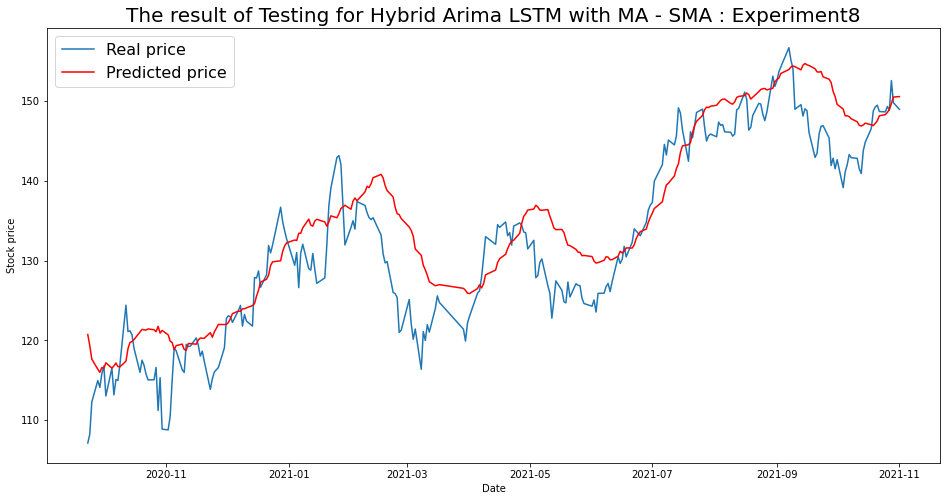

----- Test RMSE for SMA----- 5.252930118844897
----- Test_MSE_LSTM for SMA----- 27.593274833467863
----- Test_MAE_LSTM for SMA----- 4.117405060238624


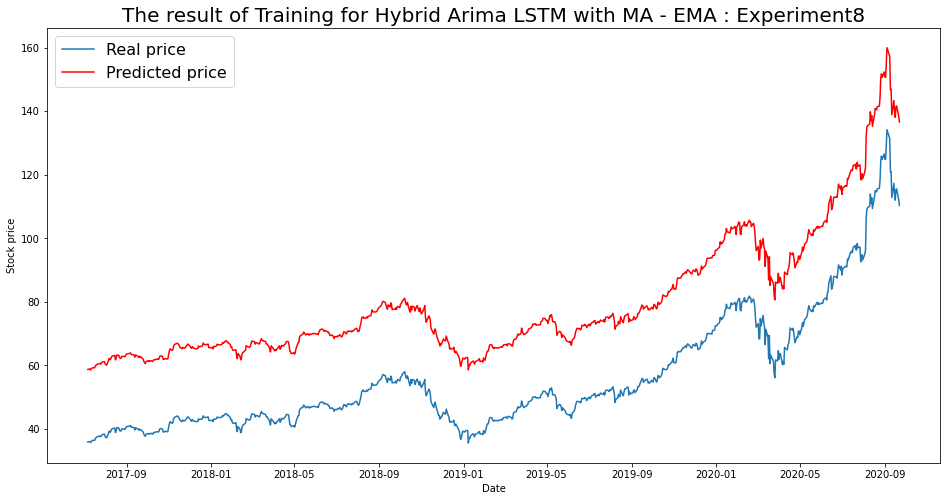

----- Train RMSE for EMA ----- 23.393549647032383
----- Train_MSE_LSTM for EMA ----- 547.258165088169
----- Train MAE LSTM for EMA ----- 23.379056536325134


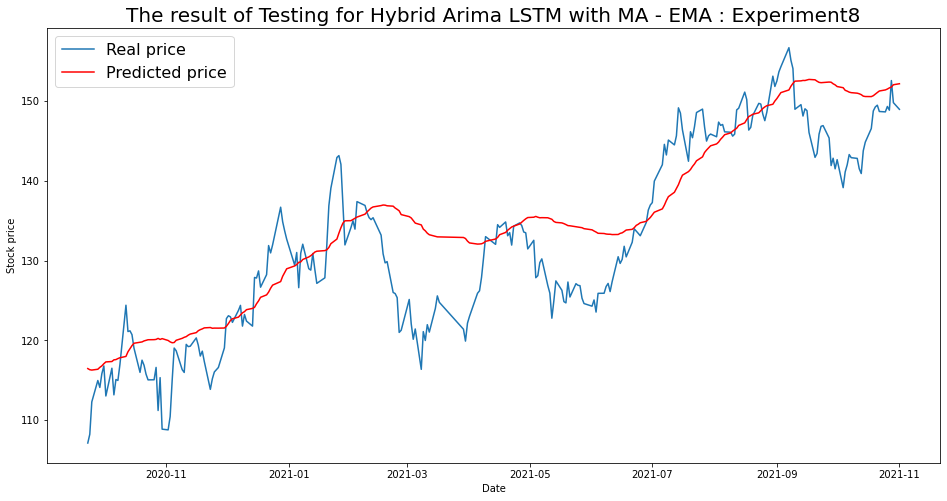

----- Test RMSE for EMA----- 6.000020760659167
----- Test_MSE_LSTM for EMA----- 36.00024912834101
----- Test_MAE_LSTM for EMA----- 4.70426166066095


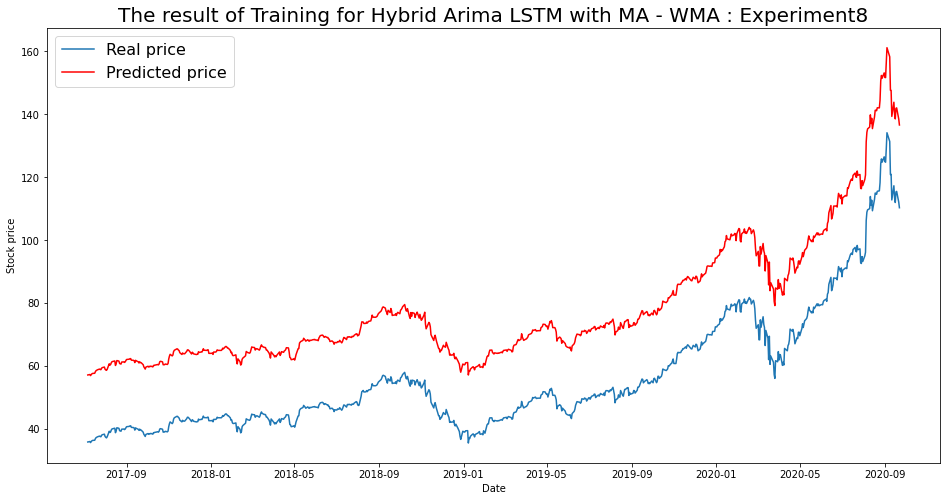

----- Train RMSE for WMA ----- 21.96266675676863
----- Train_MSE_LSTM for WMA ----- 482.35873106886993
----- Train MAE LSTM for WMA ----- 21.93508726535457


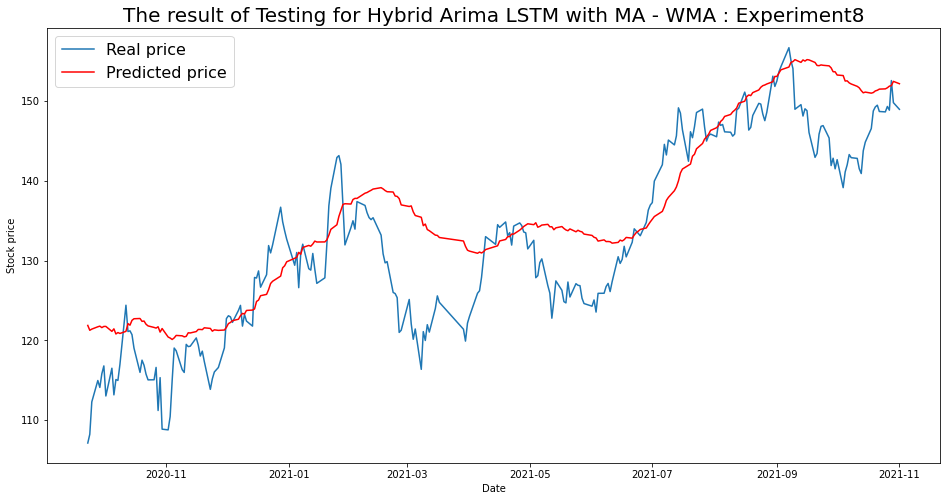

----- Test RMSE for WMA----- 6.4368136932393005
----- Test_MSE_LSTM for WMA----- 41.43257052147296
----- Test_MAE_LSTM for WMA----- 5.073793611210466


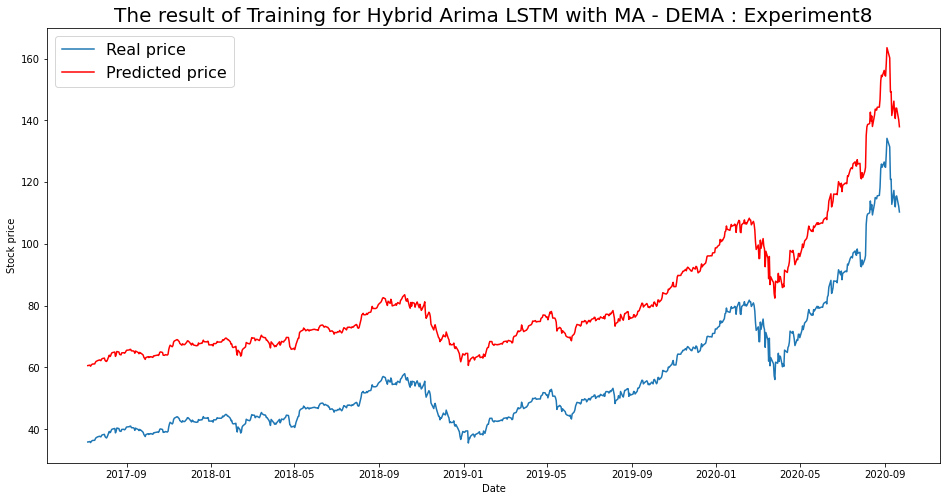

----- Train RMSE for DEMA ----- 25.637680841649903
----- Train_MSE_LSTM for DEMA ----- 657.2906789383026
----- Train MAE LSTM for DEMA ----- 25.614362844146125


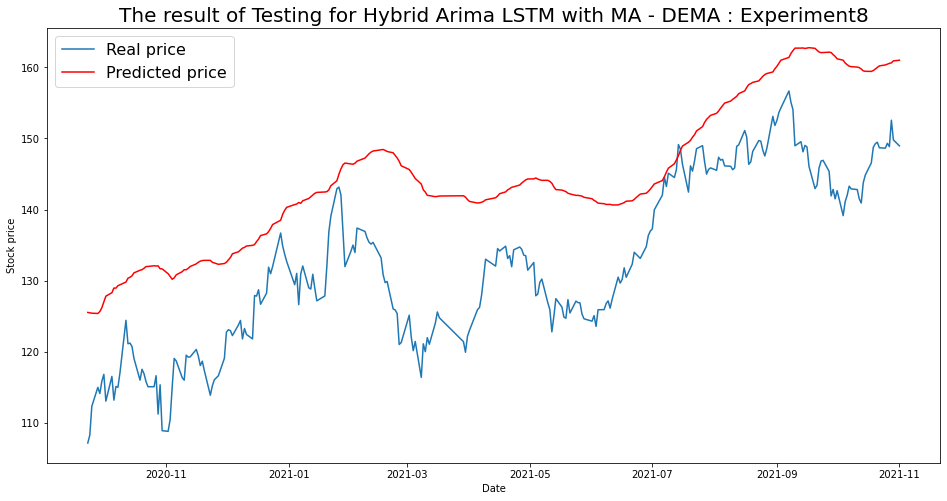

----- Test RMSE for DEMA----- 13.462733076108087
----- Test_MSE_LSTM for DEMA----- 181.24518187853474
----- Test_MAE_LSTM for DEMA----- 12.35792879577932


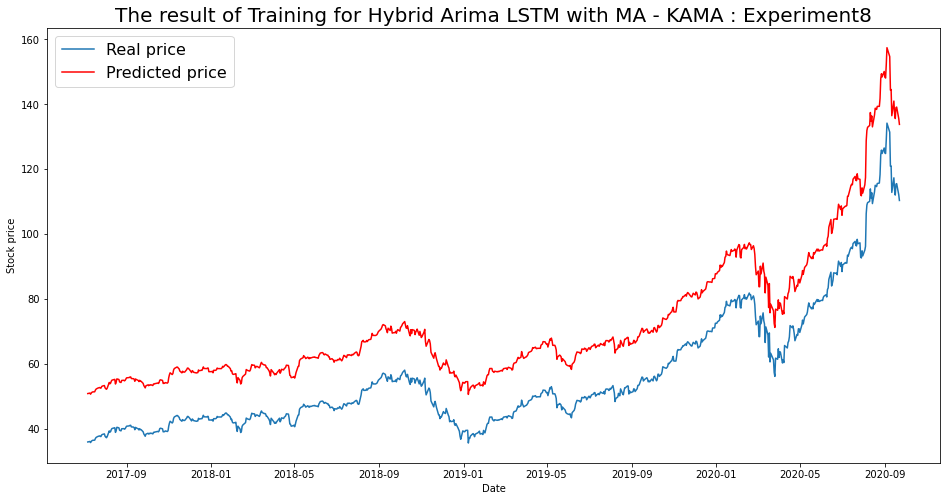

----- Train RMSE for KAMA ----- 15.645649078988193
----- Train_MSE_LSTM for KAMA ----- 244.78633510284408
----- Train MAE LSTM for KAMA ----- 15.537092394167834


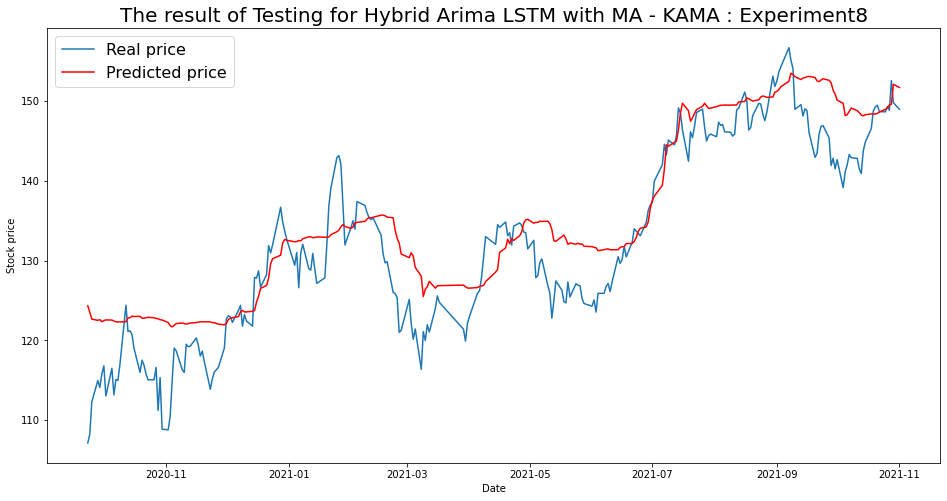

----- Test RMSE for KAMA----- 5.237683336335214
----- Test_MSE_LSTM for KAMA----- 27.433326731723586
----- Test_MAE_LSTM for KAMA----- 4.154161853007022


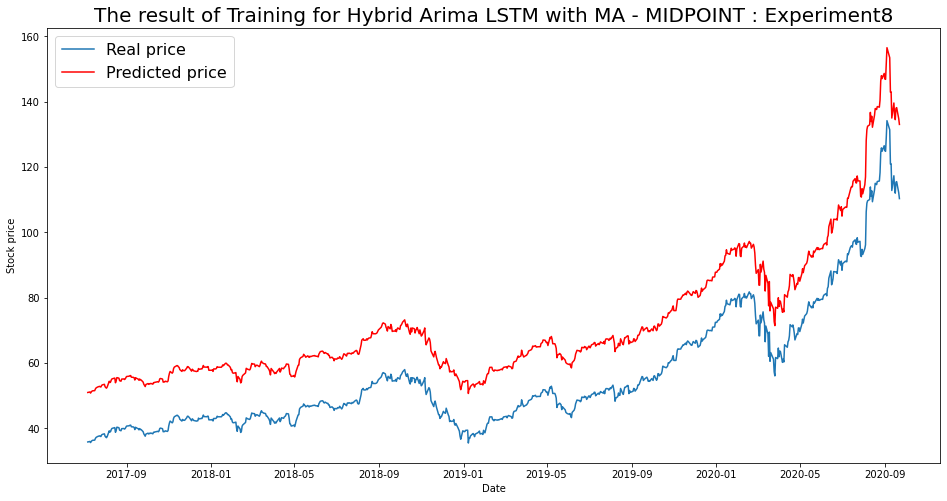

----- Train RMSE for MIDPOINT ----- 15.708219768951658
----- Train_MSE_LSTM for MIDPOINT ----- 246.74816830968368
----- Train MAE LSTM for MIDPOINT ----- 15.633552206624852


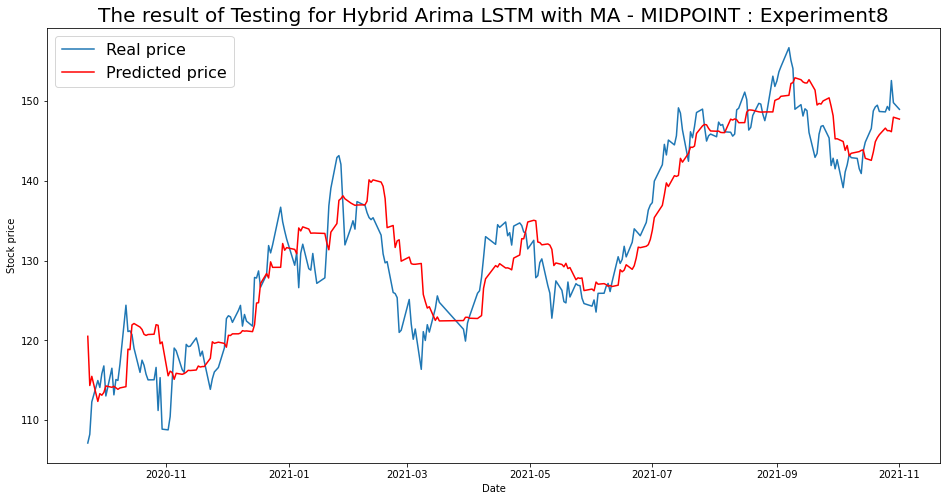

----- Test RMSE for MIDPOINT----- 4.170343047962663
----- Test_MSE_LSTM for MIDPOINT----- 17.391761137690516
----- Test_MAE_LSTM for MIDPOINT----- 3.393694867236689


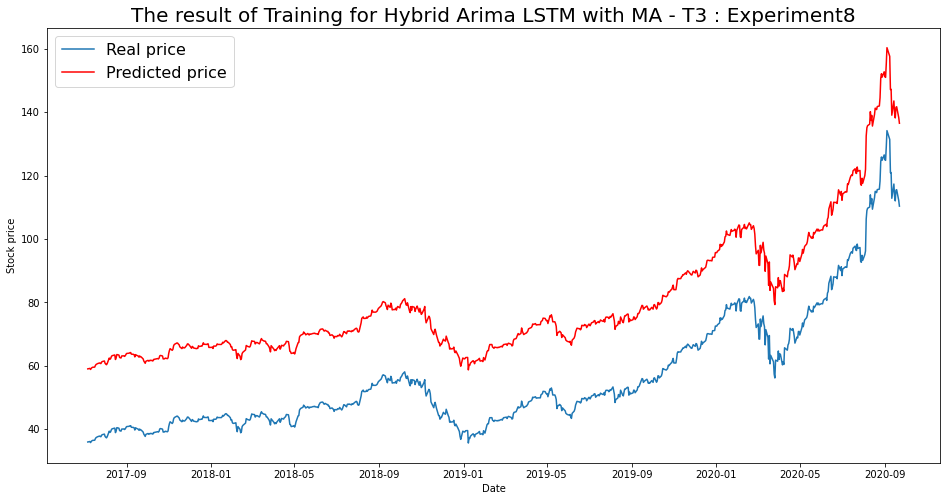

----- Train RMSE for T3 ----- 23.305790930247145
----- Train_MSE_LSTM for T3 ----- 543.15989088439
----- Train MAE LSTM for T3 ----- 23.296647801257595


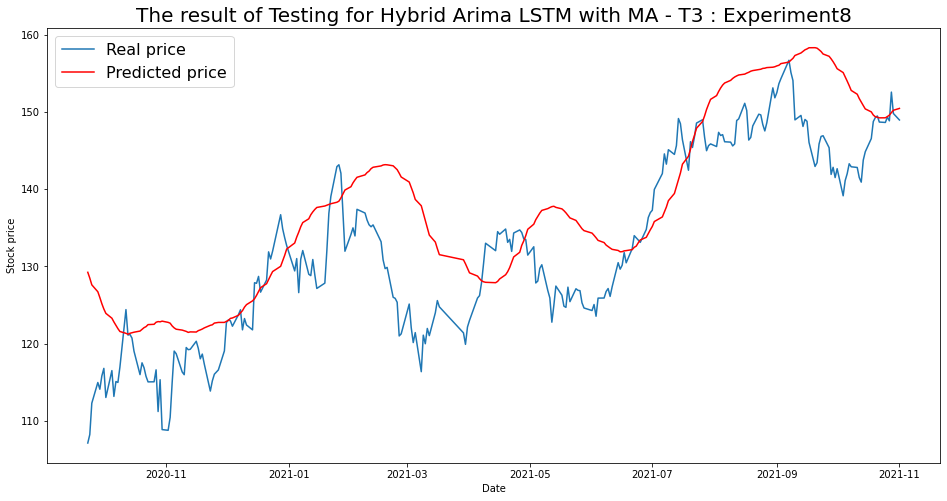

----- Test RMSE for T3----- 8.122440285240321
----- Test_MSE_LSTM for T3----- 65.97403618729489
----- Test_MAE_LSTM for T3----- 6.528054740759965


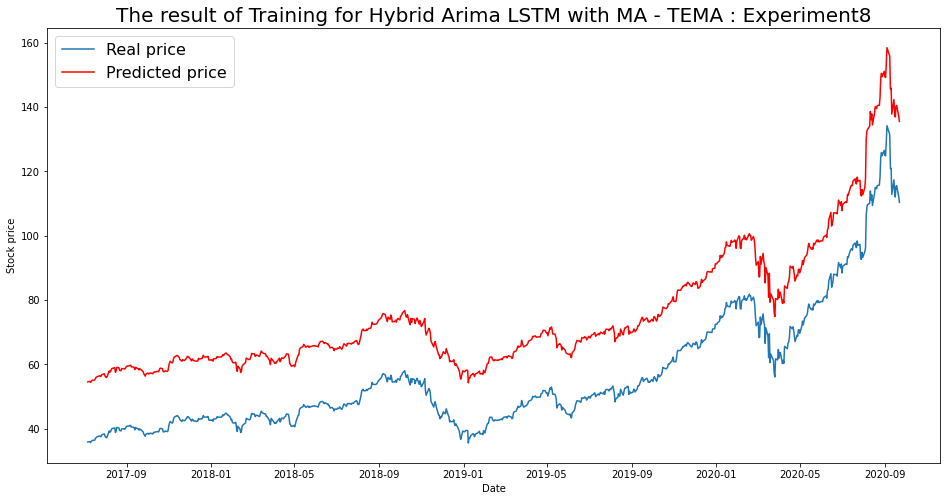

----- Train RMSE for TEMA ----- 19.052881062333018
----- Train_MSE_LSTM for TEMA ----- 363.0122767754081
----- Train MAE LSTM for TEMA ----- 19.014995029657193


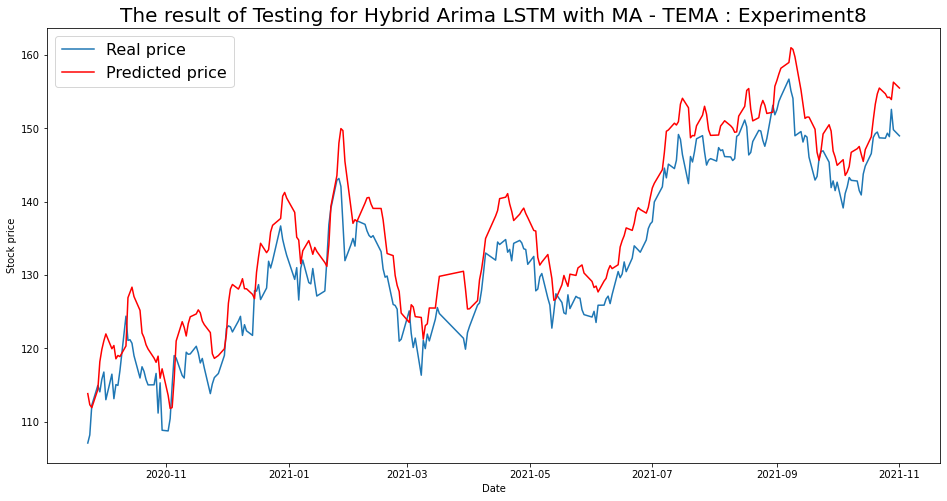

----- Test RMSE for TEMA----- 4.8765955661855545
----- Test_MSE_LSTM for TEMA----- 23.78118431614061
----- Test_MAE_LSTM for TEMA----- 4.3174203405459135


In [86]:
for i in range(len(list(simulation8.keys()))):
  SIM = list(simulation8.keys())[i]
  plot_train(simulation8,SIM)
  plot_test(simulation8,SIM)

## List of RMSE, MSE & MAE scores for Test data

In [ ]:
import json
with open('simulation1_data.json') as json_file:
    simulation1 = json.load(json_file)

with open('simulation2_data.json') as json_file:
    simulation2 = json.load(json_file)

with open('simulation3_data.json') as json_file:
    simulation3 = json.load(json_file)

with open('simulation4_data.json') as json_file:
    simulation4 = json.load(json_file)

with open('simulation5_data.json') as json_file:
    simulation5 = json.load(json_file)

with open('simulation6_data.json') as json_file:
    simulation6 = json.load(json_file)

with open('simulation7_data.json') as json_file:
    simulation7 = json.load(json_file)

with open('simulation8_data.json') as json_file:
    simulation8 = json.load(json_file)

In [ ]:
text = 'Stock with Google Trends '
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Google Trends Experiment  1  for MA : SMA the MSE  is:  216.26215770312788
Stock with Google Trends Experiment  1  for MA : SMA the RMSE is:  14.705854538350632
Stock with Google Trends Experiment  1  for MA : SMA the MAE is:  11.92367463073216
Stock with Google Trends Experiment  1  for MA : EMA the MSE  is:  122.96033735804009
Stock with Google Trends Experiment  1  for MA : EMA the RMSE is:  11.08874823224155
Stock with Google Trends Experiment  1  for MA : EMA the MAE is:  9.251696034357076
Stock with Google Trends Experiment  1  for MA : WMA the MSE  is:  56.80196950717294
Stock with Google Trends Experiment  1  for MA : WMA the RMSE is:  7.5367081346681415
Stock with Google Trends Experiment  1  for MA : WMA the MAE is:  5.956122993340066
Stock with Google Trends Experiment  1  for MA : DEMA the MSE  is:  120.51656357671082
Stock with Google Trends Experiment  1  for MA : DEMA the RMSE is:  10.978003624371365
Stock with Google Trends Experiment  1  for MA : DEMA the MA

In [ ]:
text = 'Stock with Google Trends '
simulations = [simulation1,simulation2,simulation3,simulation4,simulation5,simulation6,simulation7,simulation8]
for i,simulation in enumerate(simulations):
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])
  for ma in simulation.keys():
    # print(text+'Experiment ',i+1,' for MA :',ma,'the MSE  is: ',simulation[ma]['final']['mse'])
    # print(text+'Experiment ',i+1,' for MA :',ma,'the RMSE is: ',simulation[ma]['final']['rmse'])
    print(text+'Experiment ',i+1,' for MA :',ma,'the MAE is: ',simulation[ma]['final']['mae'])

Stock with Google Trends Experiment  1  for MA : SMA the RMSE is:  14.705854538350632
Stock with Google Trends Experiment  1  for MA : EMA the RMSE is:  11.08874823224155
Stock with Google Trends Experiment  1  for MA : WMA the RMSE is:  7.5367081346681415
Stock with Google Trends Experiment  1  for MA : DEMA the RMSE is:  10.978003624371365
Stock with Google Trends Experiment  1  for MA : KAMA the RMSE is:  8.985101959931402
Stock with Google Trends Experiment  1  for MA : MIDPOINT the RMSE is:  8.70639453041356
Stock with Google Trends Experiment  1  for MA : T3 the RMSE is:  6.808926702415001
Stock with Google Trends Experiment  1  for MA : TEMA the RMSE is:  5.658627776722337
Stock with Google Trends Experiment  1  for MA : SMA the MSE  is:  216.26215770312788
Stock with Google Trends Experiment  1  for MA : EMA the MSE  is:  122.96033735804009
Stock with Google Trends Experiment  1  for MA : WMA the MSE  is:  56.80196950717294
Stock with Google Trends Experiment  1  for MA : DEMA 

## Create HTML

In [90]:
cd ..

/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid


In [3]:
cd drive/MyDrive/Stock price prediction/Archana - LSTM Hybrid


/content/drive/.shortcut-targets-by-id/1IaGjVBlTspxI2CHSrxfYnaiYvsaG0pHs/Stock price prediction/Archana - LSTM Hybrid


In [4]:
%%shell
jupyter nbconvert --to html LSTM_Hybrid_using_TA_LIB_Google_Trends.ipynb

[NbConvertApp] Converting notebook LSTM_Hybrid_using_TA_LIB_Google_Trends.ipynb to html
[NbConvertApp] ERROR | Notebook JSON is invalid: Additional properties are not allowed (u'metadata' was unexpected)

Failed validating u'additionalProperties' in stream:

On instance[u'cells'][156][u'outputs'][0]:
{u'metadata': {u'tags': None},
 u'name': u'stdout',
 u'output_type': u'stream',
 u'text': u'SMA\nSMA([input_arrays], [timeperiod=30])\n\nSimple Moving Average (Overlap Studies)\n\nInputs:\n    price: (any ndarray)\nParameters:\n    timeperiod: 30\nOutputs:\n    real\n17\n\nWorking on SMA predictions\nparameters used :  808 269\nPerforming stepwise search to minimize aic\n ARIMA(1,3,1)(0,0,0)[0]             : AIC=-15000.708, Time=9.21 sec\n ARIMA(0,3,0)(0,0,0)[0]             : AIC=-13492.284, Time=2.24 sec\n ARIMA(1,3,0)(0,0,0)[0]             : AIC=-15827.971, Time=8.03 sec\n ARIMA(0,3,1)(0,0,0)[0]             : AIC=-13635.197, Time=10.27 sec\n ARIMA(2,3,0)(0,0,0)[0]             : AIC=-1413